In [1]:
import os
import csv
import optuna
import numpy as np
import pandas as pd
from tensorflow import keras
from tensorflow.keras.optimizers import Adam, RMSprop, SGD
import tensorflow as tf
from keras.models import Sequential
from keras.layers import Input, Conv1D, MaxPooling1D, LSTM, Dense, Activation, Dropout
from pandas import DataFrame
from pandas import Series
from pandas import concat
from pandas import read_csv
from datetime import datetime
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import KFold
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from math import sqrt
from matplotlib import pyplot as plt
from matplotlib.patches import Patch
from numpy import array
import keras.backend as K
import itertools
#!pip install pydot
    
# date-time parsing function for loading the dataset
def parser(x):
    return datetime.strptime('190'+x, '%Y-%m')
    
def rmse (y_true, y_pred):
    return K.sqrt(K.mean(K.square(y_pred - y_true)))
    
def mape (y_true, y_pred):
    return 100*K.mean(K.sqrt(K.square(y_true - y_pred))/y_true)
    
def pearson (y_true, y_pred):
    return (K.square(K.mean((y_true - K.mean(y_true))*(y_pred - K.mean(y_pred)))))/(K.mean(K.square(y_true - K.mean(y_true)))*K.mean(K.square(y_pred - K.mean(y_pred))))
    
# convert time series into a supervised learning problem
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
# convert time series into a supervised learning problem
def series_to_supervised(data, n_in=1, n_out=1, dropnan=True):

    n_vars = 1 if type(data) is list else data.shape[1]
    cols, names = list(), list()
    df = DataFrame(data)
    # input sequence (t-n, ... t-1)
    for i in range(n_in, 0, -1):
    	cols.append(df.shift(i))
    	names += [('var%d(t-%d)' % (j+1, i)) for j in range(n_vars)]
    # forecast sequence (t, t+1, ... t+n)
    for i in range(0, n_out):
        cols.append(df[0].shift(-i)) # df[0] for temperatures
        if i == 0:
            names += [('var%d(t)' % (1))] # % (1) for temperatures
        else:            
            names += [('var%d(t+%d)' % (1, i))] # % (1) for temperatures
    
    # put it all together
    agg = concat(cols, axis=1)

    if dropnan:
        #Drop rows containing NaN
        agg.dropna(inplace=True)

    agg.columns = names

    return agg
     
# create a differenced series
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def difference(dataset, interval=1):
    diff = list()
    for i in range(interval, len(dataset)):
        value = dataset[i] - dataset[i - interval]
        diff.append(value)
    return Series(diff)
     
# transform series into training sets for supervised learning
def prepare_training_data(data, n_lag, n_seq, n_time_steps):
    
    #Prepare data for time series forecasting.
        
    #Parameters:
    #x (array-like): Input features.
    #y (array-like): Target values.
    #n_test (int): Number of test samples (rows).
    #n_lag (int): Number of lag observations.
    #n_seq (int): Number of sequence observations.
    #n_train (int): Number of training samples (rows).
        
    #Returns:
    #tuple: Training and test datasets.
    
    n_vars = len(data[0][0])

    # Each weather station has 227 time steps (the first 180 have no nan values)
    # Loop through data, grabbing one weather station (ws) at a time, 
    # differencing on each ws and separating by training (first 226-n_lag-n_seq-n_test time steps) 
    # and testing (n_test time steps) to scale data on training only.
    # We then recombine the training and testing datasets to change each ws to a supervised learning problem by taking all the first 180 time steps for all 12 predictors
    # and changing these to (t-n_lag) to (t-1) since we lose one row through differencing. We then shift forward only one dependent variable (temperature or specific humidity)
    # for time steps t to (t+n_seq)

    diff_values = []
    
    for ws in range(84):
        
        # transform data to be stationary
        diff_series = difference(data[ws], 1)
        for i in range(len(diff_series)):
            diff_values_row = []
            for j in range(len(diff_series[0])):
                diff_values_row.append(diff_series[i][j])
            diff_values.append(diff_values_row)

    # rescale values to 0, 1
    scaler_all_features =  MinMaxScaler(feature_range=(0, 1))
    scaler =  MinMaxScaler(feature_range=(0, 1))
    #diff_values_training = np.array(diff_values_for_training)
    #diff_values_training = diff_values_training.reshape(1, -1) 
    train_scaled_values = scaler_all_features.fit_transform(diff_values)
    response_train_values = []
    for i in range(len(diff_values)):
        response_train_values.append(diff_values[i][0]) # Uses first column (temperatures) as response variable
    response_train_values = np.array(response_train_values)
    response_train_values = response_train_values.reshape(len(response_train_values), 1)

    # Fit the scaler for just the response variable for use later when forecasting
    response_scaled_values = scaler.fit_transform(response_train_values) 
    scaled_values = scaler_all_features.transform(diff_values)

    train = []

    # Transform each weather station as a separate "batch"
    for ws in range(84):
        # transform into supervised learning problem X, y
        first = (n_time_steps-1)*ws
        last = (n_time_steps-1)*ws+(n_time_steps-2)
        scaled_values_batch = scaled_values[first:last]
        supervised = series_to_supervised(scaled_values_batch, n_lag, n_seq)
        supervised_values = supervised.values
        train.append([supervised_values])
    
    return scaler, scaler_all_features, train

# transform series into testing and validation sets for supervised learning
def prepare_testing_and_validation_data(data, n_lag, n_seq, n_time_steps, scaler_all_features):
    
    #Prepare data for time series forecasting.
        
    #Parameters:
    #x (array-like): Input features.
    #y (array-like): Target values.
    #n_test (int): Number of test samples (rows).
    #n_lag (int): Number of lag observations.
    #n_seq (int): Number of sequence observations.
    #n_train (int): Number of training samples (rows).
        
    #Returns:
    #tuple: Training and test datasets.
    
    n_vars = len(data[0][0])

    # Each weather station has 227 time steps (the first 180 have no nan values)
    # Loop through data, grabbing one weather station (ws) at a time, 
    # differencing on each ws and separating by training (first 226-n_lag-n_seq-n_test time steps) 
    # and testing (n_test time steps) to scale data on training only.
    # We then recombine the training and testing datasets to change each ws to a supervised learning problem by taking all the first 180 time steps for all 12 predictors
    # and changing these to (t-n_lag) to (t-1) since we lose one row through differencing. We then shift forward only one dependent variable (temperature or specific humidity)
    # for time steps t to (t+n_seq)

    diff_values = []
    
    for ws in range(21):
        
        # transform data to be stationary
        diff_series = difference(data[ws], 1)
        for i in range(len(diff_series)):
            diff_values_row = []
            for j in range(len(diff_series[0])):
                diff_values_row.append(diff_series[i][j])
            diff_values.append(diff_values_row)

    # rescale values to 0, 1
    scaled_values = scaler_all_features.transform(diff_values)

    validation = []
    test = []

    # Transform each weather station as a separate "batch"
    for ws in range(21):
        # transform into supervised learning problem X, y
        first = (n_time_steps-1)*ws
        last = (n_time_steps-1)*ws+(n_time_steps-2)
        scaled_values_batch = scaled_values[first:last]
        supervised = series_to_supervised(scaled_values_batch, n_lag, n_seq)
        supervised_values = supervised.values
        # training/test/validation split is 80%/10%/10%
        if ws < 11:
            test.append([supervised_values])
        else:
            validation.append([supervised_values])
    
    return validation, test
    
def plot_kfold(cv, X, y, ax, n_splits, xlim_max=105):
    
    #Plots the indices for a cross-validation object.
    #Taken from https://www.geeksforgeeks.org/cross-validation-using-k-fold-with-scikit-learn/
    
    #Parameters:
    #cv: Cross-validation object
    #X: Feature set
    #y: Target variable
    #ax: Matplotlib axis object
    #n_splits: Number of folds in the cross-validation
    #xlim_max: Maximum limit for the x-axis
        
    # Set color map for the plot
    cmap_cv = plt.cm.coolwarm
    cv_split = cv.split(X=X, y=y)
        
    for i_split, (train_idx, test_idx) in enumerate(cv_split):
        # Create an array of NaNs and fill in training/testing indices
        indices = np.full(len(X), np.nan)
        indices[test_idx], indices[train_idx] = 1, 0
            
        # Plot the training and testing indices
        ax_x = range(len(indices))
        ax_y = [i_split + 0.5] * len(indices)
        ax.scatter(ax_x, ax_y, c=indices, marker="_", 
                   lw=10, cmap=cmap_cv, vmin=-0.2, vmax=1.2)
    
        # Set y-ticks and labels
        y_ticks = np.arange(n_splits) + 0.5
        ax.set(yticks=y_ticks, yticklabels=range(n_splits),
               xlabel="Weather Station index (file_id)", ylabel="Fold",
               ylim=[n_splits, -0.2], xlim=[0, xlim_max])
    
        # Set plot title and create legend
        ax.set_title("KFold", fontsize=14)
        legend_patches = [Patch(color=cmap_cv(0.8), label="Testing set"), 
                          Patch(color=cmap_cv(0.02), label="Training set")]
        ax.legend(handles=legend_patches, loc=(1.03, 0.8))
    
#Main

#Configure
n_seq = 6
if n_seq > 46:
    n_lag = 179 - n_seq + 46
else:
    n_lag = 179
n_time_steps = 227
n_test = 1

print("Model Parameters:")
print("n_lag (number of input time steps): "+str(n_lag))
print("n_seq (number of output/future prediction time steps): "+str(n_seq))

# Create 2D array with file_ids to use for sample creation
array = np.array([
    6501, 6541, 6640, 6668, 6678, 
    6687, 6697, 6714, 6744, 6772, 
    6783, 6840, 6844, 6854, 6870, 
    6891, 6895, 6899, 6901, 6909, 
    6929, 6950, 6963, 6969, 6994, 
    7032, 7057, 7094, 7095, 7100, 
    7108, 7116, 7119, 7131, 7139, 
    7152, 7155, 7156, 7182, 7193, 
    7202, 7239, 7280, 7286, 7287, 
    7311, 7321, 7329, 7347, 7350, 
    7354, 7357, 7361, 7414, 7423, 
    7424, 7432, 7463, 7482, 7489, 
    7528, 7531, 7534, 7538, 7549, 
    7553, 7555, 7562, 7571, 7573, 
    7574, 7575, 7585, 7599, 7603, 
    7606, 7622, 7652, 7671, 7704, 
    7786, 7805, 7816, 7838, 7861, 
    7862, 7863, 7870, 7892, 7907, 
    7938, 7962, 7979, 7987, 7999, 
    8000, 8034, 8083, 8120, 8133, 
    8184, 8186, 8247, 8248, 9858])
    
#Create arrays holding the 5-fold cross-validation indices gathered for consistency across models
train_array = []
test_array = []
    
train_array.append([1, 2, 3, 5, 6, 7, 8, 9, 11, 13, 14, 15, 16, 17, 19, 20, 21, 22, 
                        23, 24, 25, 27, 28, 29, 32, 34, 35, 36, 37, 38, 39, 40, 41, 42, 
                        43, 44, 46, 48, 49, 50, 51, 52, 54, 55, 56, 57, 58, 59, 60, 61, 
                        62, 63, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 78, 79, 81, 
                        82, 83, 84, 85, 86, 87, 88, 90, 91, 92, 93, 95, 97, 98, 100, 101, 102, 103])
test_array.append([0, 4, 10, 12, 18, 26, 30, 31, 33, 45, 47, 53, 64, 65, 77, 80, 89, 94, 96, 99, 104])
    
train_array.append([0, 1, 2, 3, 4, 6, 7, 8, 10, 12, 13, 14, 17, 18, 19, 20, 21, 23, 
                        24, 25, 26, 27, 29, 30, 31, 32, 33, 34, 36, 37, 38, 41, 43, 45, 
                        46, 47, 48, 49, 50, 51, 52, 53, 54, 57, 58, 59, 60, 61, 63, 64, 
                        65, 66, 67, 68, 69, 70, 71, 73, 74, 75, 77, 80, 81, 82, 83, 84, 
                        86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 104])
test_array.append([5, 9, 11, 15, 16, 22, 28, 35, 39, 40, 42, 44, 55, 56, 62, 72, 76, 78, 79, 85, 103])
    
train_array.append([0, 1, 2, 4, 5, 9, 10, 11, 12, 14, 15, 16, 18, 20, 21, 22, 23, 26, 
                    28, 29, 30, 31, 32, 33, 35, 36, 37, 39, 40, 41, 42, 44, 45, 46, 47, 
                    48, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 
                    70, 71, 72, 74, 75, 76, 77, 78, 79, 80, 82, 83, 85, 86, 87, 88, 89, 
                    90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104])
test_array.append([3, 6, 7, 8, 13, 17, 19, 24, 25, 27, 34, 38, 43, 49, 66, 67, 68, 69, 73, 81, 84])
    
train_array.append([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 
                        18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 33, 34, 
                        35, 37, 38, 39, 40, 42, 43, 44, 45, 47, 49, 51, 52, 53, 55, 56, 
                        60, 62, 64, 65, 66, 67, 68, 69, 71, 72, 73, 74, 76, 77, 78, 79, 
                        80, 81, 82, 84, 85, 86, 87, 88, 89, 92, 93, 94, 95, 96, 99, 102, 103, 104])
test_array.append([32, 36, 41, 46, 48, 50, 54, 57, 58, 59, 61, 63, 70, 75, 83, 90, 91, 97, 98, 100, 101])
    
train_array.append([0, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 15, 16, 17, 18, 19, 22,
                        24, 25, 26, 27, 28, 30, 31, 32, 33, 34, 35, 36, 38, 39, 40, 41, 
                        42, 43, 44, 45, 46, 47, 48, 49, 50, 53, 54, 55, 56, 57, 58, 59, 
                        61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 72, 73, 75, 76, 77, 78, 
                        79, 80, 81, 83, 84, 85, 89, 90, 91, 94, 96, 97, 98, 99, 100, 101, 103, 104])
test_array.append([1, 2, 14, 20, 21, 23, 29, 37, 51, 52, 60, 71, 74, 82, 86, 87, 88, 92, 93, 95, 102])
    
# Equations for three Principal Components from PCA using response variables combined with other predictors
#PC1=-0.0002714X1+0.02612X2+0.03858X3-0.007658X4+0.001592X5-0.02087X6+0.8564X7-0.1468X8+0.01192X9-0.0001049X10+0.01913X11+0.02076X12
#PC2=0.0003944X1+0.002204X2+0.01052X3+0.3248X4-0.0009976X5-0.04421X6+2.3406X7+0.06103X8+0.08841X9+0.00009018X10+0.05678X11-0.002022X12
#PC3=-0.00007998X1-0.0006124X2-0.001063X3-0.01855X4+0.00001956X5+0.01170X6+0.6076X7+0.4664X8-0.002995X9+0.008185X10+0.8815X11-0.0004730X12
    
# Equations for three Principal Components from PCA omitting both response variables,
#PC-1=-0.0004514X1+0.03194X2-0.04343X3+0.002243X4-0.02252X5+0.9877X6-0.2265X7+0.006144X8-0.0001488X9+0.02943X10
#PC-2=0.0001702X1+0.005484X2+0.2057X3-0.0003188X4-0.02584X5+1.6963X6-0.05890X7+0.05809X8+1.9748X9+0.03686X10
#PC-3=-0.00006323X1-0.001180X2-0.02384X3-0.00002833X4+0.01170X5+0.5204X6+0.4791X7-0.004318X8+0.008271X9+0.8765X10
    
# Get the current working directory 
current_directory = os.getcwd() 
    
# Print the current working directory 
print(current_directory)
    
# Define the directory containing the files 
path = current_directory+"\\Modeling\\"
print(path)
    
filename = path + 'Final_Monthly_Dataset.csv'
    
# load dataset
df = read_csv(filename, header=0, parse_dates=[0], index_col=0, date_format='%Y-%m')

print(df)
    
df = df.rename(columns={'Unnamed: 0' : 'indices'})
    
#Remove unused columns
df = df.drop(['Day', 'vapor_pressure'], axis=1)
    
# Round numbers in columns to reasonable precision,
df['temperatures'] = np.round(df['temperatures'], 2)
df['slp'] = np.round(df['slp'], 2)
df['wet_bulb_temperature'] = np.round(df['wet_bulb_temperature'], 2)
df['specific_humidity'] = np.round(df['specific_humidity'], 2)
df['GHI'] = np.round(df['GHI'], 2)
df['PRCP'] = np.round(df['PRCP'], 2)
df['SNDP'] = np.round(df['SNDP'], 2)
df['solar_activity'] = np.round(df['solar_activity'], 2)
df['ONI'] = np.round(df['ONI'], 2)
df['water'] = np.round(df['water'], 0)
df['region'] = np.round(df['region'], 0)

#Since the NaN values of GHI are gone which is used in data preparation, simulate these in solar activity instead
df['solar_activity'].loc[df['Year'] > 2020] = np.nan
    
df_trimmed = df[df['file_id'] != 7533] # Remove file_id 7533 so there are 105 weather stations for 5-fold CV
df_trimmed = df_trimmed.drop(['Year', 'Month', 'date', 'latitude', 'longitude', 'elevation'], axis=1)

#Test model and accuracy when solar activity is removed as a predictor
df_trimmed = df_trimmed.drop(['GHI'], axis=1)

n_vars = df_trimmed.shape[1]-1

X = []
y = []
    
for i in array:
    add_to_X = [] # create list to store each column to add to X
    new_df = df_trimmed[df_trimmed['file_id'] == i].drop(['file_id'], axis=1)
    add_to_y = []
    for j in range(new_df.shape[0]):
        add_to_y.append(new_df['temperatures'].iloc[j])
    y.append(add_to_y)
    columns_list = new_df.columns.tolist()
    for j in range(new_df.shape[0]):
        l=0
        new_row = []
        for m in columns_list:
            new_row.append(new_df.iloc[j, l])
            l += 1
        add_to_X.append(new_row)
    X.append(add_to_X)
    
#Perform k-fold cross-validation
#Taken from: https://www.geeksforgeeks.org/cross-validation-using-k-fold-with-scikit-learn/
    
#k = 5  # Number of folds
#kf = KFold(n_splits=k, shuffle=True, random_state=42)
    
#for i, (train_index, test_index) in enumerate(kf.split(X)):
#    print(f"Fold {i}:")
#    print(f"  Training dataset index: {train_index}")
#    print(f"  Test dataset index: {test_index}")
    
#for train_indices, test_indices in kf.split(X):
#    print('Train: %s | test: %s' % (train_indices, test_indices))
    
# Create figure and axis
#fig, ax = plt.subplots(figsize=(6, 3))
#plot_kfold(kf, X, y, ax, k)
#plt.tight_layout()
#fig.subplots_adjust(right=0.6)
    
#Create train and test sets for each cross-validation split
train_X = []
train_y = []
val_X = []
val_y = []
for i in range(5):
    print(f"Fold {i+1}")
    #Add each corresponding sample for each entry of train index 
    train_X_rows = [] # Stores all the samples for one fold of train_X
    train_y_rows = [] # Stores all the samples for one fold of train_y
    for j in train_array[i]:
        train_X_rows.append(X[j])
        train_y_rows.append(y[j])
    # Stores one fold of train dataset
    train_X.append(train_X_rows)
    train_y.append(train_y_rows)
    #Add each corresponding sample for each entry of the validation index 
    val_X_rows = [] # Stores all the samples for one fold of val_X
    val_y_rows = [] # Stores all the samples for one fold of val_y
    for j in test_array[i]: 
            val_X_rows.append(X[j])
            val_y_rows.append(y[j])
    # Stores one fold of validation dataset
    val_X.append(val_X_rows)
    val_y.append(val_y_rows) 
    
#Convert 3D arrays to DataFrames
df_X = []
df_y = []
val_df_X = []
val_df_y = []
dataset = []
dataset_test = []
scaler = []
scaler_all_features = []
train = []
test = []
validation = []

for i in range(5):
    dataset_scaling = [] # Holds all 84 weather station rows to train the scaling function
    dataset_testing = [] # Holds remaining 21 weather station rows for testing and validation
    print("Fold "+str(i+1)+":")
    #Transform train_X to the correct format
    df1 = []
    dataset_df = [] # captures each weather station's dataset as values for training scaler mapping
    df_X.append(pd.DataFrame(train_X[i]))
    X_t = df_X[i].transpose()
    for k in range(84):
        X = np.array(X_t.iloc[:, k])
        df = pd.DataFrame()
        for j in range(n_time_steps):
            new_row = pd.DataFrame(X[j]).transpose()
            new_row.columns = new_df.columns
            # Add the new row
            df = pd.concat([df, new_row], ignore_index=True)
        df.columns = new_df.columns
        df1.append(df)
        dataset_df.append(df.values)
        dataset_scaling.append(df.values)
    df_X[i] = df1
    dataset.append(dataset_df)
    
    #Transform train_y to the correct format
    df2 = []
    df_y.append(pd.DataFrame(train_y[i]))
    y_t = df_y[i].transpose()
    
    for j in range(84):
        y = np.array(y_t.iloc[:, j])
        y = pd.DataFrame(y)
        y.columns = ['temperatures']
        df2.append(y)
    df_y[i] = df2

    #Transform val_X to the correct format
    df3 = []
    dataset_vl_df = [] # captures each weather station's dataset as values for training scaler mapping
    val_df_X.append(pd.DataFrame(val_X[i]))
    val_X_t = val_df_X[i].transpose()
    for k in range(21):
        vl_X = np.array(val_X_t.iloc[:, k])
        vl_df = pd.DataFrame()
        for j in range(n_time_steps):
            new1_row = pd.DataFrame(vl_X[j]).transpose()
            new1_row.columns = new_df.columns
            # Add the new row
            vl_df = pd.concat([vl_df, new1_row], ignore_index=True)
        vl_df.columns = new_df.columns
        df3.append(vl_df)
        dataset_vl_df.append(vl_df.values)
        dataset_testing.append(vl_df.values)
    val_df_X[i] = df3
    dataset_test.append(dataset_vl_df) 

    #Transform val_y to the correct format
    df4 = []
    val_df_y.append(pd.DataFrame(train_y[i]))
    val_y_t = val_df_y[i].transpose()
    
    for j in range(21):
        v_y = np.array(val_y_t.iloc[:, j])
        v_y = pd.DataFrame(v_y)
        v_y.columns = ['temperatures']
        df4.append(v_y)
    val_df_y[i] = df4
    
    scaler.append(MinMaxScaler(feature_range=(0, 1)))
    scaler_all_features.append(MinMaxScaler(feature_range=(0, 1)))
    train.append([1])
    test.append([1])
    validation.append([1])
    
    # prepare data
    scaler[i], scaler_all_features[i], train[i] = prepare_training_data(dataset_scaling, n_lag, n_seq, n_time_steps)

    validation[i], test[i] = prepare_testing_and_validation_data(dataset_testing, n_lag, n_seq, n_time_steps, scaler_all_features[i])

    #Reshape dimensionality
    train1 = train[i]
    test1 = test[i]
    validation1 = validation[i]
    print(np.array(train1).shape)
    print(np.array(test1).shape)
    print(np.array(validation1).shape)
    train2 = []
    test2 = []
    validation2 = []

    for k in range(84):
        train2.append(train1[k][0])
        
    for k in range(11):
        test2.append(test1[k][0])

    for k in range(10):
        validation2.append(validation1[k][0])

    print(np.array(train2).shape)
    print(np.array(test2).shape)
    print(np.array(validation2).shape)

    train[i] = train2
    test[i] = test2
    validation[i] = validation2

    #Reshape dimensionality (again)
    dim_size = n_seq + n_vars*n_lag
    train1 = np.array(train[i]).reshape(84, dim_size)
    test1 = np.array(test[i]).reshape(11, dim_size)
    validation1 = np.array(validation[i]).reshape(10, dim_size)
    train2 = pd.DataFrame(train1).values
    test2 = pd.DataFrame(test1).values
    validation2 = pd.DataFrame(validation1).values
    print(np.array(train2).shape)
    print(np.array(test2).shape)
    print(np.array(validation2).shape)

    print(train2)

    train[i] = train2
    test[i] = test2
    validation[i] = validation2
    
print("Finished")

Model Parameters:
n_lag (number of input time steps): 179
n_seq (number of output/future prediction time steps): 6
C:\Users\User
C:\Users\User\Modeling\
             date  file_id  temperatures          slp  vapor_pressure  \
0      2006-01-31     6501     12.209677  1018.534543        8.674922   
1      2006-02-28     6501      8.174541  1021.230347        6.942276   
2      2006-03-31     6501     15.676613  1018.968548       10.468176   
3      2006-04-30     6501     22.464167  1014.686944       16.358802   
4      2006-05-31     6501     23.657258  1014.236828       18.798749   
...           ...      ...           ...          ...             ...   
24057  2024-07-31     9858     28.604704  1013.969355       23.769169   
24058  2024-08-31     9858     29.114919  1015.112097       23.699154   
24059  2024-09-30     9858     24.570278  1014.393750       16.790240   
24060  2024-10-31     9858     21.159140  1018.230376       10.994776   
24061  2024-11-30     9858     12.112917  10

C:\Users\User\AppData\Local\Temp\ipykernel_64608\162541317.py:375: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['solar_activity'].loc[df['Year'] > 2020] = np.nan


Fold 1
Fold 2
Fold 3
Fold 4
Fold 5
Fold 1:
(84, 1, 1, 1975)
(11, 1, 1, 1975)
(10, 1, 1, 1975)
(84, 1, 1975)
(11, 1, 1975)
(10, 1, 1975)
(84, 1975)
(11, 1975)
(10, 1975)
[[0.39307412 0.69695044 0.32924264 ... 0.59173755 0.63122722 0.7436209 ]
 [0.45747266 0.51683609 0.42215989 ... 0.54708384 0.62606318 0.55285541]
 [0.38487242 0.62674714 0.3411641  ... 0.56014581 0.64854192 0.66281896]
 ...
 [0.54100851 0.46473952 0.46949509 ... 0.63153098 0.55467801 0.62697448]
 [0.44896719 0.51620076 0.3997195  ... 0.55042527 0.62697448 0.57837181]
 [0.46780073 0.52414231 0.42356241 ... 0.54829891 0.55923451 0.52885784]]
Fold 2:
(84, 1, 1, 1975)
(11, 1, 1, 1975)
(10, 1, 1, 1975)
(84, 1, 1975)
(11, 1, 1975)
(10, 1, 1975)
(84, 1975)
(11, 1975)
(10, 1975)
[[0.38166311 0.62313675 0.34639831 ... 0.55132501 0.64179104 0.64696924]
 [0.39415169 0.71548931 0.32450565 ... 0.59335973 0.63295766 0.74565946]
 [0.45872677 0.53175632 0.4180791  ... 0.54858361 0.62777947 0.554371  ]
 ...
 [0.54249162 0.47861309 0.465

In [2]:
print(n_seq)
print(n_lag)
print(np.array(train[1]).shape)
print(np.array(test[1]).shape)

6
179
(84, 1975)
(11, 1975)


[I 2025-05-22 22:50:52,659] A new study created in memory with name: no-name-9e5fb480-1239-461f-ab0e-2b68aaae6c2b
[I 2025-05-22 22:58:32,945] Trial 0 finished with value: 4.27187213897705 and parameters: {'lr': 0.5926419823680212, 'optimizer': 'RMSprop', 'activation_function': 'sigmoid', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.32030794155157444}. Best is trial 0 with value: 4.27187213897705.


Cross Validation Accuracies:
[3.234959363937378, 5.281203746795654, 4.35213041305542, 3.8928701877593994, 4.598196983337402]
Mean Cross Validation Accuracy:
4.27187213897705
Standard Deviation of Cross Validation Accuracy:
0.6856398721214797


[I 2025-05-22 23:09:30,144] Trial 1 finished with value: 0.6381961941719055 and parameters: {'lr': 0.010260133476690383, 'optimizer': 'RMSprop', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.23937423138238728}. Best is trial 1 with value: 0.6381961941719055.


Cross Validation Accuracies:
[0.6359125971794128, 0.686712384223938, 0.5703353881835938, 0.6244166493415833, 0.6736039519309998]
Mean Cross Validation Accuracy:
0.6381961941719055
Standard Deviation of Cross Validation Accuracy:
0.041006608411400976


[I 2025-05-22 23:19:48,311] Trial 2 finished with value: 0.3861632227897644 and parameters: {'lr': 0.12096005069398003, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'filters': 256, 'lstm_units': 256, 'dropout_rate': 0.3239079909378867}. Best is trial 2 with value: 0.3861632227897644.


Cross Validation Accuracies:
[0.32703250646591187, 0.44846898317337036, 0.3022526800632477, 0.396765798330307, 0.4562961459159851]
Mean Cross Validation Accuracy:
0.3861632227897644
Standard Deviation of Cross Validation Accuracy:
0.0623706182187272


[I 2025-05-22 23:29:50,414] Trial 3 finished with value: 0.0699014611542225 and parameters: {'lr': 0.021588933965176995, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 256, 'dropout_rate': 0.3757899689261964}. Best is trial 3 with value: 0.0699014611542225.


Cross Validation Accuracies:
[0.0543159618973732, 0.05825948342680931, 0.07891624420881271, 0.08694661408662796, 0.07106900215148926]
Mean Cross Validation Accuracy:
0.0699014611542225
Standard Deviation of Cross Validation Accuracy:
0.012260588374801193


[I 2025-05-22 23:37:06,660] Trial 4 finished with value: 0.09375570565462113 and parameters: {'lr': 0.009099664055659455, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.1534018936757846}. Best is trial 3 with value: 0.0699014611542225.


Cross Validation Accuracies:
[0.09635093808174133, 0.09114780277013779, 0.10425090789794922, 0.10030920058488846, 0.07671967893838882]
Mean Cross Validation Accuracy:
0.09375570565462113
Standard Deviation of Cross Validation Accuracy:
0.009558871910547313


[I 2025-05-22 23:47:05,174] Trial 5 finished with value: 0.07181165218353272 and parameters: {'lr': 0.09216032451389002, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 1024, 'dropout_rate': 0.13859271388925476}. Best is trial 3 with value: 0.0699014611542225.


Cross Validation Accuracies:
[0.07649905234575272, 0.048502277582883835, 0.08949224650859833, 0.0866122767329216, 0.057952407747507095]
Mean Cross Validation Accuracy:
0.07181165218353272
Standard Deviation of Cross Validation Accuracy:
0.016056395757648587


[I 2025-05-22 23:56:54,223] Trial 6 finished with value: 4.108621120452881 and parameters: {'lr': 0.34747120793926417, 'optimizer': 'RMSprop', 'activation_function': 'sigmoid', 'filters': 256, 'lstm_units': 256, 'dropout_rate': 0.3407305213241888}. Best is trial 3 with value: 0.0699014611542225.


Cross Validation Accuracies:
[2.9336774349212646, 3.915046453475952, 2.78096342086792, 4.668439865112305, 6.244978427886963]
Mean Cross Validation Accuracy:
4.108621120452881
Standard Deviation of Cross Validation Accuracy:
1.2694926825336277


[I 2025-05-23 00:06:34,341] Trial 7 finished with value: 1.22836332321167 and parameters: {'lr': 0.018225982806386997, 'optimizer': 'RMSprop', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.29249310305896503}. Best is trial 3 with value: 0.0699014611542225.


Cross Validation Accuracies:
[1.2692303657531738, 1.2982186079025269, 1.1544417142868042, 1.143269419670105, 1.2766565084457397]
Mean Cross Validation Accuracy:
1.22836332321167
Standard Deviation of Cross Validation Accuracy:
0.06570766224933572


[I 2025-05-23 00:15:40,405] Trial 8 finished with value: 0.07240863591432571 and parameters: {'lr': 0.3682329488396399, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.20899345114275875}. Best is trial 3 with value: 0.0699014611542225.


Cross Validation Accuracies:
[0.0725492537021637, 0.06704942137002945, 0.059790149331092834, 0.07551035284996033, 0.08714400231838226]
Mean Cross Validation Accuracy:
0.07240863591432571
Standard Deviation of Cross Validation Accuracy:
0.009107346798666252


[I 2025-05-23 00:23:16,833] Trial 9 finished with value: 0.09229418039321899 and parameters: {'lr': 0.6806174536014965, 'optimizer': 'Adam', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.339156650583788}. Best is trial 3 with value: 0.0699014611542225.


Cross Validation Accuracies:
[0.0996893122792244, 0.09464749693870544, 0.08888792246580124, 0.08565644174814224, 0.09258972853422165]
Mean Cross Validation Accuracy:
0.09229418039321899
Standard Deviation of Cross Validation Accuracy:
0.004816131029504199


[I 2025-05-23 00:31:37,297] Trial 10 finished with value: 0.07767295315861703 and parameters: {'lr': 0.0028369740716429506, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.4577262501620394}. Best is trial 3 with value: 0.0699014611542225.


Cross Validation Accuracies:
[0.05877053365111351, 0.08356928825378418, 0.08804799616336823, 0.09083935618400574, 0.06713759154081345]
Mean Cross Validation Accuracy:
0.07767295315861703
Standard Deviation of Cross Validation Accuracy:
0.012522441943865741


[I 2025-05-23 00:41:10,107] Trial 11 finished with value: 0.06234348565340042 and parameters: {'lr': 0.07723043276460242, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 1024, 'dropout_rate': 0.44909096228422196}. Best is trial 11 with value: 0.06234348565340042.


Cross Validation Accuracies:
[0.05031350627541542, 0.045668672770261765, 0.07391483336687088, 0.08101204037666321, 0.06080837547779083]
Mean Cross Validation Accuracy:
0.06234348565340042
Standard Deviation of Cross Validation Accuracy:
0.013472471006724688


[I 2025-05-23 00:51:45,950] Trial 12 finished with value: 0.06478852406144142 and parameters: {'lr': 0.04795908360881071, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 1024, 'dropout_rate': 0.4585462933651473}. Best is trial 11 with value: 0.06234348565340042.


Cross Validation Accuracies:
[0.0530221126973629, 0.04984303563833237, 0.0751153901219368, 0.0826440379023552, 0.06331804394721985]
Mean Cross Validation Accuracy:
0.06478852406144142
Standard Deviation of Cross Validation Accuracy:
0.012565364376052122


[I 2025-05-23 00:59:35,634] Trial 13 finished with value: 0.06354785934090615 and parameters: {'lr': 0.07845100576304838, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 1024, 'dropout_rate': 0.4996391902313777}. Best is trial 11 with value: 0.06234348565340042.


Cross Validation Accuracies:
[0.04935884848237038, 0.055939480662345886, 0.06890890747308731, 0.0830986350774765, 0.06043342500925064]
Mean Cross Validation Accuracy:
0.06354785934090615
Standard Deviation of Cross Validation Accuracy:
0.01166095043676494


[I 2025-05-23 01:07:45,961] Trial 14 finished with value: 0.07033041343092919 and parameters: {'lr': 0.1283182453886888, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 1024, 'dropout_rate': 0.4892093776399651}. Best is trial 11 with value: 0.06234348565340042.


Cross Validation Accuracies:
[0.05602767691016197, 0.0636804848909378, 0.09614530205726624, 0.07108605653047562, 0.06471254676580429]
Mean Cross Validation Accuracy:
0.07033041343092919
Standard Deviation of Cross Validation Accuracy:
0.013764662863438972


[I 2025-05-23 01:16:16,549] Trial 15 finished with value: 0.06434152200818062 and parameters: {'lr': 0.05472890442372812, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 1024, 'dropout_rate': 0.4143009069531039}. Best is trial 11 with value: 0.06234348565340042.


Cross Validation Accuracies:
[0.0540095679461956, 0.0482441782951355, 0.07684053480625153, 0.0790473222732544, 0.06356600672006607]
Mean Cross Validation Accuracy:
0.06434152200818062
Standard Deviation of Cross Validation Accuracy:
0.012156981991263832


[I 2025-05-23 01:24:33,000] Trial 16 finished with value: 0.45825456976890566 and parameters: {'lr': 0.0013482702220267235, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 1024, 'dropout_rate': 0.4055529536146357}. Best is trial 11 with value: 0.06234348565340042.


Cross Validation Accuracies:
[0.44032052159309387, 0.4585053324699402, 0.4554612338542938, 0.4678492546081543, 0.469136506319046]
Mean Cross Validation Accuracy:
0.45825456976890566
Standard Deviation of Cross Validation Accuracy:
0.010392018203238646


[I 2025-05-23 01:30:31,138] Trial 17 finished with value: 0.07684936299920082 and parameters: {'lr': 0.24183599052147506, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.4906732710892941}. Best is trial 11 with value: 0.06234348565340042.


Cross Validation Accuracies:
[0.07856215536594391, 0.06246620789170265, 0.10601814091205597, 0.07191885262727737, 0.0652814581990242]
Mean Cross Validation Accuracy:
0.07684936299920082
Standard Deviation of Cross Validation Accuracy:
0.015612512721922657


[I 2025-05-23 01:38:00,198] Trial 18 finished with value: 0.0657012090086937 and parameters: {'lr': 0.04191862886952243, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 1024, 'dropout_rate': 0.4264834244038986}. Best is trial 11 with value: 0.06234348565340042.


Cross Validation Accuracies:
[0.056165944784879684, 0.049289461225271225, 0.07648497074842453, 0.08282753080129623, 0.0637381374835968]
Mean Cross Validation Accuracy:
0.0657012090086937
Standard Deviation of Cross Validation Accuracy:
0.012439620527494569


[I 2025-05-23 01:45:18,859] Trial 19 finished with value: 0.06903447955846786 and parameters: {'lr': 0.0062573010970110475, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 1024, 'dropout_rate': 0.4992150530346348}. Best is trial 11 with value: 0.06234348565340042.


Cross Validation Accuracies:
[0.05683246999979019, 0.058470211923122406, 0.07997237890958786, 0.08209432661533356, 0.06780301034450531]
Mean Cross Validation Accuracy:
0.06903447955846786
Standard Deviation of Cross Validation Accuracy:
0.010509106067883805


[I 2025-05-23 01:52:02,371] Trial 20 finished with value: 0.07827127128839492 and parameters: {'lr': 0.16625293917682743, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.2698057167506881}. Best is trial 11 with value: 0.06234348565340042.


Cross Validation Accuracies:
[0.05476250499486923, 0.07160285860300064, 0.08336225152015686, 0.10403380542993546, 0.07759493589401245]
Mean Cross Validation Accuracy:
0.07827127128839492
Standard Deviation of Cross Validation Accuracy:
0.0160450210038271


[I 2025-05-23 02:01:46,454] Trial 21 finished with value: 0.0624743290245533 and parameters: {'lr': 0.07106973403949851, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 1024, 'dropout_rate': 0.3929836791546547}. Best is trial 11 with value: 0.06234348565340042.


Cross Validation Accuracies:
[0.049045756459236145, 0.04705362394452095, 0.07618158310651779, 0.0800602063536644, 0.06003047525882721]
Mean Cross Validation Accuracy:
0.0624743290245533
Standard Deviation of Cross Validation Accuracy:
0.013573864766069046


[I 2025-05-23 02:10:43,669] Trial 22 finished with value: 0.06681530699133872 and parameters: {'lr': 0.07137009685526807, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 1024, 'dropout_rate': 0.3794242722473742}. Best is trial 11 with value: 0.06234348565340042.


Cross Validation Accuracies:
[0.05700970068573952, 0.04938678443431854, 0.08057591319084167, 0.08026406913995743, 0.06684006750583649]
Mean Cross Validation Accuracy:
0.06681530699133872
Standard Deviation of Cross Validation Accuracy:
0.012410700326185986


[I 2025-05-23 02:22:10,155] Trial 23 finished with value: 0.06481678932905197 and parameters: {'lr': 0.029137120693912846, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 1024, 'dropout_rate': 0.4498735115331092}. Best is trial 11 with value: 0.06234348565340042.


Cross Validation Accuracies:
[0.054013337939977646, 0.05076204612851143, 0.07291669398546219, 0.08234819769859314, 0.06404367089271545]
Mean Cross Validation Accuracy:
0.06481678932905197
Standard Deviation of Cross Validation Accuracy:
0.011728655637611584


[I 2025-05-23 02:31:28,050] Trial 24 finished with value: 0.06964486539363861 and parameters: {'lr': 0.1925163796864487, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 1024, 'dropout_rate': 0.3782215704013392}. Best is trial 11 with value: 0.06234348565340042.


Cross Validation Accuracies:
[0.049524106085300446, 0.057792261242866516, 0.08168282359838486, 0.09229189902544022, 0.06693323701620102]
Mean Cross Validation Accuracy:
0.06964486539363861
Standard Deviation of Cross Validation Accuracy:
0.015559451653676438


[I 2025-05-23 02:40:45,897] Trial 25 finished with value: 0.06525382697582245 and parameters: {'lr': 0.08159435399578263, 'optimizer': 'Adam', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 1024, 'dropout_rate': 0.43878482664289664}. Best is trial 11 with value: 0.06234348565340042.


Cross Validation Accuracies:
[0.05157586187124252, 0.04878176748752594, 0.07574058324098587, 0.08484958112239838, 0.06532134115695953]
Mean Cross Validation Accuracy:
0.06525382697582245
Standard Deviation of Cross Validation Accuracy:
0.013801345361164844


[I 2025-05-23 02:49:04,335] Trial 26 finished with value: 0.0661996454000473 and parameters: {'lr': 0.03064006769503769, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 1024, 'dropout_rate': 0.46905125504091194}. Best is trial 11 with value: 0.06234348565340042.


Cross Validation Accuracies:
[0.053132735192775726, 0.052760496735572815, 0.0757790058851242, 0.08291874825954437, 0.06640724092721939]
Mean Cross Validation Accuracy:
0.0661996454000473
Standard Deviation of Cross Validation Accuracy:
0.012022399950285652


[I 2025-05-23 02:59:18,607] Trial 27 finished with value: 0.06654418557882309 and parameters: {'lr': 0.015616077223291867, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 1024, 'dropout_rate': 0.3996910517005456}. Best is trial 11 with value: 0.06234348565340042.


Cross Validation Accuracies:
[0.05502133443951607, 0.05163856968283653, 0.07850471884012222, 0.08396994322538376, 0.06358636170625687]
Mean Cross Validation Accuracy:
0.06654418557882309
Standard Deviation of Cross Validation Accuracy:
0.012731171125467991


[I 2025-05-23 03:06:12,800] Trial 28 finished with value: 0.088603276014328 and parameters: {'lr': 0.9806243114575038, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.3572441735713115}. Best is trial 11 with value: 0.06234348565340042.


Cross Validation Accuracies:
[0.0963016077876091, 0.0681896060705185, 0.07119128853082657, 0.12003418803215027, 0.08729968965053558]
Mean Cross Validation Accuracy:
0.088603276014328
Standard Deviation of Cross Validation Accuracy:
0.018808301935431922


[I 2025-05-23 03:13:34,244] Trial 29 finished with value: 0.06686063036322594 and parameters: {'lr': 0.3218256448196857, 'optimizer': 'Adam', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.42396257892630174}. Best is trial 11 with value: 0.06234348565340042.


Cross Validation Accuracies:
[0.05322650820016861, 0.04948641359806061, 0.0801936462521553, 0.09014938771724701, 0.061247196048498154]
Mean Cross Validation Accuracy:
0.06686063036322594
Standard Deviation of Cross Validation Accuracy:
0.01574419811838507


[I 2025-05-23 03:19:20,295] Trial 30 finished with value: 0.13157593607902526 and parameters: {'lr': 0.055059382695503124, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.47538153103277647}. Best is trial 11 with value: 0.06234348565340042.


Cross Validation Accuracies:
[0.11455319076776505, 0.11284980922937393, 0.14931222796440125, 0.13006755709648132, 0.1510968953371048]
Mean Cross Validation Accuracy:
0.13157593607902526
Standard Deviation of Cross Validation Accuracy:
0.01636068942358542


[I 2025-05-23 03:27:23,259] Trial 31 finished with value: 0.06493999436497688 and parameters: {'lr': 0.05076450999867031, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 1024, 'dropout_rate': 0.4095887113197144}. Best is trial 11 with value: 0.06234348565340042.


Cross Validation Accuracies:
[0.054912470281124115, 0.05325073376297951, 0.07306326925754547, 0.07931102812290192, 0.0641624704003334]
Mean Cross Validation Accuracy:
0.06493999436497688
Standard Deviation of Cross Validation Accuracy:
0.010102562075443104


[I 2025-05-23 03:35:20,945] Trial 32 finished with value: 0.0669563390314579 and parameters: {'lr': 0.10301479463574299, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 1024, 'dropout_rate': 0.4323541094933567}. Best is trial 11 with value: 0.06234348565340042.


Cross Validation Accuracies:
[0.048256322741508484, 0.04957618936896324, 0.09664945304393768, 0.07998437434434891, 0.06031535565853119]
Mean Cross Validation Accuracy:
0.0669563390314579
Standard Deviation of Cross Validation Accuracy:
0.0186937080086677


[I 2025-05-23 03:43:06,231] Trial 33 finished with value: 0.06349684745073318 and parameters: {'lr': 0.06493158720451832, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 1024, 'dropout_rate': 0.3918385128021736}. Best is trial 11 with value: 0.06234348565340042.


Cross Validation Accuracies:
[0.049035683274269104, 0.05013631284236908, 0.07572592049837112, 0.0781460851430893, 0.06444023549556732]
Mean Cross Validation Accuracy:
0.06349684745073318
Standard Deviation of Cross Validation Accuracy:
0.012269225957122891


[I 2025-05-23 03:50:43,909] Trial 34 finished with value: 0.06436535865068435 and parameters: {'lr': 0.030645363823112278, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 1024, 'dropout_rate': 0.2990941513009714}. Best is trial 11 with value: 0.06234348565340042.


Cross Validation Accuracies:
[0.054023321717977524, 0.049830492585897446, 0.07172707468271255, 0.08306112885475159, 0.06318477541208267]
Mean Cross Validation Accuracy:
0.06436535865068435
Standard Deviation of Cross Validation Accuracy:
0.012027805474661972


[I 2025-05-23 03:59:02,023] Trial 35 finished with value: 0.10035769641399384 and parameters: {'lr': 0.14301617271947292, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 1024, 'dropout_rate': 0.3566284320131296}. Best is trial 11 with value: 0.06234348565340042.


Cross Validation Accuracies:
[0.07556980848312378, 0.10050255805253983, 0.0972278043627739, 0.12823571264743805, 0.10025259852409363]
Mean Cross Validation Accuracy:
0.10035769641399384
Standard Deviation of Cross Validation Accuracy:
0.016741872248339645


[I 2025-05-23 04:04:48,943] Trial 36 finished with value: 0.07370558157563209 and parameters: {'lr': 0.011754054038000842, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.1006417275124327}. Best is trial 11 with value: 0.06234348565340042.


Cross Validation Accuracies:
[0.07075691223144531, 0.050426069647073746, 0.0842963233590126, 0.10023000091314316, 0.06281860172748566]
Mean Cross Validation Accuracy:
0.07370558157563209
Standard Deviation of Cross Validation Accuracy:
0.01723290625206066


[I 2025-05-23 04:11:18,329] Trial 37 finished with value: 0.06400454044342041 and parameters: {'lr': 0.0785124336016017, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 1024, 'dropout_rate': 0.384132503633711}. Best is trial 11 with value: 0.06234348565340042.


Cross Validation Accuracies:
[0.0504886656999588, 0.05074940621852875, 0.07216842472553253, 0.08195984363555908, 0.06465636193752289]
Mean Cross Validation Accuracy:
0.06400454044342041
Standard Deviation of Cross Validation Accuracy:
0.012229834372994217


[I 2025-05-23 04:18:09,557] Trial 38 finished with value: 2.064756178855896 and parameters: {'lr': 0.2005149444770266, 'optimizer': 'RMSprop', 'activation_function': 'sigmoid', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.21674204207580208}. Best is trial 11 with value: 0.06234348565340042.


Cross Validation Accuracies:
[1.7249938249588013, 1.7558434009552002, 4.261895656585693, 1.2458184957504272, 1.335229516029358]
Mean Cross Validation Accuracy:
2.064756178855896
Standard Deviation of Cross Validation Accuracy:
1.117242634941915


[I 2025-05-23 04:22:52,513] Trial 39 finished with value: 0.06646471992135047 and parameters: {'lr': 0.022621283146925877, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.31662803701435166}. Best is trial 11 with value: 0.06234348565340042.


Cross Validation Accuracies:
[0.05514899268746376, 0.054259978234767914, 0.07861796021461487, 0.08062433451414108, 0.06367233395576477]
Mean Cross Validation Accuracy:
0.06646471992135047
Standard Deviation of Cross Validation Accuracy:
0.011251619944620645


[I 2025-05-23 04:29:09,068] Trial 40 finished with value: 0.07074786871671676 and parameters: {'lr': 0.10284738966652258, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 1024, 'dropout_rate': 0.4779781179171046}. Best is trial 11 with value: 0.06234348565340042.


Cross Validation Accuracies:
[0.04965097829699516, 0.07422253489494324, 0.05643167719244957, 0.08699555695056915, 0.08643859624862671]
Mean Cross Validation Accuracy:
0.07074786871671676
Standard Deviation of Cross Validation Accuracy:
0.015312032743019156


[I 2025-05-23 04:36:32,819] Trial 41 finished with value: 0.06274355724453926 and parameters: {'lr': 0.06906570337770249, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 1024, 'dropout_rate': 0.39271078158417727}. Best is trial 11 with value: 0.06234348565340042.


Cross Validation Accuracies:
[0.04919036477804184, 0.04864126816391945, 0.07472525537014008, 0.07839518040418625, 0.06276571750640869]
Mean Cross Validation Accuracy:
0.06274355724453926
Standard Deviation of Cross Validation Accuracy:
0.01241852223035512


[I 2025-05-23 04:42:46,094] Trial 42 finished with value: 0.06470218822360038 and parameters: {'lr': 0.07134558702682299, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 1024, 'dropout_rate': 0.4459168065668954}. Best is trial 11 with value: 0.06234348565340042.


Cross Validation Accuracies:
[0.050064608454704285, 0.04965357854962349, 0.07544665038585663, 0.08460882306098938, 0.06373728066682816]
Mean Cross Validation Accuracy:
0.06470218822360038
Standard Deviation of Cross Validation Accuracy:
0.013808461311159393


[I 2025-05-23 04:48:48,170] Trial 43 finished with value: 0.06624511927366257 and parameters: {'lr': 0.03908053958499912, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 1024, 'dropout_rate': 0.3479183396567517}. Best is trial 11 with value: 0.06234348565340042.


Cross Validation Accuracies:
[0.053657498210668564, 0.049543846398591995, 0.0801425352692604, 0.08162937313318253, 0.06625234335660934]
Mean Cross Validation Accuracy:
0.06624511927366257
Standard Deviation of Cross Validation Accuracy:
0.013169618141991257


[I 2025-05-23 04:54:57,561] Trial 44 finished with value: 0.07592652291059494 and parameters: {'lr': 0.11497395473187477, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 1024, 'dropout_rate': 0.3993982282048114}. Best is trial 11 with value: 0.06234348565340042.


Cross Validation Accuracies:
[0.07209394872188568, 0.05427686870098114, 0.0837634950876236, 0.08085532486438751, 0.08864297717809677]
Mean Cross Validation Accuracy:
0.07592652291059494
Standard Deviation of Cross Validation Accuracy:
0.012089793902697476


[I 2025-05-23 05:00:09,878] Trial 45 finished with value: 0.07599939405918121 and parameters: {'lr': 0.06452040801841348, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.32230402538807207}. Best is trial 11 with value: 0.06234348565340042.


Cross Validation Accuracies:
[0.06471585482358932, 0.06907828897237778, 0.07485304027795792, 0.10291454195976257, 0.06843524426221848]
Mean Cross Validation Accuracy:
0.07599939405918121
Standard Deviation of Cross Validation Accuracy:
0.013843233935439389


[I 2025-05-23 05:07:13,005] Trial 46 finished with value: 0.06843175888061523 and parameters: {'lr': 0.31015945271550965, 'optimizer': 'Adam', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 1024, 'dropout_rate': 0.264533549829526}. Best is trial 11 with value: 0.06234348565340042.


Cross Validation Accuracies:
[0.05949776992201805, 0.05312215909361839, 0.07895772159099579, 0.08298706263303757, 0.06759408116340637]
Mean Cross Validation Accuracy:
0.06843175888061523
Standard Deviation of Cross Validation Accuracy:
0.011292072144773607


[I 2025-05-23 05:13:42,142] Trial 47 finished with value: 0.06165634393692017 and parameters: {'lr': 0.1267863031233625, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.36651784867933657}. Best is trial 47 with value: 0.06165634393692017.


Cross Validation Accuracies:
[0.041567571461200714, 0.059244975447654724, 0.06723160296678543, 0.07656292617321014, 0.06367464363574982]
Mean Cross Validation Accuracy:
0.06165634393692017
Standard Deviation of Cross Validation Accuracy:
0.011547612034216526


[I 2025-05-23 05:18:52,208] Trial 48 finished with value: 0.07055248841643333 and parameters: {'lr': 0.4630074970915727, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.3597687290833531}. Best is trial 47 with value: 0.06165634393692017.


Cross Validation Accuracies:
[0.06046866998076439, 0.05233009159564972, 0.08807303756475449, 0.08867722004652023, 0.06321342289447784]
Mean Cross Validation Accuracy:
0.07055248841643333
Standard Deviation of Cross Validation Accuracy:
0.014987171594364341


[I 2025-05-23 05:23:50,719] Trial 49 finished with value: 0.07579702660441398 and parameters: {'lr': 0.23067859505399813, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.39121451043206723}. Best is trial 47 with value: 0.06165634393692017.


Cross Validation Accuracies:
[0.0644826665520668, 0.05111304298043251, 0.0920863226056099, 0.09511841088533401, 0.07618468999862671]
Mean Cross Validation Accuracy:
0.07579702660441398
Standard Deviation of Cross Validation Accuracy:
0.016589883234043017


[I 2025-05-23 05:29:59,380] Trial 50 finished with value: 0.10650655031204223 and parameters: {'lr': 0.1439666650689191, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.36788786417849595}. Best is trial 47 with value: 0.06165634393692017.


Cross Validation Accuracies:
[0.07240701466798782, 0.09723200649023056, 0.09954466670751572, 0.14684666693210602, 0.11650239676237106]
Mean Cross Validation Accuracy:
0.10650655031204223
Standard Deviation of Cross Validation Accuracy:
0.024594736317938907


[I 2025-05-23 05:34:44,656] Trial 51 finished with value: 0.0658548779785633 and parameters: {'lr': 0.03879004721229752, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.4188799894669247}. Best is trial 47 with value: 0.06165634393692017.


Cross Validation Accuracies:
[0.05271836370229721, 0.05322008952498436, 0.07605699449777603, 0.08296120166778564, 0.0643177404999733]
Mean Cross Validation Accuracy:
0.0658548779785633
Standard Deviation of Cross Validation Accuracy:
0.012093619556256624


[I 2025-05-23 05:39:59,704] Trial 52 finished with value: 0.06568809226155281 and parameters: {'lr': 0.022857168384234378, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.3395028831611943}. Best is trial 47 with value: 0.06165634393692017.


Cross Validation Accuracies:
[0.052988313138484955, 0.052105214446783066, 0.07650498300790787, 0.08220072090625763, 0.06464122980833054]
Mean Cross Validation Accuracy:
0.06568809226155281
Standard Deviation of Cross Validation Accuracy:
0.012137107651151065


[I 2025-05-23 05:45:02,493] Trial 53 finished with value: 0.06280499473214149 and parameters: {'lr': 0.09005284979338714, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 1024, 'dropout_rate': 0.45477818108018236}. Best is trial 47 with value: 0.06165634393692017.


Cross Validation Accuracies:
[0.04865004122257233, 0.04930584505200386, 0.07284710556268692, 0.0806744322180748, 0.06254754960536957]
Mean Cross Validation Accuracy:
0.06280499473214149
Standard Deviation of Cross Validation Accuracy:
0.012671359950177085


[I 2025-05-23 05:50:12,386] Trial 54 finished with value: 0.06315355151891708 and parameters: {'lr': 0.10309757299915298, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 1024, 'dropout_rate': 0.45911476533554774}. Best is trial 47 with value: 0.06165634393692017.


Cross Validation Accuracies:
[0.04860525205731392, 0.05084240809082985, 0.07558085769414902, 0.08243556320667267, 0.058303676545619965]
Mean Cross Validation Accuracy:
0.06315355151891708
Standard Deviation of Cross Validation Accuracy:
0.013512753016966845


[I 2025-05-23 05:53:50,978] Trial 55 finished with value: 0.06488410457968712 and parameters: {'lr': 0.10213636779839831, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.46688263009785796}. Best is trial 47 with value: 0.06165634393692017.


Cross Validation Accuracies:
[0.05493225157260895, 0.05052671208977699, 0.07167726010084152, 0.08107384294271469, 0.06621045619249344]
Mean Cross Validation Accuracy:
0.06488410457968712
Standard Deviation of Cross Validation Accuracy:
0.011092230579847226


[I 2025-05-23 05:58:44,986] Trial 56 finished with value: 0.08020699173212051 and parameters: {'lr': 0.15387834079373494, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'filters': 1024, 'lstm_units': 1024, 'dropout_rate': 0.45567208504522877}. Best is trial 47 with value: 0.06165634393692017.


Cross Validation Accuracies:
[0.0739779993891716, 0.07833953946828842, 0.09747176617383957, 0.0757446438074112, 0.07550100982189178]
Mean Cross Validation Accuracy:
0.08020699173212051
Standard Deviation of Cross Validation Accuracy:
0.008745501413071764


[I 2025-05-23 06:03:49,835] Trial 57 finished with value: 0.06035091131925583 and parameters: {'lr': 0.25448234524629165, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 1024, 'dropout_rate': 0.4348335953497024}. Best is trial 57 with value: 0.06035091131925583.


Cross Validation Accuracies:
[0.05757129564881325, 0.04902540519833565, 0.06114936247467995, 0.07941525429487228, 0.05459323897957802]
Mean Cross Validation Accuracy:
0.06035091131925583
Standard Deviation of Cross Validation Accuracy:
0.010326963157492099


[I 2025-05-23 06:09:11,815] Trial 58 finished with value: 0.0704079031944275 and parameters: {'lr': 0.47517957019642837, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 1024, 'dropout_rate': 0.4368789432670837}. Best is trial 57 with value: 0.06035091131925583.


Cross Validation Accuracies:
[0.04629699885845184, 0.06649626791477203, 0.09203486144542694, 0.07510658353567123, 0.0721048042178154]
Mean Cross Validation Accuracy:
0.0704079031944275
Standard Deviation of Cross Validation Accuracy:
0.01476020996925486


[I 2025-05-23 06:12:46,925] Trial 59 finished with value: 0.06542538851499557 and parameters: {'lr': 0.2341310171085772, 'optimizer': 'Adam', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.4186382140528492}. Best is trial 57 with value: 0.06035091131925583.


Cross Validation Accuracies:
[0.06377627700567245, 0.04783160984516144, 0.07227852940559387, 0.07984999567270279, 0.06339053064584732]
Mean Cross Validation Accuracy:
0.06542538851499557
Standard Deviation of Cross Validation Accuracy:
0.010690520052097521


[I 2025-05-23 06:16:16,660] Trial 60 finished with value: 0.06208711192011833 and parameters: {'lr': 0.19132499839455086, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 1024, 'dropout_rate': 0.4392538664251914}. Best is trial 57 with value: 0.06035091131925583.


Cross Validation Accuracies:
[0.05700892582535744, 0.039969075471162796, 0.08785144239664078, 0.06546400487422943, 0.06014211103320122]
Mean Cross Validation Accuracy:
0.06208711192011833
Standard Deviation of Cross Validation Accuracy:
0.015453042870240448


[I 2025-05-23 06:20:36,419] Trial 61 finished with value: 0.0720299206674099 and parameters: {'lr': 0.291824421292678, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 1024, 'dropout_rate': 0.44349538354595536}. Best is trial 57 with value: 0.06035091131925583.


Cross Validation Accuracies:
[0.050911907106637955, 0.05744166672229767, 0.09317824244499207, 0.0871962383389473, 0.0714215487241745]
Mean Cross Validation Accuracy:
0.0720299206674099
Standard Deviation of Cross Validation Accuracy:
0.016348862174863976


[I 2025-05-23 06:24:22,850] Trial 62 finished with value: 0.06319008097052574 and parameters: {'lr': 0.13274574528260988, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 1024, 'dropout_rate': 0.4851891868858485}. Best is trial 57 with value: 0.06035091131925583.


Cross Validation Accuracies:
[0.04655659571290016, 0.04719884693622589, 0.062212586402893066, 0.09348985552787781, 0.06649252027273178]
Mean Cross Validation Accuracy:
0.06319008097052574
Standard Deviation of Cross Validation Accuracy:
0.01710163931882709


[I 2025-05-23 06:27:56,343] Trial 63 finished with value: 0.06560062170028687 and parameters: {'lr': 0.1862985280098145, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 1024, 'dropout_rate': 0.40661376132119037}. Best is trial 57 with value: 0.06035091131925583.


Cross Validation Accuracies:
[0.06290821731090546, 0.05139206349849701, 0.06027205288410187, 0.09226655215024948, 0.06116422265768051]
Mean Cross Validation Accuracy:
0.06560062170028687
Standard Deviation of Cross Validation Accuracy:
0.013916028861898149


[I 2025-05-23 06:31:30,109] Trial 64 finished with value: 0.06700708568096161 and parameters: {'lr': 0.6142266042869508, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 1024, 'dropout_rate': 0.4281941926137902}. Best is trial 57 with value: 0.06035091131925583.


Cross Validation Accuracies:
[0.056942738592624664, 0.0640939399600029, 0.06890148669481277, 0.07601775974035263, 0.06907950341701508]
Mean Cross Validation Accuracy:
0.06700708568096161
Standard Deviation of Cross Validation Accuracy:
0.006306400205896037


[I 2025-05-23 06:35:00,217] Trial 65 finished with value: 0.06334733963012695 and parameters: {'lr': 0.060627136169768794, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 1024, 'dropout_rate': 0.37465117739198905}. Best is trial 57 with value: 0.06035091131925583.


Cross Validation Accuracies:
[0.05027414858341217, 0.04793200641870499, 0.07574139535427094, 0.0812637060880661, 0.06152544170618057]
Mean Cross Validation Accuracy:
0.06334733963012695
Standard Deviation of Cross Validation Accuracy:
0.013315171336161663


[I 2025-05-23 06:37:31,779] Trial 66 finished with value: 0.06133830547332764 and parameters: {'lr': 0.08814661158225097, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.45092877899260475}. Best is trial 57 with value: 0.06035091131925583.


Cross Validation Accuracies:
[0.051590695977211, 0.04763474315404892, 0.06626670807600021, 0.08068065345287323, 0.06051872670650482]
Mean Cross Validation Accuracy:
0.06133830547332764
Standard Deviation of Cross Validation Accuracy:
0.011678105994192953


[I 2025-05-23 06:40:04,834] Trial 67 finished with value: 0.06936086490750312 and parameters: {'lr': 0.17245130997935718, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.4348209199465123}. Best is trial 57 with value: 0.06035091131925583.


Cross Validation Accuracies:
[0.07139161229133606, 0.05518316850066185, 0.07064395397901535, 0.0846659392118454, 0.06491965055465698]
Mean Cross Validation Accuracy:
0.06936086490750312
Standard Deviation of Cross Validation Accuracy:
0.009599448028884818


[I 2025-05-23 06:42:33,155] Trial 68 finished with value: 0.062190262228250505 and parameters: {'lr': 0.44368100417883255, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.39458888037973994}. Best is trial 57 with value: 0.06035091131925583.


Cross Validation Accuracies:
[0.04654918611049652, 0.04642285406589508, 0.06158841773867607, 0.07924719899892807, 0.07714365422725677]
Mean Cross Validation Accuracy:
0.062190262228250505
Standard Deviation of Cross Validation Accuracy:
0.014199715936202067


[I 2025-05-23 06:45:02,335] Trial 69 finished with value: 0.06982154250144959 and parameters: {'lr': 0.4680160643210008, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.4149298923069781}. Best is trial 57 with value: 0.06035091131925583.


Cross Validation Accuracies:
[0.059393689036369324, 0.07336467504501343, 0.07336203753948212, 0.07592500746250153, 0.06706230342388153]
Mean Cross Validation Accuracy:
0.06982154250144959
Standard Deviation of Cross Validation Accuracy:
0.005978205517423234


[I 2025-05-23 06:48:06,756] Trial 70 finished with value: 0.4214433431625366 and parameters: {'lr': 0.7881178203690492, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.4668165734236381}. Best is trial 57 with value: 0.06035091131925583.


Cross Validation Accuracies:
[0.4010848104953766, 0.4537855386734009, 0.42918694019317627, 0.41528797149658203, 0.40787145495414734]
Mean Cross Validation Accuracy:
0.4214433431625366
Standard Deviation of Cross Validation Accuracy:
0.01866834490619227


[I 2025-05-23 06:50:33,462] Trial 71 finished with value: 0.07413018643856048 and parameters: {'lr': 0.25650017473553255, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.4028962081180036}. Best is trial 57 with value: 0.06035091131925583.


Cross Validation Accuracies:
[0.06726544350385666, 0.049981631338596344, 0.09961497038602829, 0.08950530737638474, 0.0642835795879364]
Mean Cross Validation Accuracy:
0.07413018643856048
Standard Deviation of Cross Validation Accuracy:
0.017961634848466114


[I 2025-05-23 06:52:58,603] Trial 72 finished with value: 0.08138006031513215 and parameters: {'lr': 0.3626137556559627, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.3889929203497931}. Best is trial 57 with value: 0.06035091131925583.


Cross Validation Accuracies:
[0.06526558846235275, 0.09242605417966843, 0.0886676087975502, 0.07368747144937515, 0.08685357868671417]
Mean Cross Validation Accuracy:
0.08138006031513215
Standard Deviation of Cross Validation Accuracy:
0.01023654114683862


[I 2025-05-23 06:55:31,376] Trial 73 finished with value: 0.0651124007999897 and parameters: {'lr': 0.0452607836841617, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.36672201426748724}. Best is trial 57 with value: 0.06035091131925583.


Cross Validation Accuracies:
[0.05284179747104645, 0.05260113254189491, 0.07144349813461304, 0.0845440998673439, 0.0641314759850502]
Mean Cross Validation Accuracy:
0.0651124007999897
Standard Deviation of Cross Validation Accuracy:
0.012047700818658608


[I 2025-05-23 06:57:51,448] Trial 74 finished with value: 0.06582751423120499 and parameters: {'lr': 0.12249707464041597, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.42727093507992076}. Best is trial 57 with value: 0.06035091131925583.


Cross Validation Accuracies:
[0.04944467172026634, 0.05463811382651329, 0.08005363494157791, 0.07870626449584961, 0.06629488617181778]
Mean Cross Validation Accuracy:
0.06582751423120499
Standard Deviation of Cross Validation Accuracy:
0.012345552766326751


[I 2025-05-23 07:00:13,341] Trial 75 finished with value: 0.49411481618881226 and parameters: {'lr': 0.0011767732545932131, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.44262735062943814}. Best is trial 57 with value: 0.06035091131925583.


Cross Validation Accuracies:
[0.4961371123790741, 0.5006923079490662, 0.45040562748908997, 0.5003718137741089, 0.5229672193527222]
Mean Cross Validation Accuracy:
0.49411481618881226
Standard Deviation of Cross Validation Accuracy:
0.023788473862946705


[I 2025-05-23 07:02:40,447] Trial 76 finished with value: 0.6123580038547516 and parameters: {'lr': 0.07676885442013569, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.39547901200954755}. Best is trial 57 with value: 0.06035091131925583.


Cross Validation Accuracies:
[0.8817433714866638, 0.7793138027191162, 0.40787819027900696, 0.46697378158569336, 0.5258808732032776]
Mean Cross Validation Accuracy:
0.6123580038547516
Standard Deviation of Cross Validation Accuracy:
0.1848618811107801


[I 2025-05-23 07:04:47,430] Trial 77 finished with value: 0.0735778458416462 and parameters: {'lr': 0.4060101944003597, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.4119347050689105}. Best is trial 57 with value: 0.06035091131925583.


Cross Validation Accuracies:
[0.060485128313302994, 0.06862777471542358, 0.07931946963071823, 0.07402842491865158, 0.08542843163013458]
Mean Cross Validation Accuracy:
0.0735778458416462
Standard Deviation of Cross Validation Accuracy:
0.008596837851231625


[I 2025-05-23 07:07:15,921] Trial 78 finished with value: 0.06392265483736992 and parameters: {'lr': 0.19376147730569435, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.4818134702087886}. Best is trial 57 with value: 0.06035091131925583.


Cross Validation Accuracies:
[0.05929362773895264, 0.047746505588293076, 0.0628446713089943, 0.08707352727651596, 0.06265494227409363]
Mean Cross Validation Accuracy:
0.06392265483736992
Standard Deviation of Cross Validation Accuracy:
0.012820512741153844


[I 2025-05-23 07:11:37,661] Trial 79 finished with value: 0.06303286999464035 and parameters: {'lr': 0.05208344537252359, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 1024, 'dropout_rate': 0.31449922201043123}. Best is trial 57 with value: 0.06035091131925583.


Cross Validation Accuracies:
[0.04941165819764137, 0.04943079128861427, 0.07117228209972382, 0.0801502987742424, 0.06499931961297989]
Mean Cross Validation Accuracy:
0.06303286999464035
Standard Deviation of Cross Validation Accuracy:
0.012113441108836312


[I 2025-05-23 07:14:49,514] Trial 80 finished with value: 0.0662114717066288 and parameters: {'lr': 0.005206164498164377, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.4961347809639222}. Best is trial 57 with value: 0.06035091131925583.


Cross Validation Accuracies:
[0.055598948150873184, 0.05157099664211273, 0.07341307401657104, 0.08470530062913895, 0.06576903909444809]
Mean Cross Validation Accuracy:
0.0662114717066288
Standard Deviation of Cross Validation Accuracy:
0.012008744289043246


[I 2025-05-23 07:18:56,915] Trial 81 finished with value: 0.06100286766886711 and parameters: {'lr': 0.0909605391893013, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 1024, 'dropout_rate': 0.45073201485547065}. Best is trial 57 with value: 0.06035091131925583.


Cross Validation Accuracies:
[0.049827221781015396, 0.04645406827330589, 0.07393828779459, 0.07574205100536346, 0.059052709490060806]
Mean Cross Validation Accuracy:
0.06100286766886711
Standard Deviation of Cross Validation Accuracy:
0.012041049464570047


[I 2025-05-23 07:23:10,646] Trial 82 finished with value: 0.06238391250371933 and parameters: {'lr': 0.12178929640693888, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 1024, 'dropout_rate': 0.44930717273099297}. Best is trial 57 with value: 0.06035091131925583.


Cross Validation Accuracies:
[0.05509202554821968, 0.04345858469605446, 0.07764988392591476, 0.07061446458101273, 0.06510460376739502]
Mean Cross Validation Accuracy:
0.06238391250371933
Standard Deviation of Cross Validation Accuracy:
0.01199611336985381


[I 2025-05-23 07:27:26,723] Trial 83 finished with value: 0.06342775225639344 and parameters: {'lr': 0.08730825587248968, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 1024, 'dropout_rate': 0.47107620404027106}. Best is trial 57 with value: 0.06035091131925583.


Cross Validation Accuracies:
[0.04776230826973915, 0.05225960910320282, 0.07891003042459488, 0.07659188657999039, 0.061614926904439926]
Mean Cross Validation Accuracy:
0.06342775225639344
Standard Deviation of Cross Validation Accuracy:
0.012541254022729282


[I 2025-05-23 07:31:43,356] Trial 84 finished with value: 0.06181573420763016 and parameters: {'lr': 0.11974853077333128, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 1024, 'dropout_rate': 0.4618888575968339}. Best is trial 57 with value: 0.06035091131925583.


Cross Validation Accuracies:
[0.04920421913266182, 0.059409067034721375, 0.06341168284416199, 0.08049913495779037, 0.05655456706881523]
Mean Cross Validation Accuracy:
0.06181573420763016
Standard Deviation of Cross Validation Accuracy:
0.010432054013197896


[I 2025-05-23 07:36:02,215] Trial 85 finished with value: 0.06936193704605102 and parameters: {'lr': 0.2717628194679406, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 1024, 'dropout_rate': 0.45019248988002186}. Best is trial 57 with value: 0.06035091131925583.


Cross Validation Accuracies:
[0.051779404282569885, 0.06369805335998535, 0.08708915114402771, 0.07917192578315735, 0.06507115066051483]
Mean Cross Validation Accuracy:
0.06936193704605102
Standard Deviation of Cross Validation Accuracy:
0.012410688001010481


[I 2025-05-23 07:40:21,226] Trial 86 finished with value: 0.05993068963289261 and parameters: {'lr': 0.11753534366118097, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 1024, 'dropout_rate': 0.46305072789772855}. Best is trial 86 with value: 0.05993068963289261.


Cross Validation Accuracies:
[0.044746652245521545, 0.05045435205101967, 0.06372051686048508, 0.07843136787414551, 0.062300559133291245]
Mean Cross Validation Accuracy:
0.05993068963289261
Standard Deviation of Cross Validation Accuracy:
0.01168426405553203


[I 2025-05-23 07:44:39,651] Trial 87 finished with value: 0.0581364743411541 and parameters: {'lr': 0.2190346516297967, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 1024, 'dropout_rate': 0.4908884608454802}. Best is trial 87 with value: 0.0581364743411541.


Cross Validation Accuracies:
[0.04046407714486122, 0.05292431265115738, 0.06083891540765762, 0.07476838678121567, 0.0616866797208786]
Mean Cross Validation Accuracy:
0.0581364743411541
Standard Deviation of Cross Validation Accuracy:
0.011278367874087404


[I 2025-05-23 07:48:58,748] Trial 88 finished with value: 0.06410006508231163 and parameters: {'lr': 0.14899648407700464, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 1024, 'dropout_rate': 0.4837018089173233}. Best is trial 87 with value: 0.0581364743411541.


Cross Validation Accuracies:
[0.05031847581267357, 0.042728811502456665, 0.08665774017572403, 0.07597772777080536, 0.06481757014989853]
Mean Cross Validation Accuracy:
0.06410006508231163
Standard Deviation of Cross Validation Accuracy:
0.016106551911908854


[I 2025-05-23 07:55:52,784] Trial 89 finished with value: 0.12801724225282668 and parameters: {'lr': 0.21568614138229317, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 1024, 'dropout_rate': 0.45969490666112767}. Best is trial 87 with value: 0.0581364743411541.


Cross Validation Accuracies:
[0.12956665456295013, 0.10762601345777512, 0.12695986032485962, 0.13961875438690186, 0.13631492853164673]
Mean Cross Validation Accuracy:
0.12801724225282668
Standard Deviation of Cross Validation Accuracy:
0.011160355085742618


[I 2025-05-23 07:59:13,824] Trial 90 finished with value: 0.07228749394416809 and parameters: {'lr': 0.17241164125952693, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.4935653367612316}. Best is trial 87 with value: 0.0581364743411541.


Cross Validation Accuracies:
[0.049370862543582916, 0.05427636206150055, 0.06636415421962738, 0.09908001869916916, 0.09234607219696045]
Mean Cross Validation Accuracy:
0.07228749394416809
Standard Deviation of Cross Validation Accuracy:
0.020024209168944433


[I 2025-05-23 08:03:30,269] Trial 91 finished with value: 0.06801965609192848 and parameters: {'lr': 0.1150450532052779, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 1024, 'dropout_rate': 0.4721984834454088}. Best is trial 87 with value: 0.0581364743411541.


Cross Validation Accuracies:
[0.07285415381193161, 0.047935012727975845, 0.06424397230148315, 0.078623928129673, 0.0764412134885788]
Mean Cross Validation Accuracy:
0.06801965609192848
Standard Deviation of Cross Validation Accuracy:
0.011174920758402537


[I 2025-05-23 08:08:58,900] Trial 92 finished with value: 0.061679049581289294 and parameters: {'lr': 0.09314842098016853, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 1024, 'dropout_rate': 0.43631002141570996}. Best is trial 87 with value: 0.0581364743411541.


Cross Validation Accuracies:
[0.051052071154117584, 0.04348233342170715, 0.06872830539941788, 0.08697584271430969, 0.05815669521689415]
Mean Cross Validation Accuracy:
0.061679049581289294
Standard Deviation of Cross Validation Accuracy:
0.015139880317602196


[I 2025-05-23 08:13:47,337] Trial 93 finished with value: 0.07810339480638503 and parameters: {'lr': 0.3971606505292204, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 1024, 'dropout_rate': 0.46443892276360654}. Best is trial 87 with value: 0.0581364743411541.


Cross Validation Accuracies:
[0.057177260518074036, 0.0690343827009201, 0.08363168686628342, 0.10030099749565125, 0.0803726464509964]
Mean Cross Validation Accuracy:
0.07810339480638503
Standard Deviation of Cross Validation Accuracy:
0.01448167917127099


[I 2025-05-23 08:16:31,502] Trial 94 finished with value: 0.0648769661784172 and parameters: {'lr': 0.09308947969026772, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 1024, 'dropout_rate': 0.4361874833025879}. Best is trial 87 with value: 0.0581364743411541.


Cross Validation Accuracies:
[0.051083482801914215, 0.04670995846390724, 0.07792241871356964, 0.08634182065725327, 0.062327150255441666]
Mean Cross Validation Accuracy:
0.0648769661784172
Standard Deviation of Cross Validation Accuracy:
0.015216607531526283


[I 2025-05-23 08:19:15,256] Trial 95 finished with value: 0.06306580901145935 and parameters: {'lr': 0.15657528294026574, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 1024, 'dropout_rate': 0.4766285007999386}. Best is trial 87 with value: 0.0581364743411541.


Cross Validation Accuracies:
[0.06075340881943703, 0.04836282879114151, 0.06182115897536278, 0.07487795501947403, 0.06951369345188141]
Mean Cross Validation Accuracy:
0.06306580901145935
Standard Deviation of Cross Validation Accuracy:
0.008990839591397142


[I 2025-05-23 08:22:02,550] Trial 96 finished with value: 0.07429047673940659 and parameters: {'lr': 0.3237132759622936, 'optimizer': 'Adam', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.16451415785141232}. Best is trial 87 with value: 0.0581364743411541.


Cross Validation Accuracies:
[0.0777362734079361, 0.05408449470996857, 0.07996254414319992, 0.09389407187700272, 0.06577499955892563]
Mean Cross Validation Accuracy:
0.07429047673940659
Standard Deviation of Cross Validation Accuracy:
0.01348437515807144


[I 2025-05-23 08:24:46,501] Trial 97 finished with value: 0.07175936996936798 and parameters: {'lr': 0.24537757026236492, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 1024, 'dropout_rate': 0.42616759944476346}. Best is trial 87 with value: 0.0581364743411541.


Cross Validation Accuracies:
[0.05462056025862694, 0.07647252827882767, 0.10052552819252014, 0.07099951058626175, 0.05617872253060341]
Mean Cross Validation Accuracy:
0.07175936996936798
Standard Deviation of Cross Validation Accuracy:
0.01665399939572246


[I 2025-05-23 08:27:30,512] Trial 98 finished with value: 0.06841888502240182 and parameters: {'lr': 0.20094323135318362, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 1024, 'dropout_rate': 0.46010889063394667}. Best is trial 87 with value: 0.0581364743411541.


Cross Validation Accuracies:
[0.04721391201019287, 0.05886467918753624, 0.07016900181770325, 0.0926319882273674, 0.07321484386920929]
Mean Cross Validation Accuracy:
0.06841888502240182
Standard Deviation of Cross Validation Accuracy:
0.015187311983726883


[I 2025-05-23 08:30:14,702] Trial 99 finished with value: 0.059194433689117434 and parameters: {'lr': 0.13625210800443158, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 1024, 'dropout_rate': 0.446003682857646}. Best is trial 87 with value: 0.0581364743411541.


Cross Validation Accuracies:
[0.052897870540618896, 0.05235585197806358, 0.06305093318223953, 0.07043394446372986, 0.05723356828093529]
Mean Cross Validation Accuracy:
0.059194433689117434
Standard Deviation of Cross Validation Accuracy:
0.0068037797031337685
Number of finished trials: 100
Best trial: {'lr': 0.2190346516297967, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 1024, 'dropout_rate': 0.4908884608454802}
Best hyperparameters:  {'lr': 0.2190346516297967, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 1024, 'dropout_rate': 0.4908884608454802}
Fold 1:
Epoch 1/100
84/84 [==============================] - 8s 59ms/step - loss: 0.1280 - val_loss: 0.0812
Epoch 2/100
84/84 [==============================] - 3s 41ms/step - loss: 0.0825 - val_loss: 0.1144
Epoch 3/100
84/84 [==============================] - 3s 40ms/step - loss: 0.0848 - val_loss: 0.0724
Epoch 4/100
84/84 [==============================] - 3s 40ms/ste

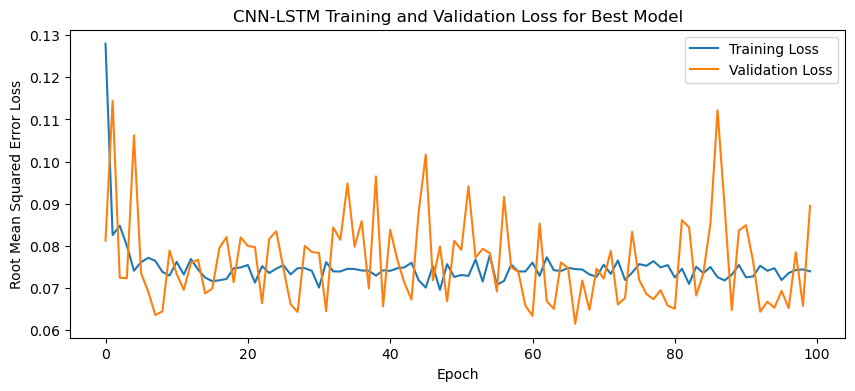

1/1 - 1s - loss: 0.0727 - 1s/epoch - 1s/step
Test Loss: 0.07273954898118973
1/1 [==============================] - 0s 35ms/step


NameError: name 'series' is not defined

In [3]:
n_batch = 1
nb_epoch = 100

def rmse (y_true, y_pred):
    return K.sqrt(K.mean(K.square(y_pred - y_true)))

def mape (y_true, y_pred):
    return 100*K.mean(K.sqrt(K.square(y_true - y_pred))/y_true)
    
def pearson (y_true, y_pred):
    return (K.square(K.mean((y_true - K.mean(y_true))*(y_pred - K.mean(y_pred)))))/(K.mean(K.square(y_true - K.mean(y_true)))*K.mean(K.square(y_pred - K.mean(y_pred))))
 
# fit an LSTM network to training data
#Adapted from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def create_model(trial, X, y, n_lag, n_seq, n_batch, nb_epoch):
    
    #Parameters:
    #trial (array-like): Optuna parameters.
    #train (array-like): Target values.
    #n_lag (int): Number of lag observations.
    #n_seq (int): Number of sequence observations
    #nb_epoch (int): Maximum number of epochs
    
    # Hyperparameters to be tuned by Optuna (taken from Javier Leon's dissertation 'Fruit Prices')
    lr = trial.suggest_float('lr', 1e-3, 1, log=True)
    optimizer_name = trial.suggest_categorical('optimizer', ['Adam', 'RMSprop', 'SGD'])
    if optimizer_name == 'Adam':
        optimizer = Adam(learning_rate=lr)
    elif optimizer_name == 'RMSprop':
        optimizer = RMSprop(learning_rate=lr)
    else:
        optimizer = SGD(learning_rate=lr)
    
    #Optuna will try either Rectified Linear Unit (ReLU) = max(0, x), tanh, or sigmoid functions
    activation_function = trial.suggest_categorical('activation_function', ['relu', 'tanh', 'sigmoid'])
    
    filters = trial.suggest_categorical('filters', [256, 512, 1024]) # Used for CNN-LSTM model
    lstm_units = trial.suggest_categorical('lstm_units', [256, 512, 1024])
    dropout_rate = trial.suggest_float('dropout_rate', 0.1, 0.5)

    # design network
    model = Sequential()
    model.add(Conv1D(filters=filters, kernel_size=1, activation='relu', input_shape=(X.shape[1], X.shape[2]))) # CNN-LSTM only
    model.add(MaxPooling1D(pool_size=1)) # CNN-LSTM Only
    model.add(Dropout(dropout_rate))
    model.add(LSTM(lstm_units, return_sequences=True))
    model.add(Dropout(dropout_rate))
    model.add(LSTM(lstm_units))
    model.add(Dropout(dropout_rate))
    model.add(Dense(256, input_dim=y.shape[1], activation=activation_function))
    model.add(Dense(128, activation=activation_function))
    model.add(Dense(n_seq))
    model.compile(loss=rmse, optimizer=optimizer)
        
    return model

# make forecast with the CNN-LSTM best model
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def forecast_lstm(model, X, n_seq, n_test):
    # reshape input pattern to [samples, timesteps, features]
    X = X.reshape(1, 1, X.shape[1])
    # make forecast
    forecast = model.predict(X)
    # convert to array
    return forecast
     
# evaluate the persistence model
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def make_forecasts(model, X_test, y_test, n_lag, n_seq, n_test):
    forecasts = list()
    for i in range(len(X_test)):
        X, y = X_test[i, :], y_test[i, :]
        # make forecast
        forecast = forecast_lstm(model, X, n_seq, n_test)
        # store the forecast
        forecasts.append(forecast)
    return forecasts
     
# invert differenced forecast
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def inverse_difference(last_ob, forecast):
    # invert first forecast
    inverted = list()
    inverted.append(forecast[0] + last_ob)
    # propagate difference forecast using inverted first value
    for i in range(1, len(forecast)):
        inverted.append(forecast[i] + inverted[i-1])
    return inverted
     
# inverse data transform on forecasts
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def inverse_transform(series, forecasts, scaler, n_test, n_seq):
    inverted = list()
    for i in range(len(forecasts)):
        # create array from forecast
        forecast = forecasts[i]
        forecast = forecast.reshape(1, n_seq)
        # invert scaling
        inv_scale = scaler.inverse_transform(forecast)
        inv_scale = inv_scale[0, :]
        # invert differencing
        index = len(series) - n_test + i - 1
        last_ob = series.values[index]
        inv_diff = inverse_difference(last_ob, inv_scale)
        # store
        inverted.append(inv_diff)
    return inverted
     
# evaluate the RMSE for each forecast time step
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def evaluate_forecasts(test, forecasts, n_lag, n_seq):
    rmse_list = []
    mae_list = []
    mape_list = []
    r2_list = []
    for i in range(n_seq):
        actual = [row[i] for row in test]
        predicted = [forecast[i] for forecast in forecasts]
        rmse = sqrt(mean_squared_error(actual, predicted))
        mae = mean_absolute_error(actual, predicted)
        mse = mean_squared_error(actual, predicted)
        mape = mean_absolute_percentage_error(actual, predicted)
        r2 = r2_score(actual, predicted) 
        rmse_list.append(rmse)
        mae_list.append(mae)
        mape_list.append(mape)
        r2_list.append(r2)
        print("Month at t+"+str(i+1)+":")
        print('t+%d RMSE: %f' % ((i+1), rmse))
        print('t+%d MAE: %f' % ((i+1), mae))
        print('t+%d MAPE: %f' % ((i+1), mape))
        print('t+%d R2_SCORE: %f' % ((i+1), r2))

    return rmse_list, mae_list, mape_list, r2_list
     
# plot the forecasts in the context of the original dataset
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def plot_forecasts(series, forecasts, n_test):
    # plot the entire dataset in blue
    plt.plot(series.values)
    # plot the forecasts in red
    for i in range(len(forecasts)):
        off_s = len(series) - n_test + i - 1
        off_e = off_s + len(forecasts[i]) + 1
        xaxis = [x for x in range(off_s, off_e)]
        yaxis = [series.values[off_s]] + forecasts[i]
        plt.plot(xaxis, yaxis, color='red')
    # show the plot
    plt.show()
    
def objective(trial):
    
    cv_accuracies = []
        
    for i in range(5):
        train1 = train[i]
        test1 = test[i]
        validation1 = validation[i]

        X, y = train1[:, 0:-n_seq], train1[:, -n_seq:]
        X_test, y_test = test1[:, 0:-n_seq], test1[:, -n_seq:]
        X_val, y_val = validation1[:, 0:-n_seq], validation1[:, -n_seq:]
        X = X.reshape(X.shape[0], 1, X.shape[1])
        X_test = X_test.reshape(X_test.shape[0], 1, X_test.shape[1])
        X_val = X_val.reshape(X_val.shape[0], 1, X_val.shape[1])
    
        model = create_model(trial, X, y, n_lag, n_seq, n_batch, nb_epoch)

        history = model.fit(X, y, validation_data=(X_val, y_val), epochs=nb_epoch, verbose=0)

        cv_accuracy = model.evaluate(X_test, y_test, verbose=0)
    
        loss = history.history['val_loss'][-1]
    
        # Plotting the training and validation loss
        #plt.figure(figsize=(10, 4))
        #plt.plot(history.history['loss'], label='Training Loss')
        #plt.plot(history.history['val_loss'], label='Validation Loss')
        #title1 = "CNN-LSTM Training and Validation Loss for Fold " + str(i+1)
        #plt.title(title1)
        #plt.xlabel('Epoch')
        #plt.ylabel('Root Mean Squared Error Loss')
        #plt.legend()
        #plt.show()
            
        cv_accuracies.append(cv_accuracy)
    
    print("Cross Validation Accuracies:")
    print(cv_accuracies)
    print("Mean Cross Validation Accuracy:")
    print(np.mean(cv_accuracies))
    print("Standard Deviation of Cross Validation Accuracy:")
    print(np.std(cv_accuracies))
        
    return np.mean(cv_accuracies)

n_batch = 1
nb_epoch = 100

# optimize and fit model
study = optuna.create_study(direction='minimize')
study.optimize(objective, n_trials=100)
print('Number of finished trials:', len(study.trials))

print('Best trial:', study.best_trial.params)
best_params = study.best_params
print("Best hyperparameters: ", best_params)

for i in range(5):
    print("Fold "+str(i+1)+":")
    train1 = train[i]
    test1 = test[i]
    validation1 = validation[i]

    X, y = train1[:, 0:-n_seq], train1[:, -n_seq:]
    X_test, y_test = test1[:, 0:-n_seq], test1[:, -n_seq:]
    X_val, y_val = validation1[:, 0:-n_seq], validation1[:, -n_seq:]
    X = X.reshape(X.shape[0], 1, X.shape[1])
    X_test = X_test.reshape(X_test.shape[0], 1, X_test.shape[1])
    X_val = X_val.reshape(X_val.shape[0], 1, X_val.shape[1])

    best_model = create_model(optuna.trial.FixedTrial(best_params), X, y, n_lag, n_seq, n_batch, nb_epoch)
    history = best_model.fit(X, y, epochs=100, batch_size=n_batch, validation_data=(X_val, y_val))

    # Plotting the training and validation loss
    plt.figure(figsize=(10, 4))
    plt.plot(history.history['loss'], label='Training Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    title1 = "CNN-LSTM Training and Validation Loss for Best Model"
    plt.title(title1)
    plt.xlabel('Epoch')
    plt.ylabel('Root Mean Squared Error Loss')
    plt.legend()
    plt.show()

    # Evaluate the model
    loss = best_model.evaluate(X_test, y_test, verbose=2)
    print(f'Test Loss: {loss}')

    # make forecasts
    forecasts = make_forecasts(best_model, X_test, y_test, n_lag, n_seq, n_test)
    
    # inverse transform forecasts and test
    forecasts = inverse_transform(series, forecasts, scaler[i], n_test+2, n_seq)
    actual = [row[-n_seq:] for row in test1]
    actual = inverse_transform(series, actual, scaler[i], n_test+2, n_seq)

    rmse_list = [] # list stores root mean squared errors for each future time prediction
    mae_list = [] # list stores root mean squared errors for each future time prediction
    mape_list = [] # list stores root mean squared errors for each future time prediction
    r2_list = [] # list stores root mean squared errors for each future time prediction
    
    # evaluate forecasts
    rmse_list, mae_list, mape_list, r2_list = evaluate_forecasts(actual, forecasts, n_lag, n_seq)

    for j in range(len(X_test)):
        print("Weather Station "+str(j+1)+":")
        dataset_df = pd.DataFrame(y_test[j].flatten())
        dataset = dataset_df.values
        dataset = dataset[:, 0]
        dataset = np.array(dataset).reshape(-1, 1)
        dataset = dataset.flatten()
        dataset = pd.DataFrame(dataset)
        series = scaler[i].inverse_transform(dataset)
        series = pd.Series(series.flatten())

    # plot forecasts
    plot_forecasts(series, forecasts, 1)
    
    best_model.summary()

    # Print out table of actual and predicted values for each weather station
    for j in range(11):
        print("Weather Station "+str(j+1)+":")
        print("Actual Temp\tPredicted Temp\tDifference")
        print("-----------\t--------------\t----------")
        for k in range(n_seq):
            diff = forecasts[j][k] - actual[j][k]
            print(f"{actual[j][k]:.2f}\t\t{forecasts[j][k]:.2f}\t\t{diff:.2f}")

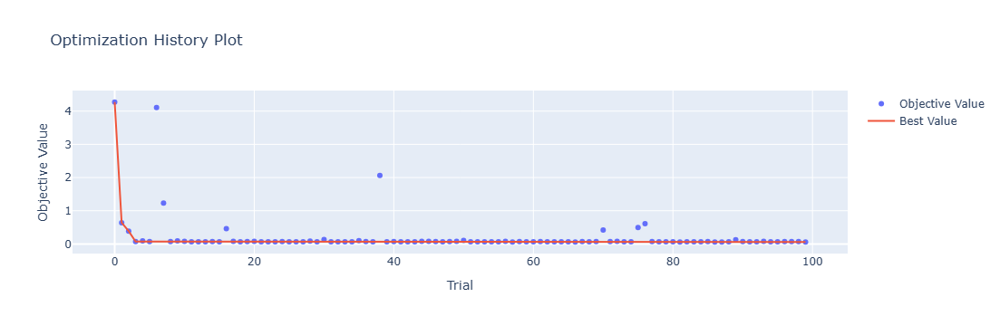

In [4]:
optuna.visualization.plot_optimization_history(study)

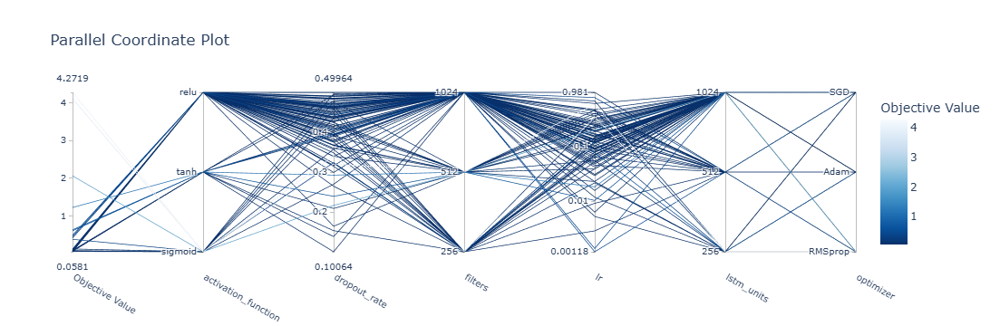

In [5]:
optuna.visualization.plot_parallel_coordinate(study)

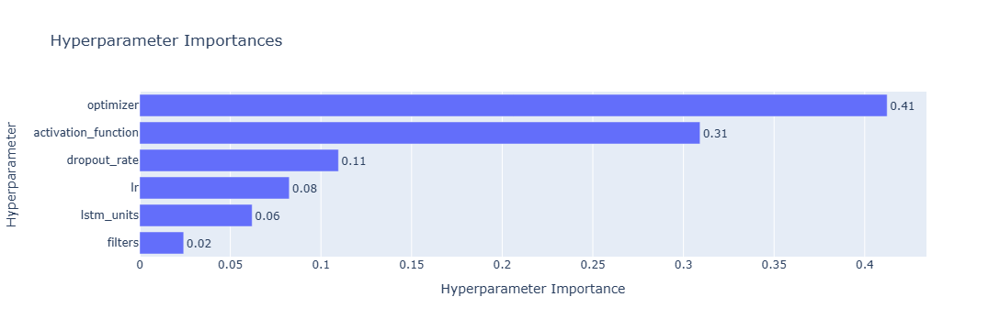

In [6]:
optuna.visualization.plot_param_importances(study)

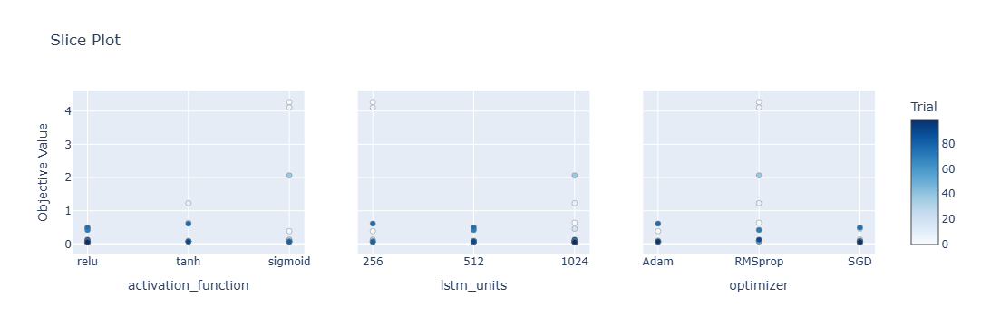

In [7]:
optuna.visualization.plot_slice(study, params=['optimizer', 'activation_function', 'lstm_units'])

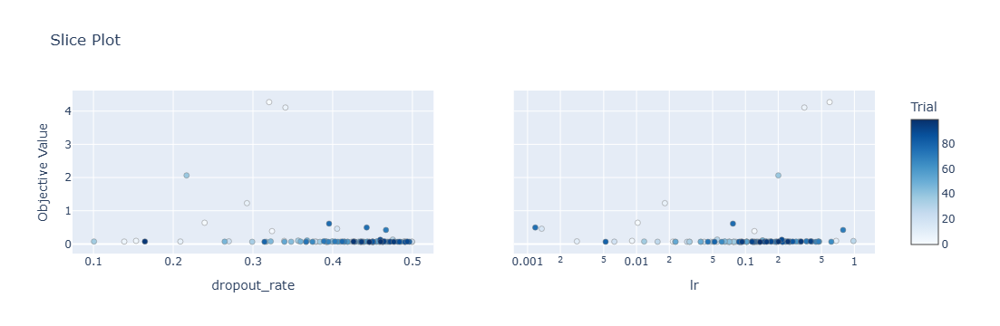

In [8]:
optuna.visualization.plot_slice(study, params=['lr', 'dropout_rate'])

Epoch 1/100
84/84 [==============================] - 31s 207ms/step - loss: 0.1321 - accuracy: 0.5476 - mae: 0.1146 - rmse: 0.1321 - mape: 19.5998 - pearson: 0.6334 - val_loss: 0.0874 - val_accuracy: 0.6000 - val_mae: 0.0704 - val_rmse: 0.0874 - val_mape: 13.5977 - val_pearson: 0.6962
Epoch 2/100
84/84 [==============================] - 14s 161ms/step - loss: 0.0910 - accuracy: 0.6190 - mae: 0.0725 - rmse: 0.0910 - mape: 12.8911 - pearson: 0.7054 - val_loss: 0.0658 - val_accuracy: 0.6000 - val_mae: 0.0526 - val_rmse: 0.0658 - val_mape: 9.5848 - val_pearson: 0.8245
Epoch 3/100
84/84 [==============================] - 16s 187ms/step - loss: 0.0818 - accuracy: 0.6905 - mae: 0.0661 - rmse: 0.0818 - mape: 11.4958 - pearson: 0.7599 - val_loss: 0.0797 - val_accuracy: 0.6000 - val_mae: 0.0649 - val_rmse: 0.0797 - val_mape: 11.7457 - val_pearson: 0.7093
Epoch 4/100
84/84 [==============================] - 19s 230ms/step - loss: 0.0792 - accuracy: 0.7024 - mae: 0.0637 - rmse: 0.0792 - mape: 11.2

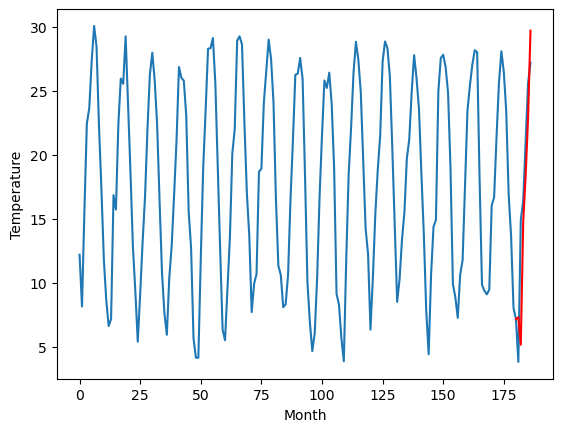

Weather Station 2:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
8.53		6.35		-2.18
8.44		4.20		-4.24
13.50		13.78		0.28
14.90		17.41		2.51
18.92		21.88		2.96
22.40		28.73		6.33
[180, 181, 182, 183, 184, 185, 186]
[13.23, 6.3467030477523805, 4.200268979072571, 13.783704037666322, 17.413606877326966, 21.880882019996644, 28.733600850105287]


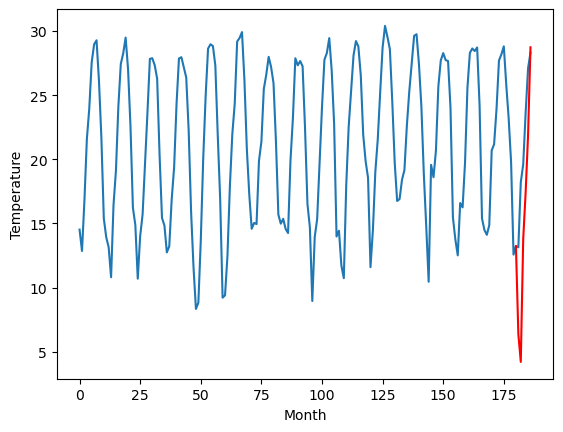

Weather Station 3:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
7.31		4.97		-2.34
8.17		2.82		-5.35
14.15		12.40		-1.75
15.79		16.03		0.24
19.77		20.50		0.73
23.91		27.35		3.44
[180, 181, 182, 183, 184, 185, 186]
[7.18, 4.966703047752381, 2.820268979072571, 12.403704037666321, 16.033606877326967, 20.500882019996645, 27.353600850105288]


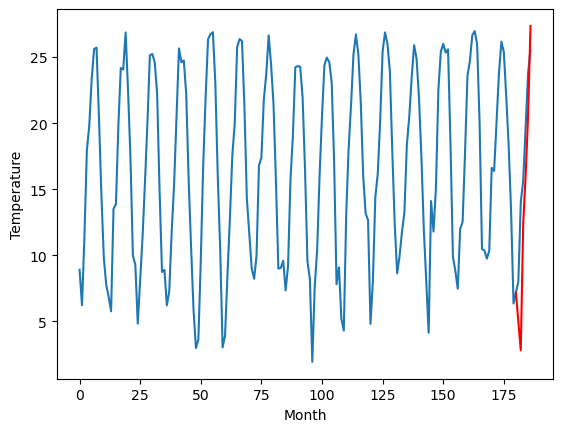

Weather Station 4:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
5.38		3.77		-1.61
3.81		1.62		-2.19
11.72		11.20		-0.52
13.51		14.83		1.32
17.48		19.30		1.82
20.76		26.15		5.39
[180, 181, 182, 183, 184, 185, 186]
[11.46, 3.7667030477523804, 1.6202689790725708, 11.20370403766632, 14.833606877326964, 19.300882019996642, 26.153600850105285]


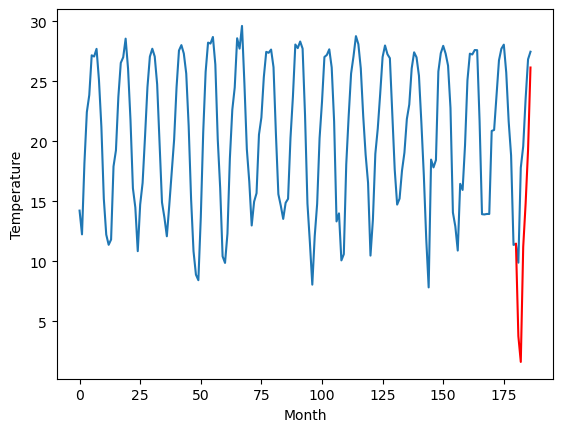

Weather Station 5:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
11.33		10.69		-0.64
8.24		8.54		0.30
18.14		18.12		-0.02
20.07		21.75		1.68
23.93		26.22		2.29
29.13		33.07		3.94
[180, 181, 182, 183, 184, 185, 186]
[9.27, 10.686703047752381, 8.540268979072572, 18.12370403766632, 21.753606877326966, 26.220882019996644, 33.07360085010529]


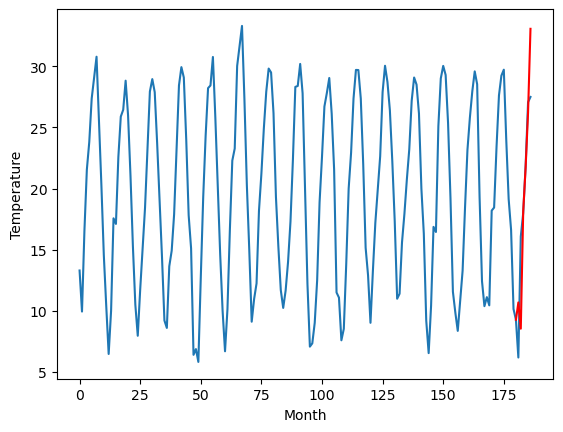

Weather Station 6:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
12.74		13.00		0.26
13.39		10.85		-2.54
18.29		20.43		2.14
21.66		24.06		2.40
25.17		28.53		3.36
29.74		35.38		5.64
[180, 181, 182, 183, 184, 185, 186]
[7.77, 12.99670304775238, 10.85026897907257, 20.43370403766632, 24.063606877326965, 28.530882019996643, 35.38360085010528]


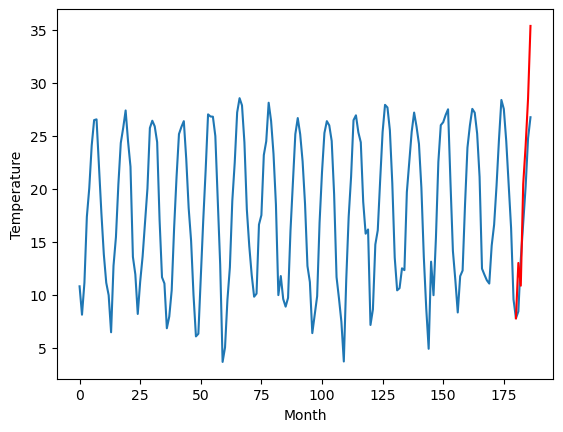

Weather Station 7:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
8.33		7.39		-0.94
8.97		5.24		-3.73
15.95		14.82		-1.13
16.98		18.45		1.47
20.69		22.92		2.23
25.02		29.77		4.75
[180, 181, 182, 183, 184, 185, 186]
[6.59, 7.3867030477523805, 5.240268979072571, 14.823704037666321, 18.453606877326965, 22.920882019996643, 29.773600850105286]


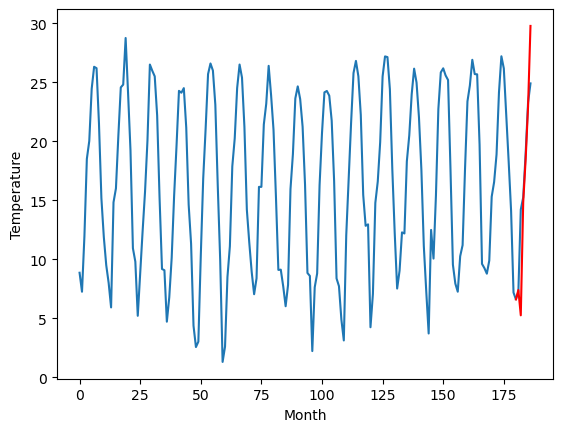

Weather Station 8:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
13.29		12.71		-0.58
13.91		10.56		-3.35
20.43		20.14		-0.29
24.06		23.77		-0.29
27.08		28.24		1.16
31.87		35.09		3.22
[180, 181, 182, 183, 184, 185, 186]
[5.3, 12.70670304775238, 10.560268979072571, 20.14370403766632, 23.773606877326966, 28.240882019996643, 35.09360085010529]


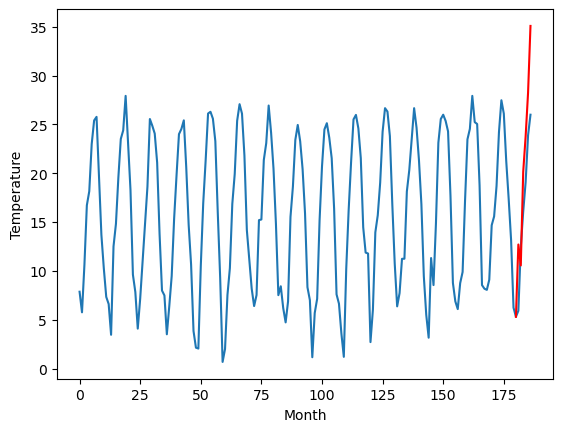

Weather Station 9:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
12.51		11.78		-0.73
8.24		9.63		1.39
20.71		19.21		-1.50
23.31		22.84		-0.47
28.00		27.31		-0.69
34.19		34.16		-0.03
[180, 181, 182, 183, 184, 185, 186]
[3.1, 11.776703047752381, 9.630268979072572, 19.21370403766632, 22.843606877326966, 27.310882019996644, 34.16360085010528]


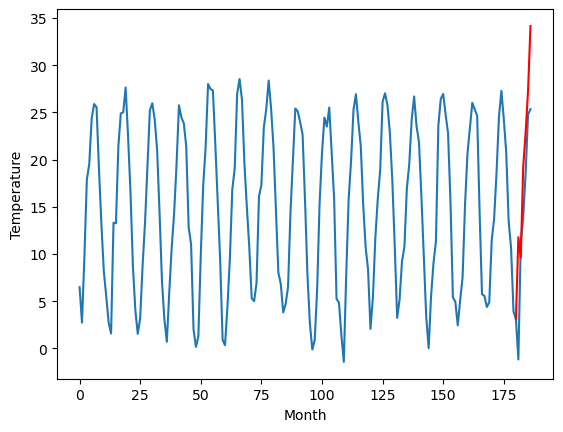

Weather Station 10:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
9.20		9.27		0.07
7.03		7.12		0.09
17.78		16.70		-1.08
20.84		20.33		-0.51
25.31		24.80		-0.51
31.79		31.65		-0.14
[180, 181, 182, 183, 184, 185, 186]
[0.6, 9.26670304775238, 7.12026897907257, 16.70370403766632, 20.333606877326964, 24.800882019996642, 31.653600850105285]


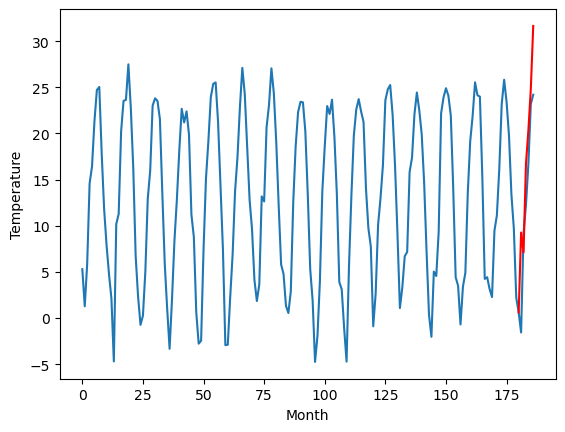

Weather Station 11:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
7.24		7.33		0.09
2.93		5.18		2.25
14.66		14.76		0.10
18.63		18.39		-0.24
23.78		22.86		-0.92
31.09		29.71		-1.38
[180, 181, 182, 183, 184, 185, 186]
[-0.75, 7.32670304775238, 5.1802689790725704, 14.76370403766632, 18.393606877326967, 22.860882019996644, 29.713600850105287]


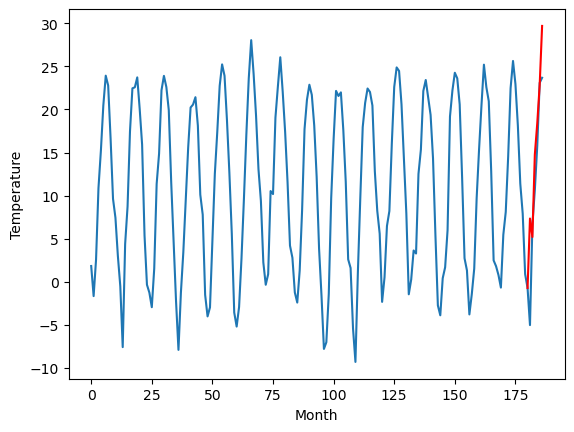

RangeIndex(start=1, stop=12, step=1)
[7.989999999999999, 8.53, 7.310000000000001, 5.3800000000000034, 11.33, 12.739999999999998, 8.33, 13.29, 12.51, 9.2, 7.24]
[7.32670304775238, 6.3467030477523805, 4.966703047752381, 3.7667030477523804, 10.686703047752381, 12.99670304775238, 7.3867030477523805, 12.70670304775238, 11.776703047752381, 9.26670304775238, 7.32670304775238]
Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    7.99   7.326703
1                 1    8.53   6.346703
2                 2    7.31   4.966703
3                 3    5.38   3.766703
4                 4   11.33  10.686703
5                 5   12.74  12.996703
6                 6    8.33   7.386703
7                 7   13.29  12.706703
8                 8   12.51  11.776703
9                 9    9.20   9.266703
10               10    7.24   7.326703


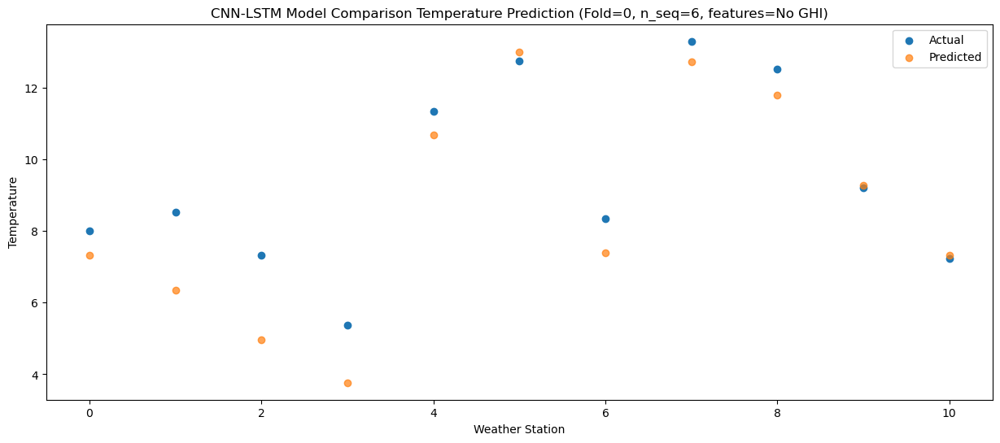

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    4.64   5.180269
1                 1    8.44   4.200269
2                 2    8.17   2.820269
3                 3    3.81   1.620269
4                 4    8.24   8.540269
5                 5   13.39  10.850269
6                 6    8.97   5.240269
7                 7   13.91  10.560269
8                 8    8.24   9.630269
9                 9    7.03   7.120269
10               10    2.93   5.180269


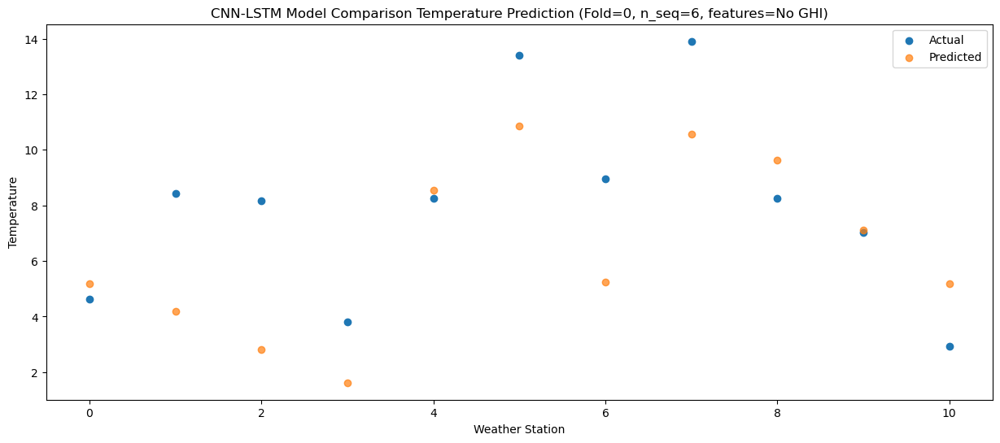

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0   15.71  14.763704
1                 1   13.50  13.783704
2                 2   14.15  12.403704
3                 3   11.72  11.203704
4                 4   18.14  18.123704
5                 5   18.29  20.433704
6                 6   15.95  14.823704
7                 7   20.43  20.143704
8                 8   20.71  19.213704
9                 9   17.78  16.703704
10               10   14.66  14.763704


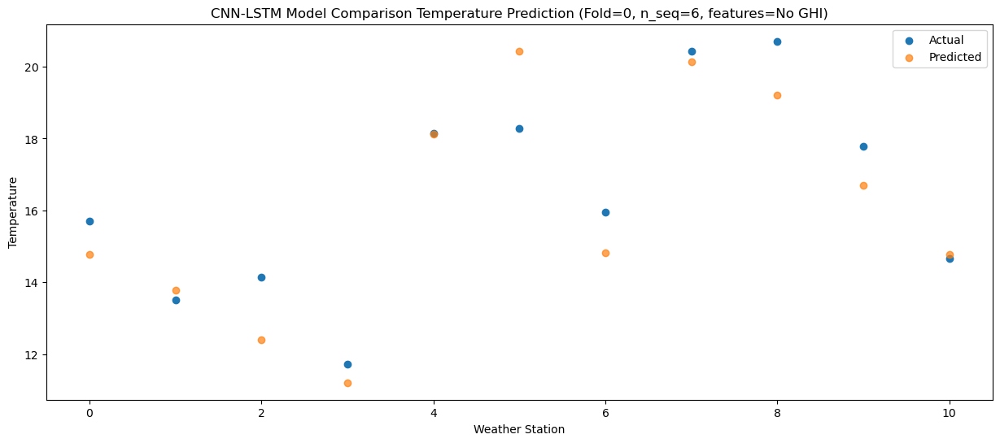

Predictions for (t+3):
    Weather_Station  Actual  Predicted
0                 0   17.24  18.393607
1                 1   14.90  17.413607
2                 2   15.79  16.033607
3                 3   13.51  14.833607
4                 4   20.07  21.753607
5                 5   21.66  24.063607
6                 6   16.98  18.453607
7                 7   24.06  23.773607
8                 8   23.31  22.843607
9                 9   20.84  20.333607
10               10   18.63  18.393607


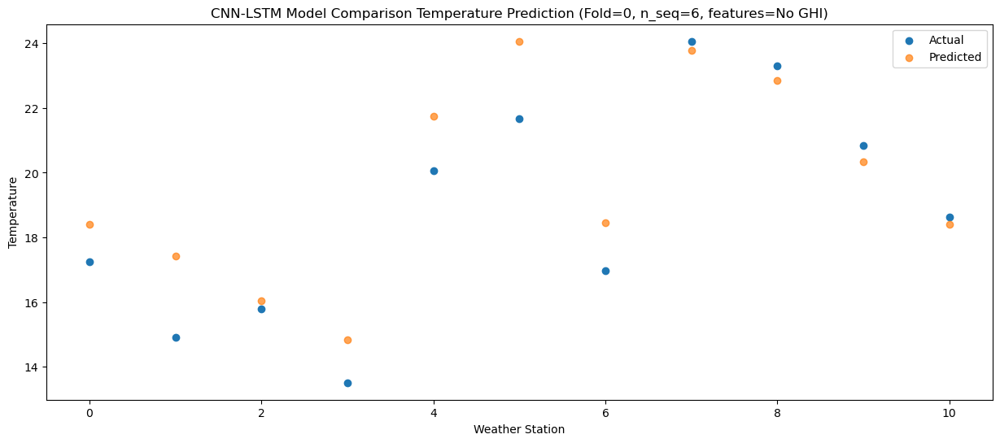

Predictions for (t+4):
    Weather_Station  Actual  Predicted
0                 0   21.74  22.860882
1                 1   18.92  21.880882
2                 2   19.77  20.500882
3                 3   17.48  19.300882
4                 4   23.93  26.220882
5                 5   25.17  28.530882
6                 6   20.69  22.920882
7                 7   27.08  28.240882
8                 8   28.00  27.310882
9                 9   25.31  24.800882
10               10   23.78  22.860882


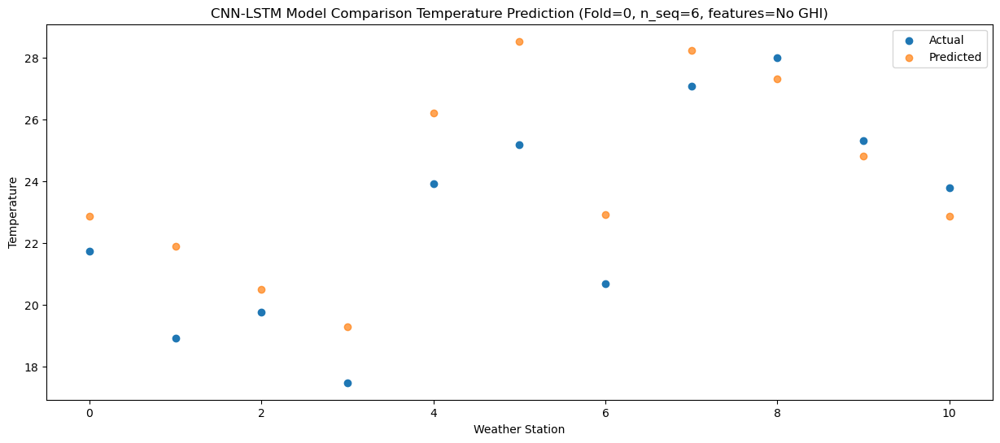

Predictions for (t+5):
    Weather_Station  Actual  Predicted
0                 0   26.41  29.713601
1                 1   22.40  28.733601
2                 2   23.91  27.353601
3                 3   20.76  26.153601
4                 4   29.13  33.073601
5                 5   29.74  35.383601
6                 6   25.02  29.773601
7                 7   31.87  35.093601
8                 8   34.19  34.163601
9                 9   31.79  31.653601
10               10   31.09  29.713601


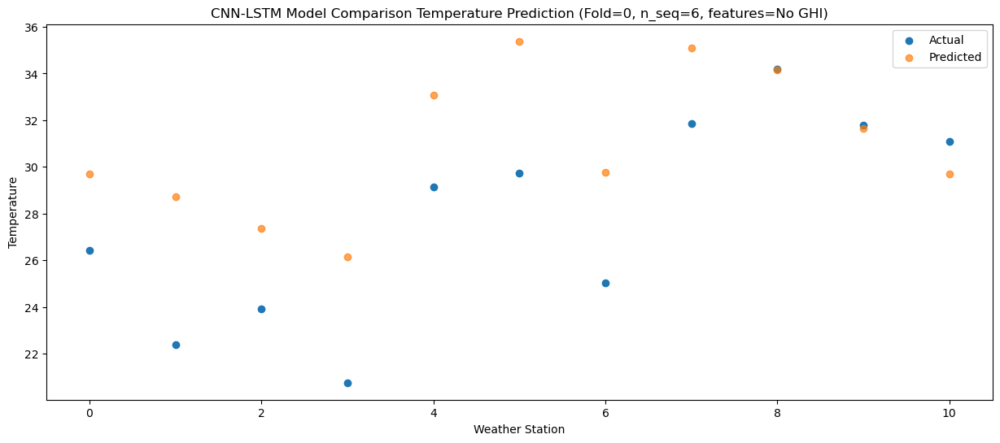

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d (Conv1D)             (None, 1, 1024)           2017280   
                                                                 
 max_pooling1d (MaxPooling1D  (None, 1, 1024)          0         
 )                                                               
                                                                 
 dropout (Dropout)           (None, 1, 1024)           0         
                                                                 
 lstm (LSTM)                 (None, 1, 1024)           8392704   
                                                                 
 dropout_1 (Dropout)         (None, 1, 1024)           0         
                                                                 
 lstm_1 (LSTM)               (None, 1024)              8392704   
                                                        

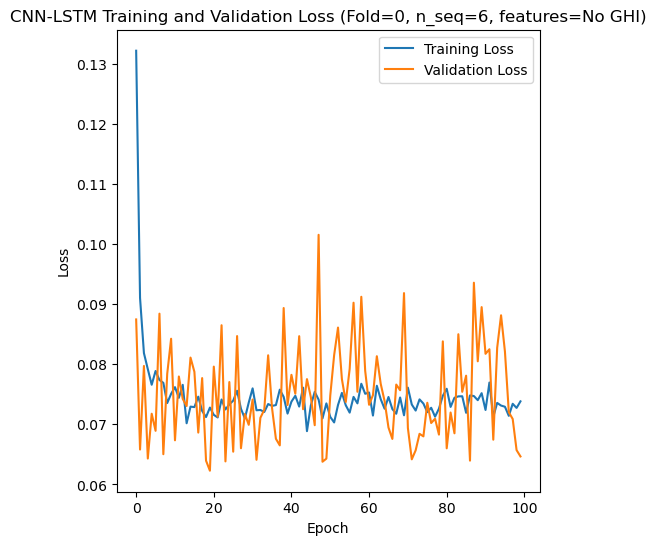

Epoch 1/100
84/84 [==============================] - 30s 200ms/step - loss: 0.1291 - accuracy: 0.5595 - mae: 0.1083 - rmse: 0.1291 - mape: 18.6358 - pearson: 0.6095 - val_loss: 0.0851 - val_accuracy: 0.8000 - val_mae: 0.0653 - val_rmse: 0.0851 - val_mape: 11.8286 - val_pearson: 0.8021
Epoch 2/100
84/84 [==============================] - 13s 151ms/step - loss: 0.0885 - accuracy: 0.7024 - mae: 0.0715 - rmse: 0.0885 - mape: 12.5660 - pearson: 0.7438 - val_loss: 0.0888 - val_accuracy: 0.8000 - val_mae: 0.0812 - val_rmse: 0.0888 - val_mape: 13.8987 - val_pearson: 0.8079
Epoch 3/100
84/84 [==============================] - 13s 152ms/step - loss: 0.0812 - accuracy: 0.6786 - mae: 0.0646 - rmse: 0.0812 - mape: 11.2364 - pearson: 0.7513 - val_loss: 0.0725 - val_accuracy: 0.8000 - val_mae: 0.0598 - val_rmse: 0.0725 - val_mape: 10.3748 - val_pearson: 0.8327
Epoch 4/100
84/84 [==============================] - 13s 155ms/step - loss: 0.0792 - accuracy: 0.6786 - mae: 0.0632 - rmse: 0.0792 - mape: 10.

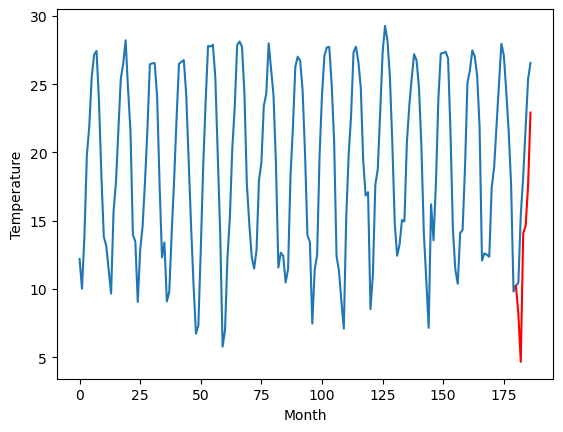

Weather Station 2:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
7.49		6.75		-0.74
8.15		3.24		-4.91
14.92		12.67		-2.25
17.06		13.20		-3.86
20.79		16.08		-4.71
24.93		21.49		-3.44
[180, 181, 182, 183, 184, 185, 186]
[6.41, 6.750277819633484, 3.2413600111007694, 12.670493426322938, 13.197478654384614, 16.084219100475313, 21.48845589399338]


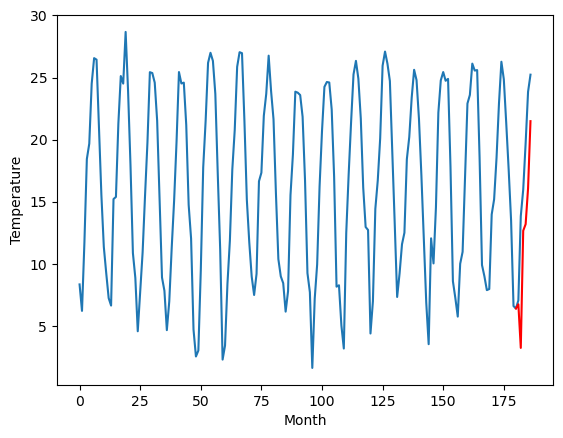

Weather Station 3:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
9.35		7.99		-1.36
9.84		4.48		-5.36
16.90		13.91		-2.99
18.30		14.44		-3.86
22.42		17.32		-5.10
26.30		22.73		-3.57
[180, 181, 182, 183, 184, 185, 186]
[7.6, 7.990277819633484, 4.481360011100769, 13.910493426322937, 14.437478654384613, 17.32421910047531, 22.728455893993377]


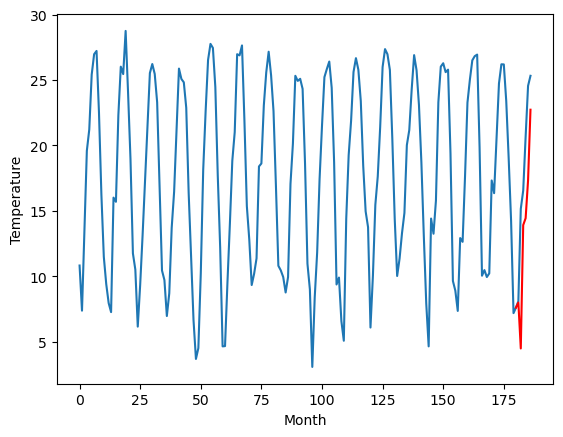

Weather Station 4:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
7.86		7.02		-0.84
6.27		3.51		-2.76
13.64		12.94		-0.70
15.98		13.47		-2.51
19.87		16.35		-3.52
23.76		21.76		-2.00
[180, 181, 182, 183, 184, 185, 186]
[11.89, 7.020277819633484, 3.511360011100769, 12.940493426322938, 13.467478654384614, 16.354219100475312, 21.75845589399338]


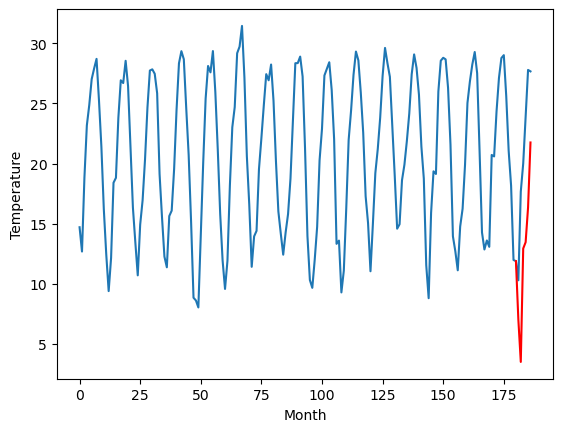

Weather Station 5:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
12.19		11.26		-0.93
10.49		7.75		-2.74
18.10		17.18		-0.92
20.40		17.71		-2.69
24.52		20.59		-3.93
27.99		26.00		-1.99
[180, 181, 182, 183, 184, 185, 186]
[10.96, 11.260277819633483, 7.751360011100768, 17.180493426322936, 17.707478654384612, 20.59421910047531, 25.998455893993377]


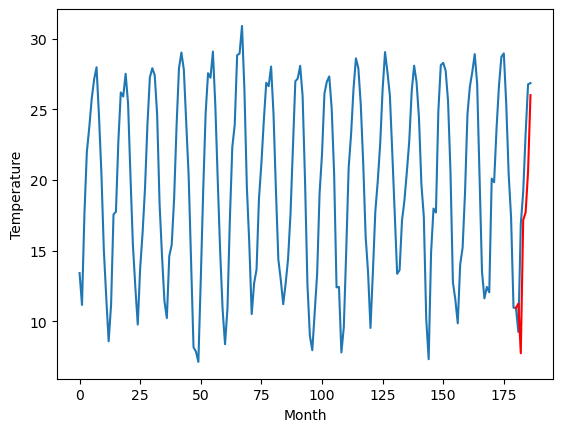

Weather Station 6:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
6.84		7.41		0.57
7.22		3.90		-3.32
14.56		13.33		-1.23
16.83		13.86		-2.97
22.42		16.74		-5.68
26.69		22.15		-4.54
[180, 181, 182, 183, 184, 185, 186]
[7.75, 7.4102778196334835, 3.9013600111007687, 13.330493426322937, 13.857478654384613, 16.744219100475313, 22.14845589399338]


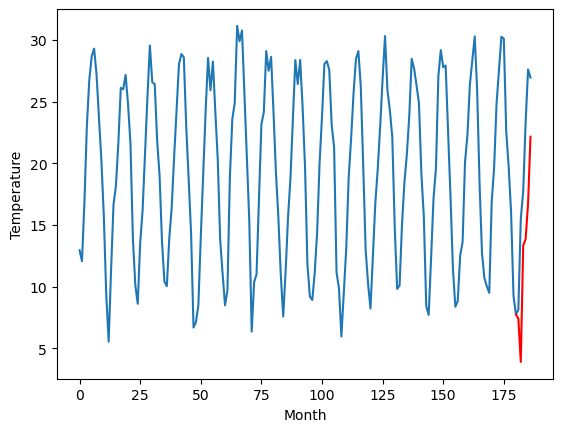

Weather Station 7:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
10.62		9.88		-0.74
11.40		6.37		-5.03
17.68		15.80		-1.88
20.25		16.33		-3.92
24.02		19.21		-4.81
28.03		24.62		-3.41
[180, 181, 182, 183, 184, 185, 186]
[6.17, 9.880277819633484, 6.371360011100769, 15.800493426322937, 16.327478654384613, 19.21421910047531, 24.618455893993378]


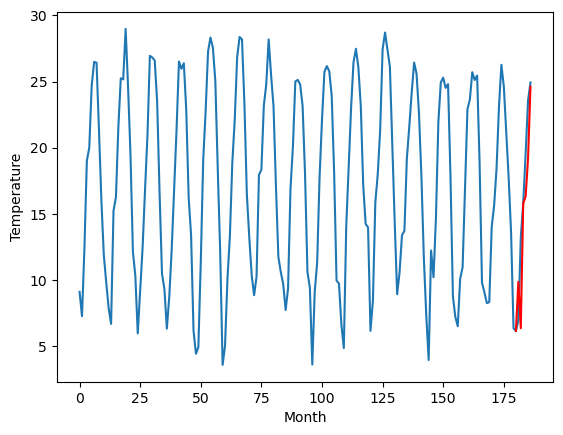

Weather Station 8:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
14.40		13.77		-0.63
11.40		10.26		-1.14
22.72		19.69		-3.03
24.43		20.22		-4.21
29.09		23.10		-5.99
35.17		28.51		-6.66
[180, 181, 182, 183, 184, 185, 186]
[4.57, 13.770277819633485, 10.26136001110077, 19.690493426322938, 20.217478654384614, 23.104219100475312, 28.50845589399338]


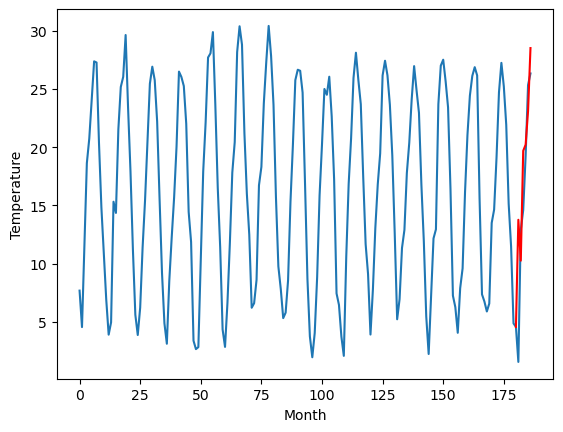

Weather Station 9:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
13.07		12.48		-0.59
8.29		8.97		0.68
20.85		18.40		-2.45
22.65		18.93		-3.72
27.46		21.81		-5.65
33.49		27.22		-6.27
[180, 181, 182, 183, 184, 185, 186]
[5.46, 12.480277819633484, 8.971360011100769, 18.40049342632294, 18.927478654384615, 21.814219100475313, 27.21845589399338]


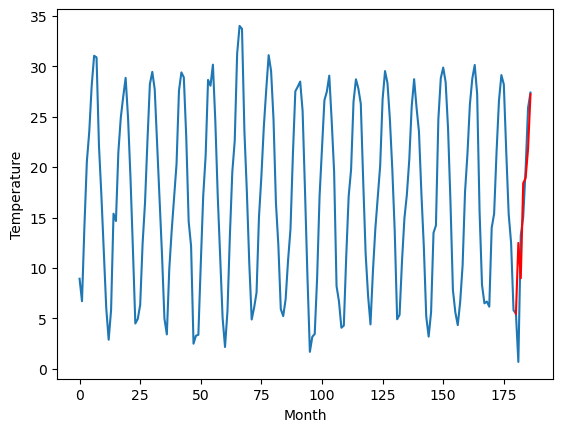

Weather Station 10:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
13.06		12.01		-1.05
8.69		8.50		-0.19
19.40		17.93		-1.47
23.16		18.46		-4.70
27.71		21.34		-6.37
34.82		26.75		-8.07
[180, 181, 182, 183, 184, 185, 186]
[5.42, 12.010277819633483, 8.501360011100768, 17.930493426322936, 18.457478654384612, 21.34421910047531, 26.748455893993377]


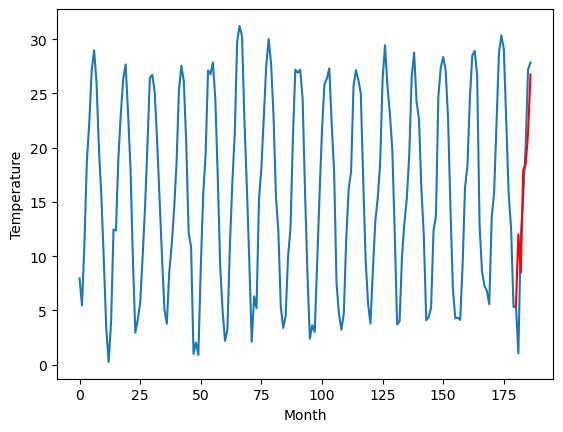

Weather Station 11:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
7.28		8.18		0.90
6.32		4.67		-1.65
13.54		14.10		0.56
18.19		14.63		-3.56
22.73		17.51		-5.22
28.82		22.92		-5.90
[180, 181, 182, 183, 184, 185, 186]
[2.17, 8.180277819633483, 4.671360011100768, 14.100493426322936, 14.627478654384612, 17.51421910047531, 22.918455893993375]


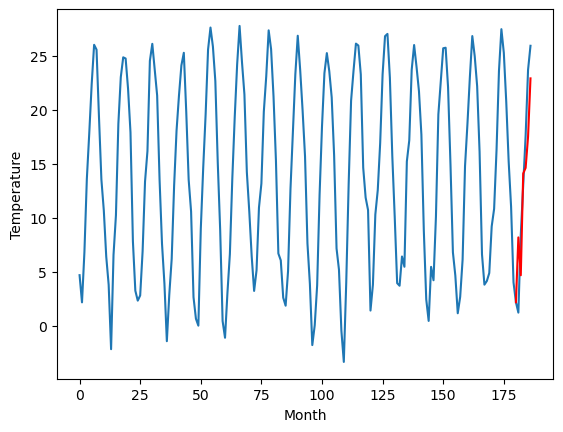

RangeIndex(start=1, stop=12, step=1)
[9.54, 7.489999999999999, 9.35, 7.859999999999999, 12.189999999999998, 6.84, 10.62, 14.4, 13.07, 13.06, 7.279999999999999]
[8.180277819633483, 6.750277819633484, 7.990277819633484, 7.020277819633484, 11.260277819633483, 7.4102778196334835, 9.880277819633484, 13.770277819633485, 12.480277819633484, 12.010277819633483, 8.180277819633483]
Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    9.54   8.180278
1                 1    7.49   6.750278
2                 2    9.35   7.990278
3                 3    7.86   7.020278
4                 4   12.19  11.260278
5                 5    6.84   7.410278
6                 6   10.62   9.880278
7                 7   14.40  13.770278
8                 8   13.07  12.480278
9                 9   13.06  12.010278
10               10    7.28   8.180278


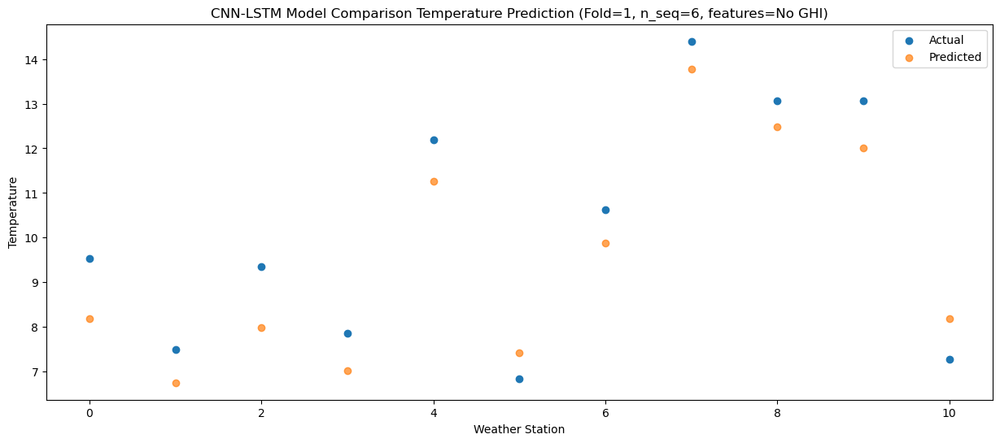

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    9.76    4.67136
1                 1    8.15    3.24136
2                 2    9.84    4.48136
3                 3    6.27    3.51136
4                 4   10.49    7.75136
5                 5    7.22    3.90136
6                 6   11.40    6.37136
7                 7   11.40   10.26136
8                 8    8.29    8.97136
9                 9    8.69    8.50136
10               10    6.32    4.67136


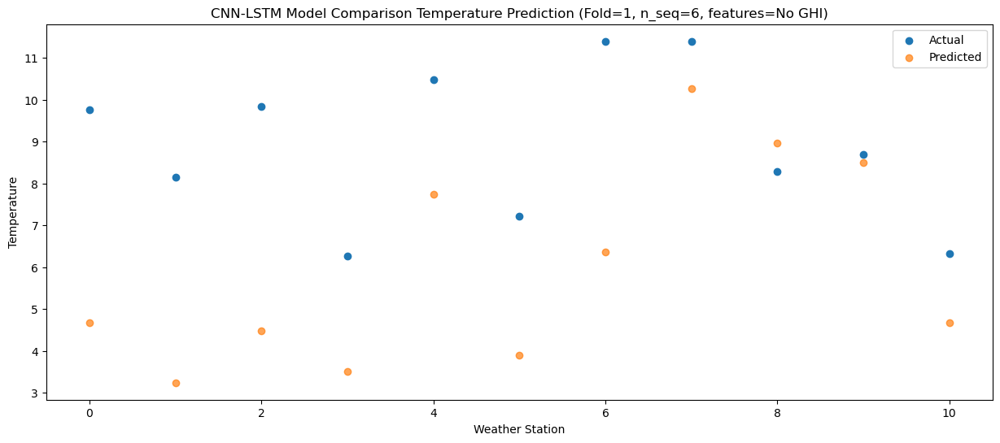

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0   14.74  14.100493
1                 1   14.92  12.670493
2                 2   16.90  13.910493
3                 3   13.64  12.940493
4                 4   18.10  17.180493
5                 5   14.56  13.330493
6                 6   17.68  15.800493
7                 7   22.72  19.690493
8                 8   20.85  18.400493
9                 9   19.40  17.930493
10               10   13.54  14.100493


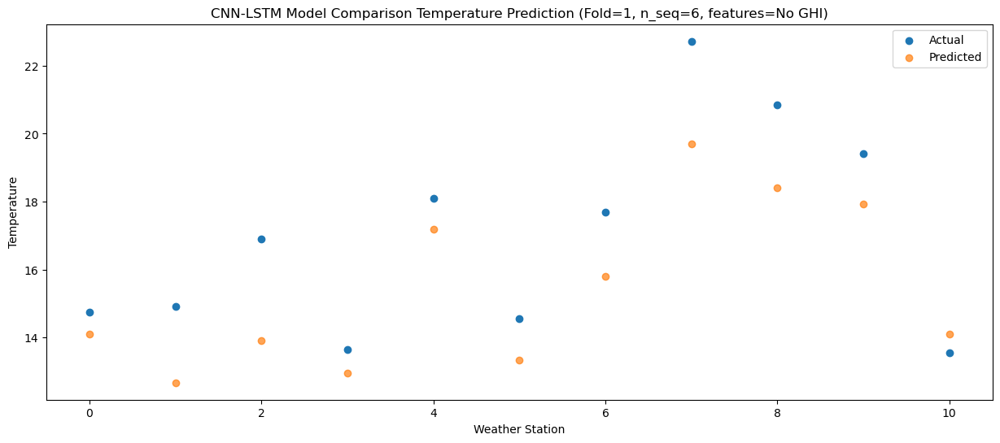

Predictions for (t+3):
    Weather_Station  Actual  Predicted
0                 0   17.55  14.627479
1                 1   17.06  13.197479
2                 2   18.30  14.437479
3                 3   15.98  13.467479
4                 4   20.40  17.707479
5                 5   16.83  13.857479
6                 6   20.25  16.327479
7                 7   24.43  20.217479
8                 8   22.65  18.927479
9                 9   23.16  18.457479
10               10   18.19  14.627479


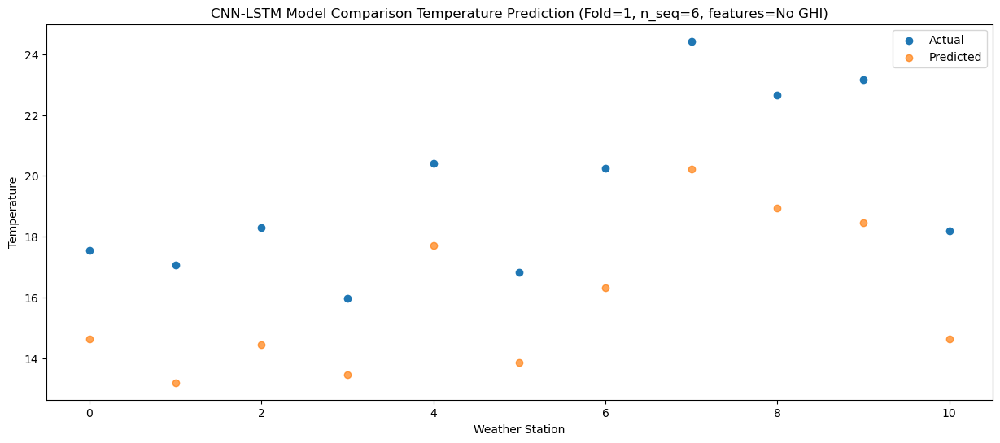

Predictions for (t+4):
    Weather_Station  Actual  Predicted
0                 0   21.16  17.514219
1                 1   20.79  16.084219
2                 2   22.42  17.324219
3                 3   19.87  16.354219
4                 4   24.52  20.594219
5                 5   22.42  16.744219
6                 6   24.02  19.214219
7                 7   29.09  23.104219
8                 8   27.46  21.814219
9                 9   27.71  21.344219
10               10   22.73  17.514219


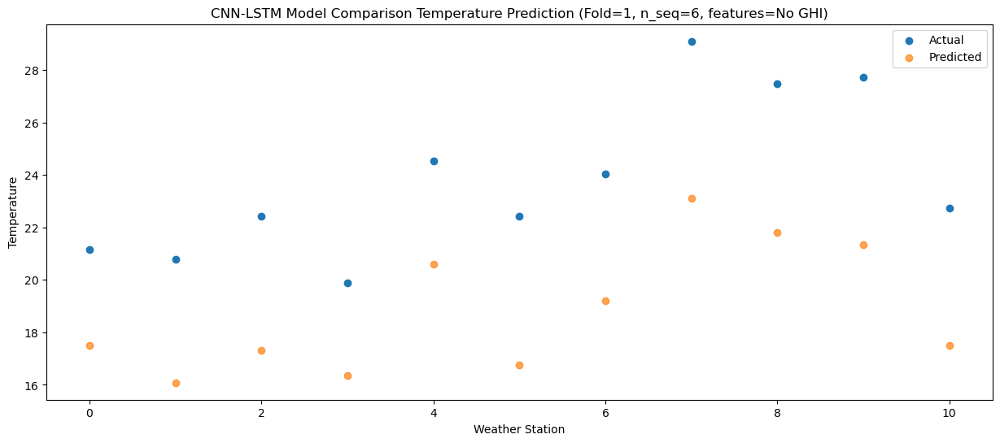

Predictions for (t+5):
    Weather_Station  Actual  Predicted
0                 0   24.65  22.918456
1                 1   24.93  21.488456
2                 2   26.30  22.728456
3                 3   23.76  21.758456
4                 4   27.99  25.998456
5                 5   26.69  22.148456
6                 6   28.03  24.618456
7                 7   35.17  28.508456
8                 8   33.49  27.218456
9                 9   34.82  26.748456
10               10   28.82  22.918456


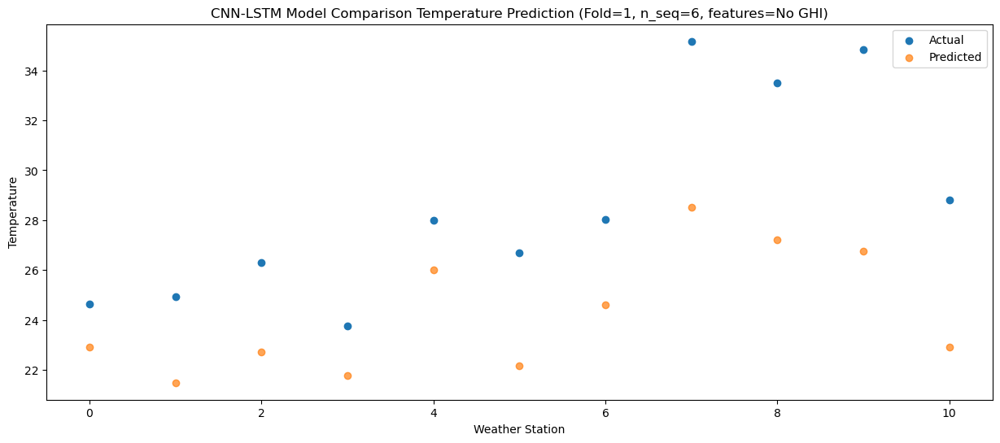

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_1 (Conv1D)           (None, 1, 1024)           2017280   
                                                                 
 max_pooling1d_1 (MaxPooling  (None, 1, 1024)          0         
 1D)                                                             
                                                                 
 dropout_3 (Dropout)         (None, 1, 1024)           0         
                                                                 
 lstm_2 (LSTM)               (None, 1, 1024)           8392704   
                                                                 
 dropout_4 (Dropout)         (None, 1, 1024)           0         
                                                                 
 lstm_3 (LSTM)               (None, 1024)              8392704   
                                                      

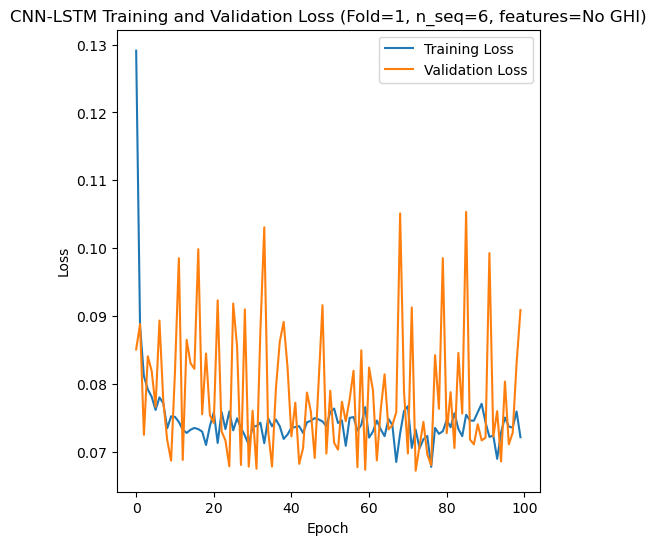

Epoch 1/100
84/84 [==============================] - 30s 198ms/step - loss: 0.1355 - accuracy: 0.5595 - mae: 0.1178 - rmse: 0.1355 - mape: 20.2737 - pearson: 0.6187 - val_loss: 0.0450 - val_accuracy: 0.9000 - val_mae: 0.0384 - val_rmse: 0.0450 - val_mape: 6.8417 - val_pearson: 0.9324
Epoch 2/100
84/84 [==============================] - 12s 147ms/step - loss: 0.0886 - accuracy: 0.7143 - mae: 0.0724 - rmse: 0.0886 - mape: 12.6799 - pearson: 0.7539 - val_loss: 0.0721 - val_accuracy: 0.9000 - val_mae: 0.0570 - val_rmse: 0.0721 - val_mape: 10.0553 - val_pearson: 0.8225
Epoch 3/100
84/84 [==============================] - 13s 150ms/step - loss: 0.0779 - accuracy: 0.6786 - mae: 0.0627 - rmse: 0.0779 - mape: 11.0933 - pearson: 0.7543 - val_loss: 0.0669 - val_accuracy: 0.9000 - val_mae: 0.0564 - val_rmse: 0.0669 - val_mape: 9.0918 - val_pearson: 0.9089
Epoch 4/100
84/84 [==============================] - 13s 153ms/step - loss: 0.0790 - accuracy: 0.6786 - mae: 0.0633 - rmse: 0.0790 - mape: 10.98

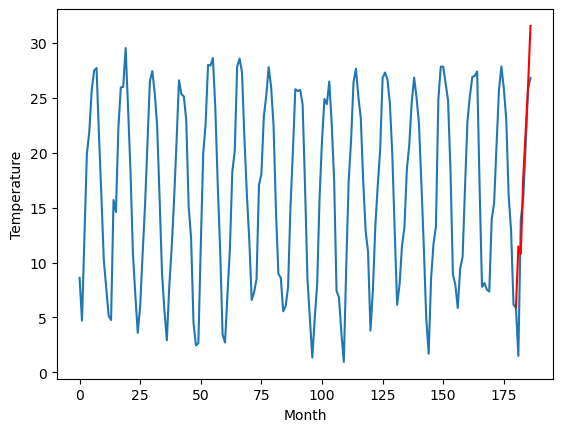

Weather Station 2:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
6.69		6.11		-0.58
2.65		5.41		2.76
12.84		12.29		-0.55
16.60		16.57		-0.03
21.78		20.69		-1.09
29.03		26.20		-2.83
[180, 181, 182, 183, 184, 185, 186]
[2.63, 6.105195124149322, 5.410853464603424, 12.289010126590728, 16.566388685703277, 20.685254175662994, 26.19681986093521]


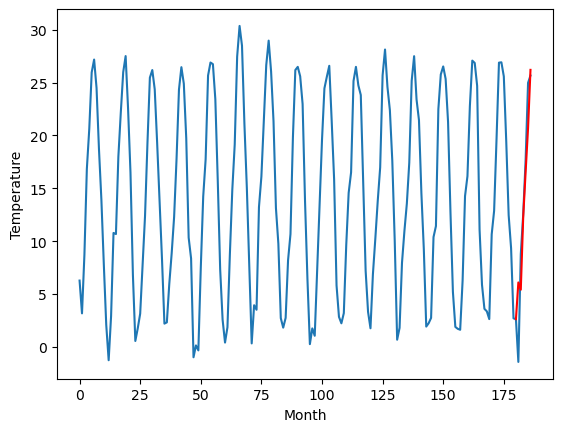

Weather Station 3:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
12.70		11.38		-1.32
15.43		10.68		-4.75
17.24		17.56		0.32
19.05		21.84		2.79
22.63		25.96		3.33
23.85		31.47		7.62
[180, 181, 182, 183, 184, 185, 186]
[16.55, 11.375195124149322, 10.680853464603423, 17.559010126590728, 21.836388685703277, 25.955254175662994, 31.46681986093521]


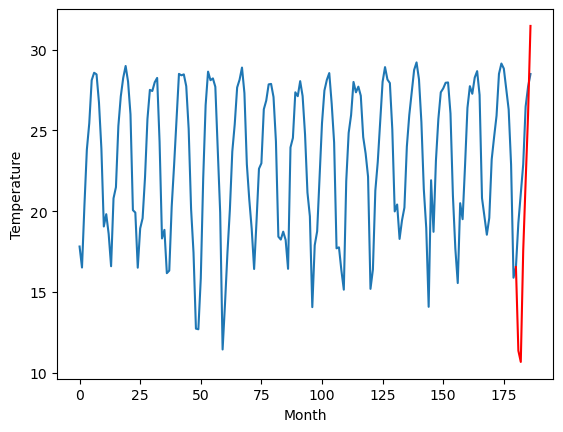

Weather Station 4:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
5.49		7.91		2.42
5.51		7.21		1.70
9.62		14.09		4.47
14.12		18.37		4.25
19.38		22.49		3.11
24.95		28.00		3.05
[180, 181, 182, 183, 184, 185, 186]
[-0.83, 7.905195124149323, 7.210853464603424, 14.089010126590729, 18.366388685703278, 22.485254175662995, 27.99681986093521]


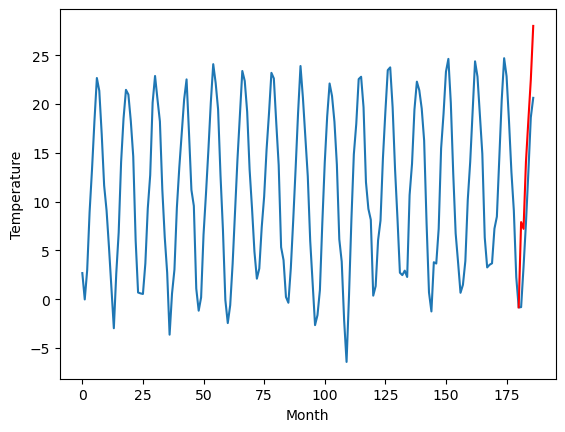

Weather Station 5:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
8.96		7.95		-1.01
8.22		7.25		-0.97
15.55		14.13		-1.42
16.42		18.41		1.99
20.89		22.53		1.64
24.37		28.04		3.67
[180, 181, 182, 183, 184, 185, 186]
[11.52, 7.945195124149322, 7.2508534646034235, 14.129010126590728, 18.406388685703277, 22.525254175662994, 28.03681986093521]


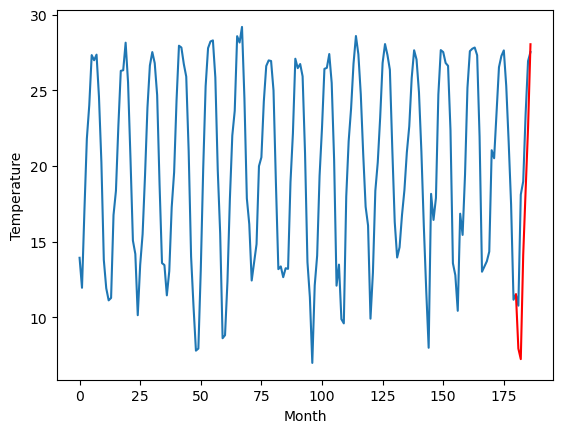

Weather Station 6:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
5.69		5.62		-0.07
3.34		4.92		1.58
11.72		11.80		0.08
13.84		16.08		2.24
17.88		20.20		2.32
22.43		25.71		3.28
[180, 181, 182, 183, 184, 185, 186]
[11.47, 5.615195124149323, 4.920853464603424, 11.79901012659073, 16.07638868570328, 20.195254175662996, 25.706819860935212]


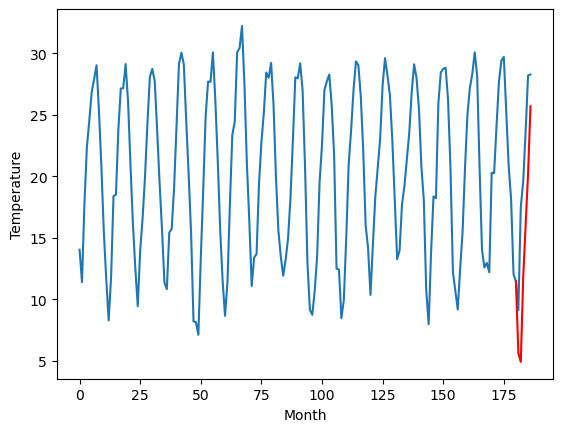

Weather Station 7:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
17.12		17.16		0.04
14.01		16.46		2.45
24.38		23.34		-1.04
26.08		27.62		1.54
30.16		31.74		1.58
35.72		37.25		1.53
[180, 181, 182, 183, 184, 185, 186]
[7.75, 17.155195124149323, 16.460853464603424, 23.33901012659073, 27.616388685703278, 31.735254175662995, 37.24681986093521]


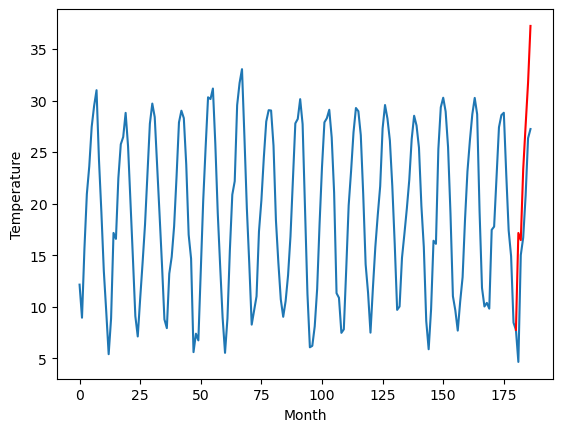

Weather Station 8:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
3.22		2.02		-1.20
6.14		1.32		-4.82
9.24		8.20		-1.04
15.90		12.48		-3.42
20.91		16.60		-4.31
25.90		22.11		-3.79
[180, 181, 182, 183, 184, 185, 186]
[4.9, 2.0151951241493227, 1.3208534646034242, 8.199010126590728, 12.476388685703277, 16.595254175662994, 22.10681986093521]


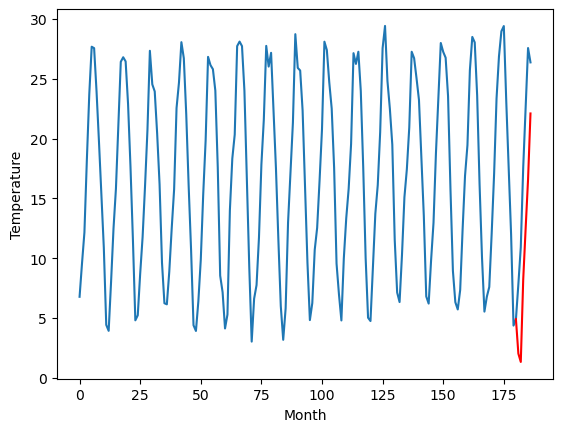

Weather Station 9:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
13.88		13.28		-0.60
12.96		12.58		-0.38
12.56		19.46		6.90
16.42		23.74		7.32
18.64		27.86		9.22
22.88		33.37		10.49
[180, 181, 182, 183, 184, 185, 186]
[14.14, 13.275195124149322, 12.580853464603424, 19.459010126590726, 23.736388685703275, 27.855254175662992, 33.36681986093521]


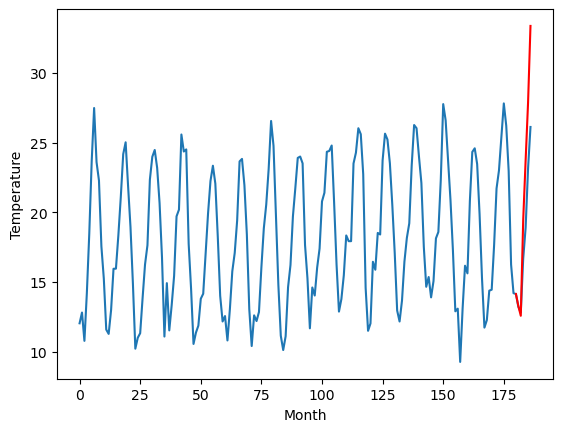

Weather Station 10:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
13.64		13.39		-0.25
14.14		12.69		-1.45
21.02		19.57		-1.45
23.81		23.85		0.04
27.83		27.97		0.14
32.12		33.48		1.36
[180, 181, 182, 183, 184, 185, 186]
[5.55, 13.385195124149323, 12.690853464603425, 19.56901012659073, 23.84638868570328, 27.965254175662995, 33.47681986093521]


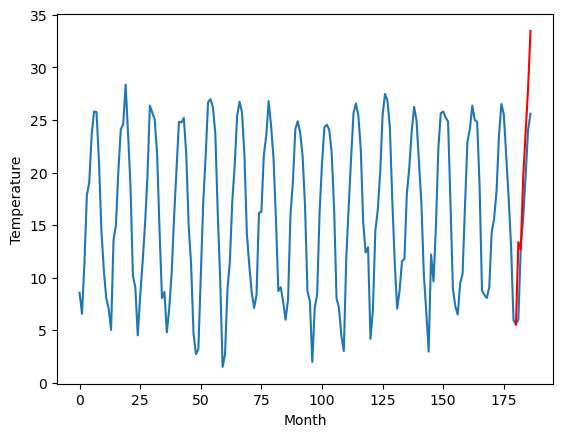

Weather Station 11:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
12.47		11.48		-0.99
13.82		10.78		-3.04
20.03		17.66		-2.37
22.00		21.94		-0.06
26.91		26.06		-0.85
32.32		31.57		-0.75
[180, 181, 182, 183, 184, 185, 186]
[3.19, 11.475195124149323, 10.780853464603425, 17.65901012659073, 21.936388685703278, 26.055254175662995, 31.56681986093521]


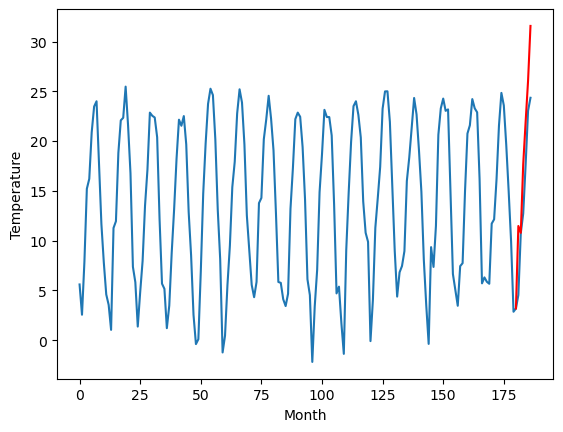

RangeIndex(start=1, stop=12, step=1)
[11.88, 6.69, 12.7, 5.490000000000001, 8.96, 5.69, 17.12, 3.2200000000000015, 13.880000000000003, 13.64, 12.47]
[11.475195124149323, 6.105195124149322, 11.375195124149322, 7.905195124149323, 7.945195124149322, 5.615195124149323, 17.155195124149323, 2.0151951241493227, 13.275195124149322, 13.385195124149323, 11.475195124149323]
Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0   11.88  11.475195
1                 1    6.69   6.105195
2                 2   12.70  11.375195
3                 3    5.49   7.905195
4                 4    8.96   7.945195
5                 5    5.69   5.615195
6                 6   17.12  17.155195
7                 7    3.22   2.015195
8                 8   13.88  13.275195
9                 9   13.64  13.385195
10               10   12.47  11.475195


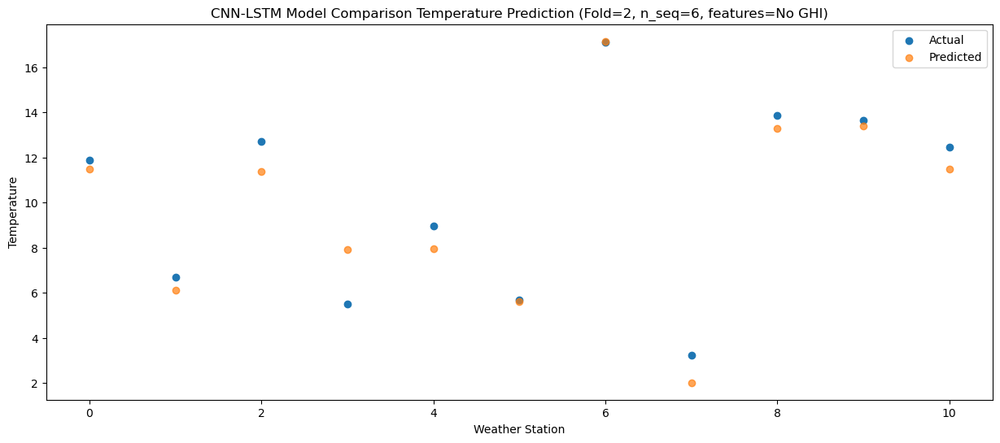

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    7.48  10.780853
1                 1    2.65   5.410853
2                 2   15.43  10.680853
3                 3    5.51   7.210853
4                 4    8.22   7.250853
5                 5    3.34   4.920853
6                 6   14.01  16.460853
7                 7    6.14   1.320853
8                 8   12.96  12.580853
9                 9   14.14  12.690853
10               10   13.82  10.780853


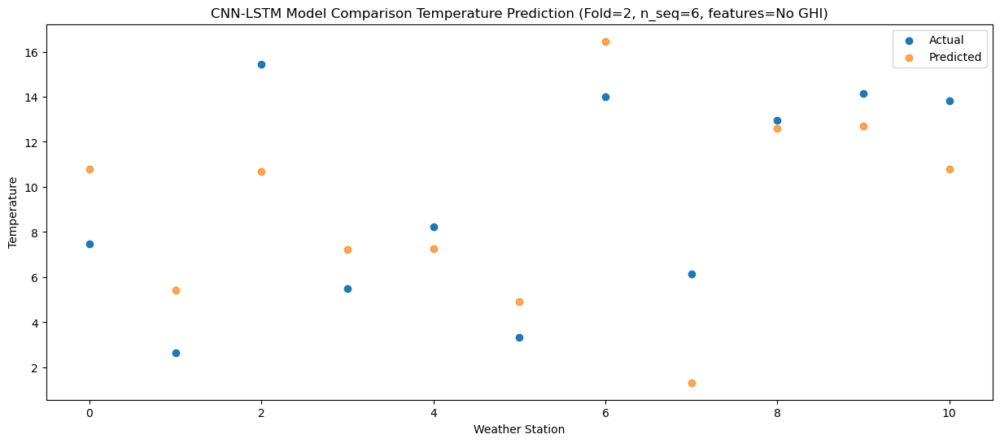

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0   19.90   17.65901
1                 1   12.84   12.28901
2                 2   17.24   17.55901
3                 3    9.62   14.08901
4                 4   15.55   14.12901
5                 5   11.72   11.79901
6                 6   24.38   23.33901
7                 7    9.24    8.19901
8                 8   12.56   19.45901
9                 9   21.02   19.56901
10               10   20.03   17.65901


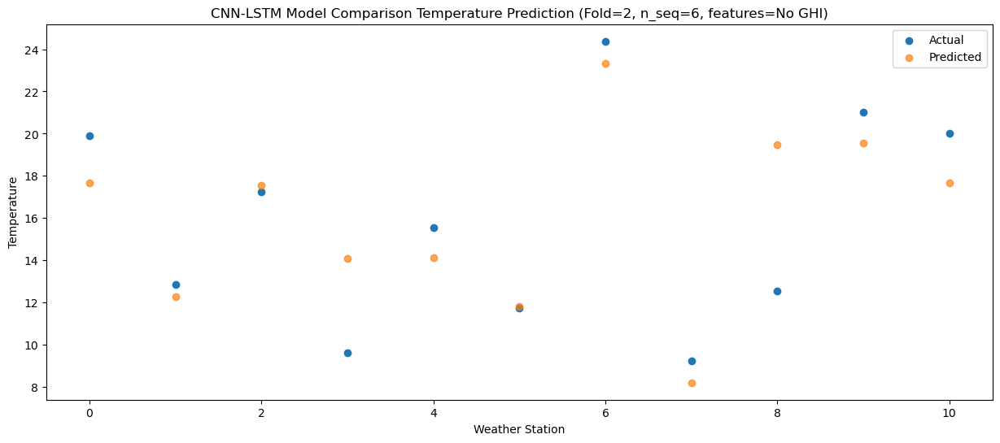

Predictions for (t+3):
    Weather_Station  Actual  Predicted
0                 0   21.77  21.936389
1                 1   16.60  16.566389
2                 2   19.05  21.836389
3                 3   14.12  18.366389
4                 4   16.42  18.406389
5                 5   13.84  16.076389
6                 6   26.08  27.616389
7                 7   15.90  12.476389
8                 8   16.42  23.736389
9                 9   23.81  23.846389
10               10   22.00  21.936389


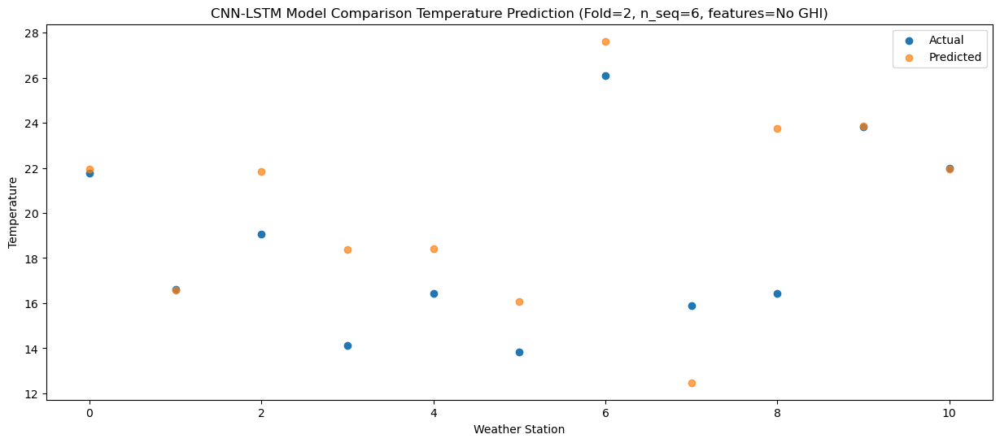

Predictions for (t+4):
    Weather_Station  Actual  Predicted
0                 0   26.55  26.055254
1                 1   21.78  20.685254
2                 2   22.63  25.955254
3                 3   19.38  22.485254
4                 4   20.89  22.525254
5                 5   17.88  20.195254
6                 6   30.16  31.735254
7                 7   20.91  16.595254
8                 8   18.64  27.855254
9                 9   27.83  27.965254
10               10   26.91  26.055254


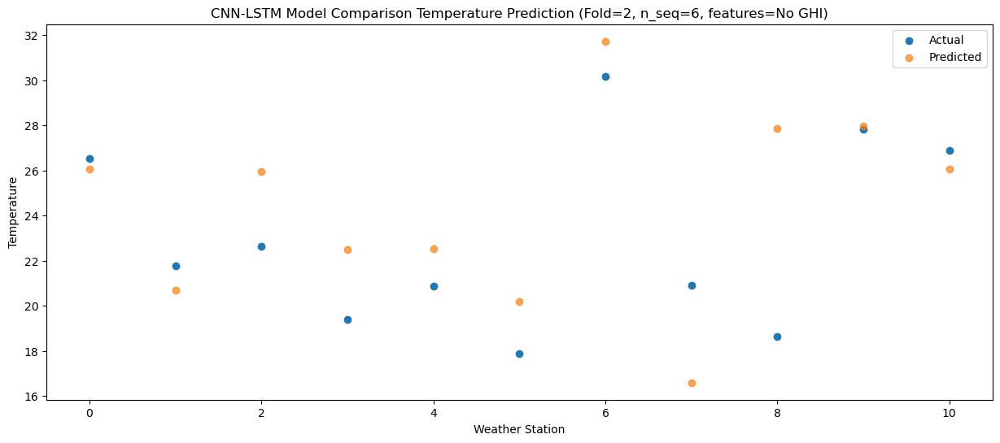

Predictions for (t+5):
    Weather_Station  Actual  Predicted
0                 0   31.80   31.56682
1                 1   29.03   26.19682
2                 2   23.85   31.46682
3                 3   24.95   27.99682
4                 4   24.37   28.03682
5                 5   22.43   25.70682
6                 6   35.72   37.24682
7                 7   25.90   22.10682
8                 8   22.88   33.36682
9                 9   32.12   33.47682
10               10   32.32   31.56682


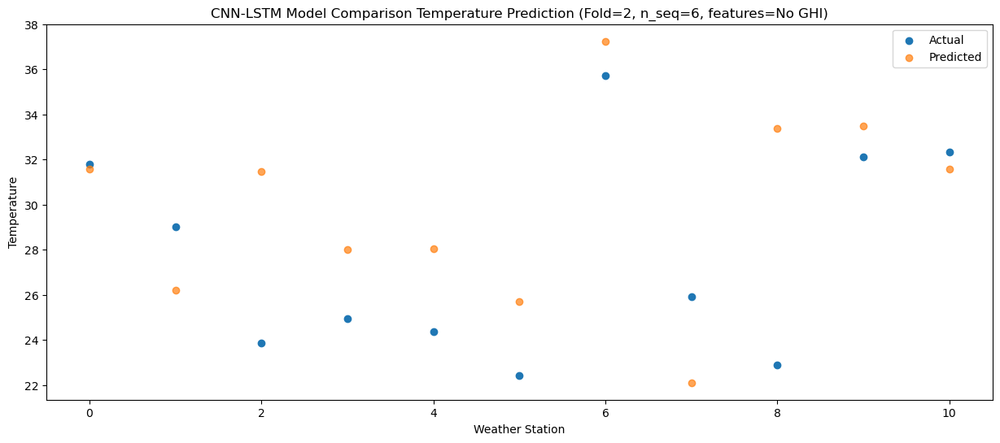

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_2 (Conv1D)           (None, 1, 1024)           2017280   
                                                                 
 max_pooling1d_2 (MaxPooling  (None, 1, 1024)          0         
 1D)                                                             
                                                                 
 dropout_6 (Dropout)         (None, 1, 1024)           0         
                                                                 
 lstm_4 (LSTM)               (None, 1, 1024)           8392704   
                                                                 
 dropout_7 (Dropout)         (None, 1, 1024)           0         
                                                                 
 lstm_5 (LSTM)               (None, 1024)              8392704   
                                                      

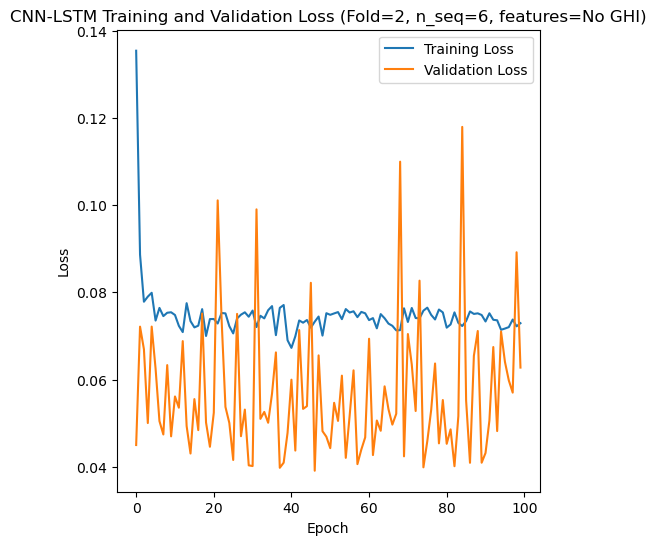

Epoch 1/100
84/84 [==============================] - 31s 196ms/step - loss: 0.1291 - accuracy: 0.5952 - mae: 0.1095 - rmse: 0.1291 - mape: 19.3521 - pearson: 0.6458 - val_loss: 0.1193 - val_accuracy: 0.2000 - val_mae: 0.0990 - val_rmse: 0.1193 - val_mape: 20.4292 - val_pearson: 0.5648
Epoch 2/100
84/84 [==============================] - 13s 153ms/step - loss: 0.0820 - accuracy: 0.6548 - mae: 0.0663 - rmse: 0.0820 - mape: 11.8917 - pearson: 0.7506 - val_loss: 0.0881 - val_accuracy: 0.7000 - val_mae: 0.0703 - val_rmse: 0.0881 - val_mape: 14.1024 - val_pearson: 0.7219
Epoch 3/100
84/84 [==============================] - 13s 150ms/step - loss: 0.0808 - accuracy: 0.7738 - mae: 0.0660 - rmse: 0.0808 - mape: 11.9511 - pearson: 0.7987 - val_loss: 0.0877 - val_accuracy: 0.7000 - val_mae: 0.0642 - val_rmse: 0.0877 - val_mape: 13.4982 - val_pearson: 0.7339
Epoch 4/100
84/84 [==============================] - 13s 153ms/step - loss: 0.0793 - accuracy: 0.7738 - mae: 0.0637 - rmse: 0.0793 - mape: 11.

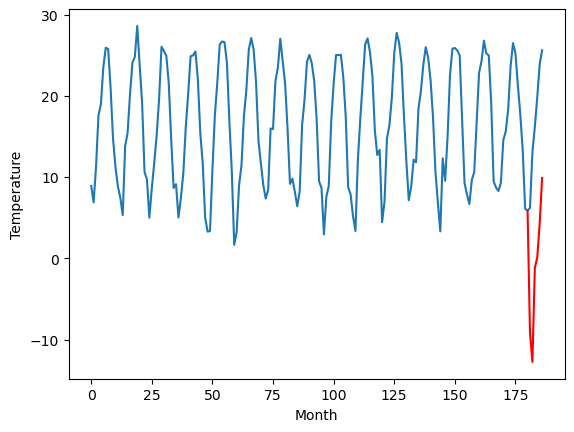

Weather Station 2:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
8.42		8.63		0.21
4.70		5.06		0.36
16.67		16.61		-0.06
18.53		17.93		-0.60
22.75		22.06		-0.69
29.46		27.71		-1.75
[180, 181, 182, 183, 184, 185, 186]
[3.2, 8.631855673789978, 5.055931515693665, 16.609481282234192, 17.925364203453064, 22.05714292049408, 27.70517415523529]


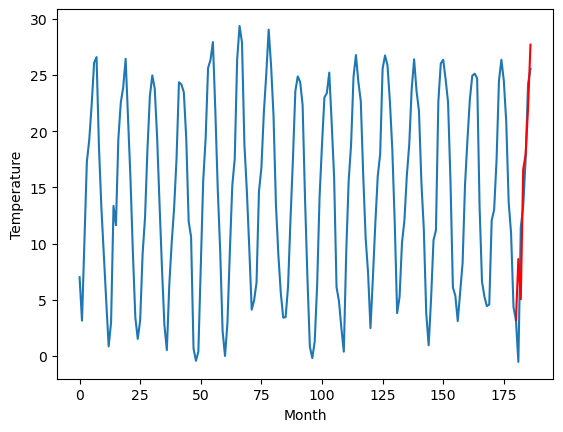

Weather Station 3:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
10.30		8.10		-2.20
12.60		4.53		-8.07
13.75		16.08		2.33
19.48		17.40		-2.08
24.28		21.53		-2.75
29.13		27.18		-1.95
[180, 181, 182, 183, 184, 185, 186]
[8.48, 8.101855673789977, 4.525931515693664, 16.07948128223419, 17.395364203453063, 21.52714292049408, 27.17517415523529]


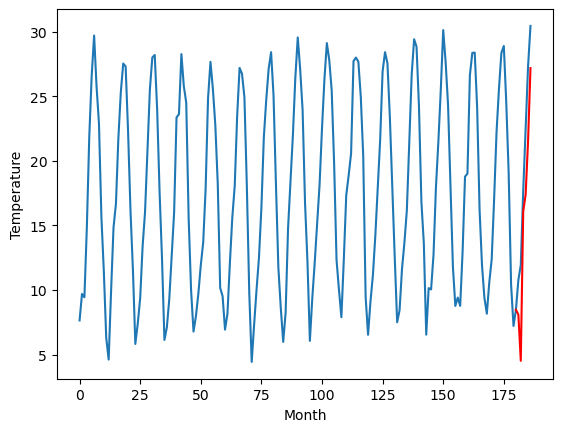

Weather Station 4:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
1.74		2.26		0.52
0.42		-1.31		-1.73
10.63		10.24		-0.39
12.98		11.56		-1.42
17.05		15.69		-1.36
22.97		21.34		-1.63
[180, 181, 182, 183, 184, 185, 186]
[1.55, 2.261855673789978, -1.3140684843063353, 10.239481282234191, 11.555364203453063, 15.687142920494079, 21.33517415523529]


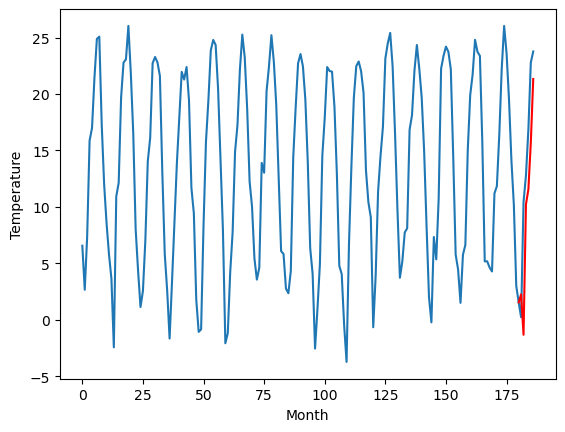

Weather Station 5:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
7.43		7.96		0.53
3.56		4.39		0.83
16.64		15.94		-0.70
19.93		17.26		-2.67
24.50		21.39		-3.11
31.98		27.04		-4.94
[180, 181, 182, 183, 184, 185, 186]
[1.08, 7.961855673789978, 4.385931515693665, 15.939481282234192, 17.255364203453063, 21.387142920494078, 27.03517415523529]


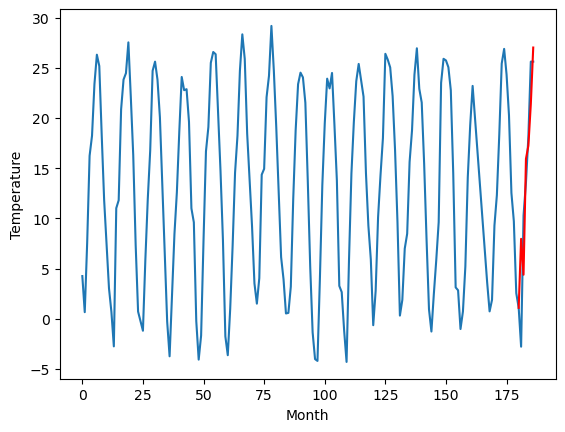

Weather Station 6:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
5.57		6.08		0.51
2.85		2.51		-0.34
14.18		14.06		-0.12
17.63		15.38		-2.25
21.91		19.51		-2.40
28.62		25.16		-3.46
[180, 181, 182, 183, 184, 185, 186]
[0.21, 6.081855673789978, 2.505931515693664, 14.059481282234191, 15.375364203453064, 19.50714292049408, 25.15517415523529]


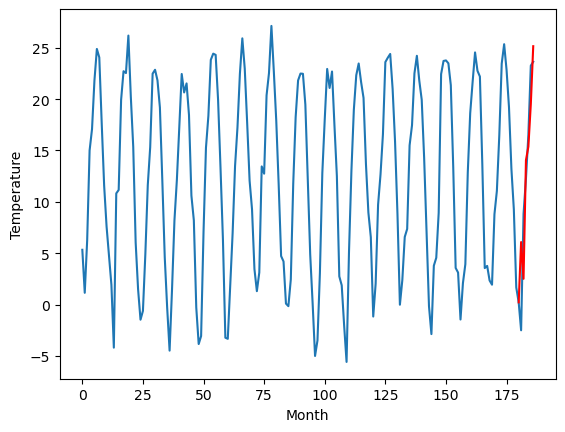

Weather Station 7:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
7.92		6.71		-1.21
8.02		3.14		-4.88
10.99		14.69		3.70
15.77		16.01		0.24
20.82		20.14		-0.68
28.21		25.79		-2.42
[180, 181, 182, 183, 184, 185, 186]
[-8.22, 6.711855673789978, 3.135931515693665, 14.689481282234192, 16.005364203453063, 20.137142920494078, 25.78517415523529]


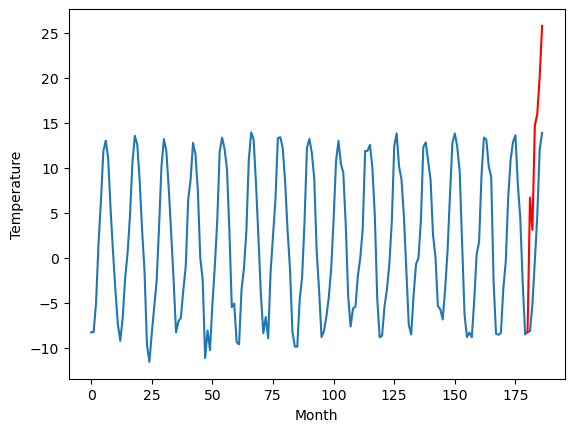

Weather Station 8:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
7.12		5.63		-1.49
9.97		2.06		-7.91
11.57		13.61		2.04
19.54		14.93		-4.61
23.97		19.06		-4.91
31.61		24.71		-6.90
[180, 181, 182, 183, 184, 185, 186]
[10.04, 5.631855673789978, 2.055931515693665, 13.609481282234192, 14.925364203453064, 19.05714292049408, 24.70517415523529]


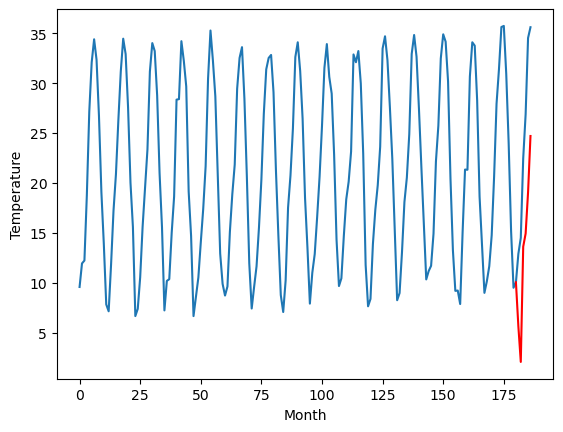

Weather Station 9:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
5.47		3.31		-2.16
6.40		-0.26		-6.66
6.18		11.29		5.11
8.37		12.61		4.24
12.66		16.74		4.08
14.36		22.39		8.03
[180, 181, 182, 183, 184, 185, 186]
[9.17, 3.311855673789978, -0.26406848430633545, 11.289481282234192, 12.605364203453064, 16.73714292049408, 22.38517415523529]


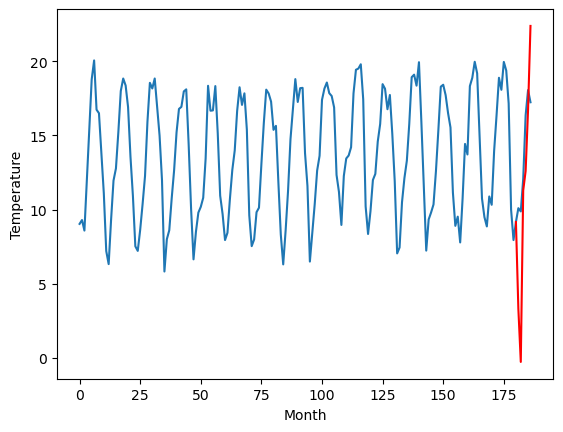

Weather Station 10:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
2.31		4.39		2.08
2.19		0.82		-1.37
7.19		12.37		5.18
11.81		13.69		1.88
16.64		17.82		1.18
22.51		23.47		0.96
[180, 181, 182, 183, 184, 185, 186]
[0.94, 4.391855673789978, 0.8159315156936646, 12.369481282234192, 13.685364203453064, 17.817142920494078, 23.46517415523529]


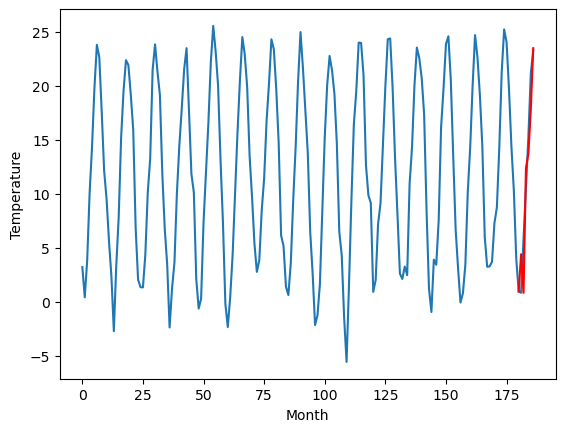

Weather Station 11:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
-9.80		-9.18		0.62
-10.60		-12.75		-2.15
-3.41		-1.20		2.21
1.46		0.12		-1.34
5.72		4.25		-1.47
11.89		9.90		-1.99
[180, 181, 182, 183, 184, 185, 186]
[-0.13, -9.178144326210022, -12.754068484306336, -1.2005187177658083, 0.11536420345306375, 4.247142920494079, 9.89517415523529]


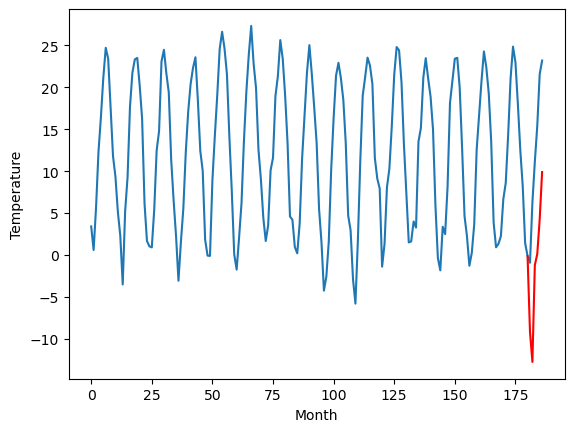

RangeIndex(start=1, stop=12, step=1)
[-8.520000000000001, 8.420000000000002, 10.299999999999999, 1.7399999999999998, 7.430000000000001, 5.5699999999999985, 7.92, 7.119999999999999, 5.4700000000000015, 2.3099999999999996, -9.8]
[-9.178144326210022, 8.631855673789978, 8.101855673789977, 2.261855673789978, 7.961855673789978, 6.081855673789978, 6.711855673789978, 5.631855673789978, 3.311855673789978, 4.391855673789978, -9.178144326210022]
Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0   -8.52  -9.178144
1                 1    8.42   8.631856
2                 2   10.30   8.101856
3                 3    1.74   2.261856
4                 4    7.43   7.961856
5                 5    5.57   6.081856
6                 6    7.92   6.711856
7                 7    7.12   5.631856
8                 8    5.47   3.311856
9                 9    2.31   4.391856
10               10   -9.80  -9.178144


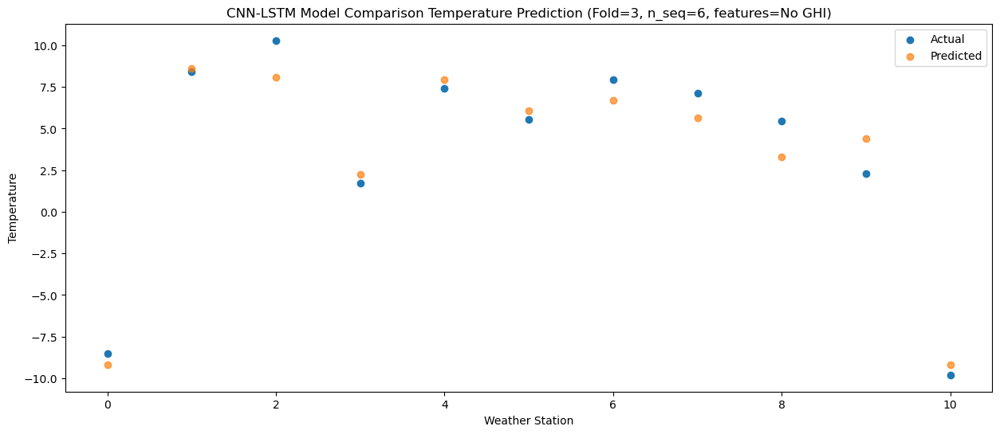

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0   -8.15 -12.754068
1                 1    4.70   5.055932
2                 2   12.60   4.525932
3                 3    0.42  -1.314068
4                 4    3.56   4.385932
5                 5    2.85   2.505932
6                 6    8.02   3.135932
7                 7    9.97   2.055932
8                 8    6.40  -0.264068
9                 9    2.19   0.815932
10               10  -10.60 -12.754068


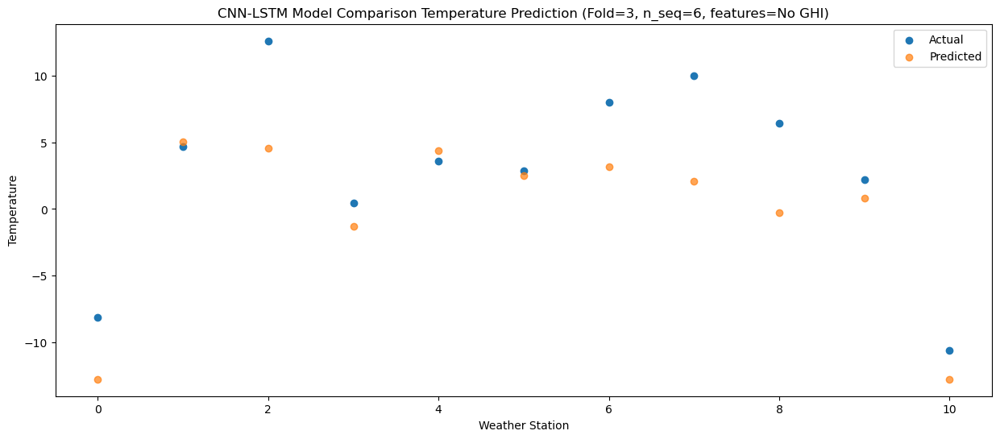

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0   -1.35  -1.200519
1                 1   16.67  16.609481
2                 2   13.75  16.079481
3                 3   10.63  10.239481
4                 4   16.64  15.939481
5                 5   14.18  14.059481
6                 6   10.99  14.689481
7                 7   11.57  13.609481
8                 8    6.18  11.289481
9                 9    7.19  12.369481
10               10   -3.41  -1.200519


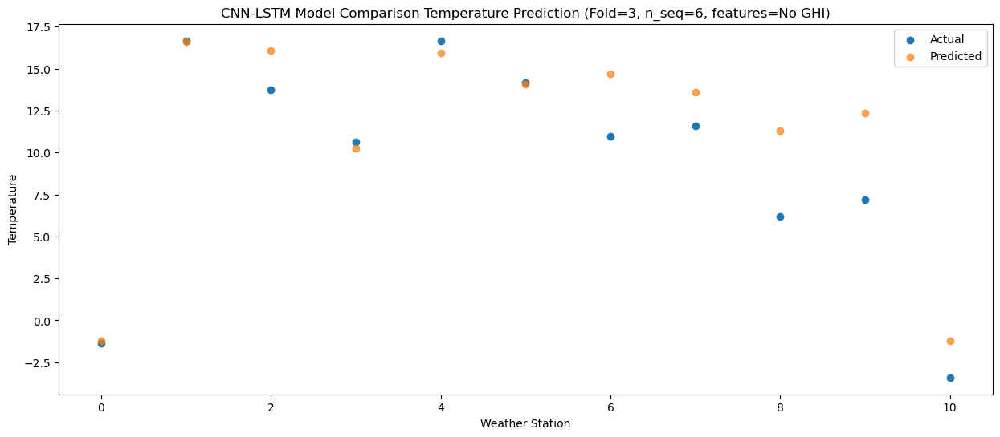

Predictions for (t+3):
    Weather_Station  Actual  Predicted
0                 0    1.81   0.115364
1                 1   18.53  17.925364
2                 2   19.48  17.395364
3                 3   12.98  11.555364
4                 4   19.93  17.255364
5                 5   17.63  15.375364
6                 6   15.77  16.005364
7                 7   19.54  14.925364
8                 8    8.37  12.605364
9                 9   11.81  13.685364
10               10    1.46   0.115364


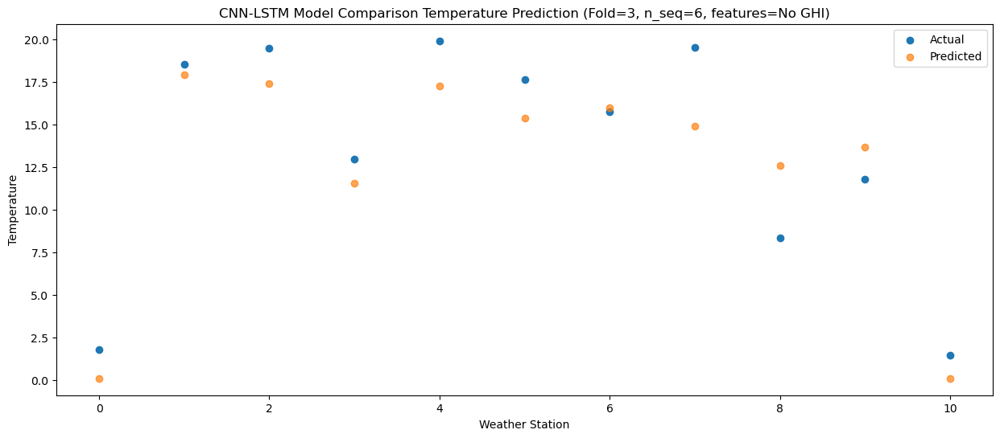

Predictions for (t+4):
    Weather_Station  Actual  Predicted
0                 0    5.47   4.247143
1                 1   22.75  22.057143
2                 2   24.28  21.527143
3                 3   17.05  15.687143
4                 4   24.50  21.387143
5                 5   21.91  19.507143
6                 6   20.82  20.137143
7                 7   23.97  19.057143
8                 8   12.66  16.737143
9                 9   16.64  17.817143
10               10    5.72   4.247143


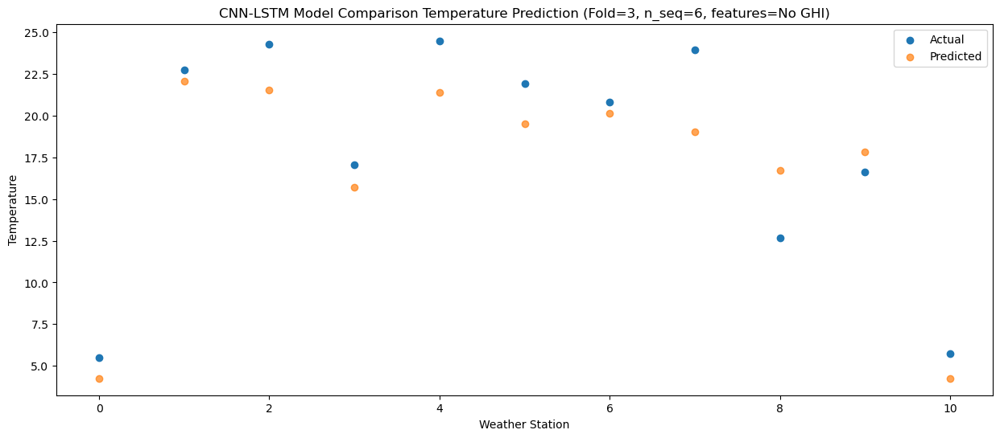

Predictions for (t+5):
    Weather_Station  Actual  Predicted
0                 0    9.53   9.895174
1                 1   29.46  27.705174
2                 2   29.13  27.175174
3                 3   22.97  21.335174
4                 4   31.98  27.035174
5                 5   28.62  25.155174
6                 6   28.21  25.785174
7                 7   31.61  24.705174
8                 8   14.36  22.385174
9                 9   22.51  23.465174
10               10   11.89   9.895174


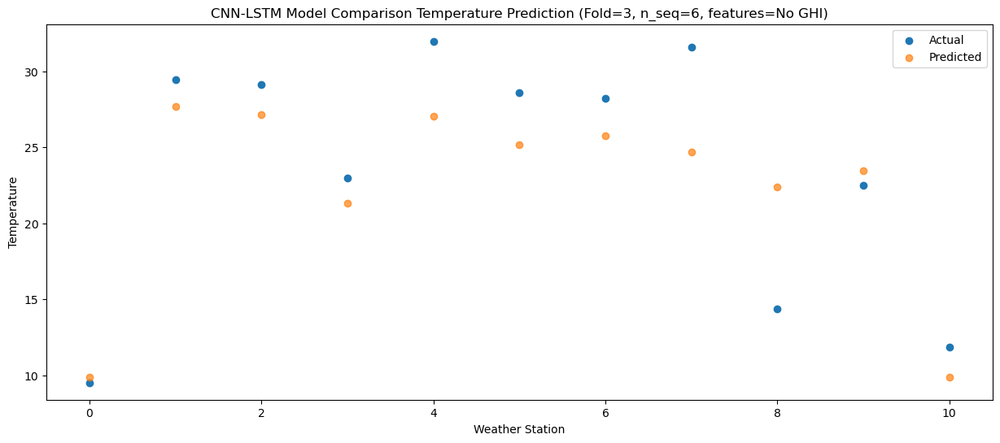

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_3 (Conv1D)           (None, 1, 1024)           2017280   
                                                                 
 max_pooling1d_3 (MaxPooling  (None, 1, 1024)          0         
 1D)                                                             
                                                                 
 dropout_9 (Dropout)         (None, 1, 1024)           0         
                                                                 
 lstm_6 (LSTM)               (None, 1, 1024)           8392704   
                                                                 
 dropout_10 (Dropout)        (None, 1, 1024)           0         
                                                                 
 lstm_7 (LSTM)               (None, 1024)              8392704   
                                                      

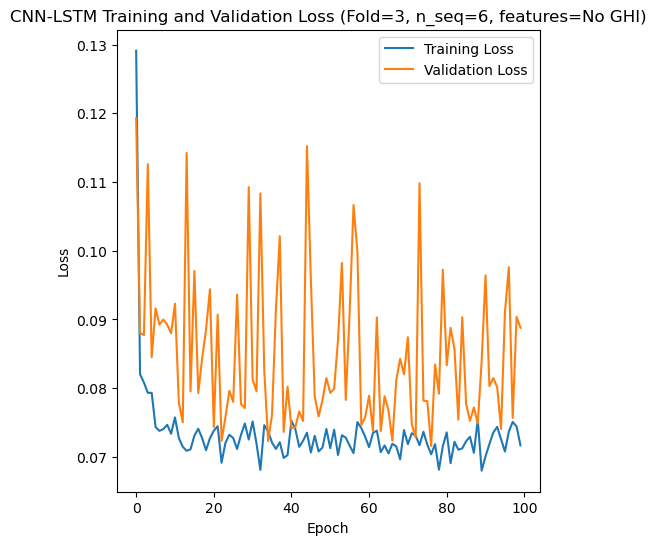

Epoch 1/100
84/84 [==============================] - 31s 211ms/step - loss: 0.1279 - accuracy: 0.5833 - mae: 0.1095 - rmse: 0.1279 - mape: 18.5850 - pearson: 0.6346 - val_loss: 0.1007 - val_accuracy: 0.7000 - val_mae: 0.0886 - val_rmse: 0.1007 - val_mape: 14.6129 - val_pearson: 0.7814
Epoch 2/100
84/84 [==============================] - 13s 153ms/step - loss: 0.0778 - accuracy: 0.6429 - mae: 0.0633 - rmse: 0.0778 - mape: 11.0210 - pearson: 0.7485 - val_loss: 0.0742 - val_accuracy: 0.7000 - val_mae: 0.0583 - val_rmse: 0.0742 - val_mape: 10.8561 - val_pearson: 0.8209
Epoch 3/100
84/84 [==============================] - 13s 152ms/step - loss: 0.0765 - accuracy: 0.6667 - mae: 0.0614 - rmse: 0.0765 - mape: 10.7524 - pearson: 0.7490 - val_loss: 0.0922 - val_accuracy: 0.7000 - val_mae: 0.0752 - val_rmse: 0.0922 - val_mape: 12.9338 - val_pearson: 0.8143
Epoch 4/100
84/84 [==============================] - 13s 152ms/step - loss: 0.0764 - accuracy: 0.6786 - mae: 0.0612 - rmse: 0.0764 - mape: 10.

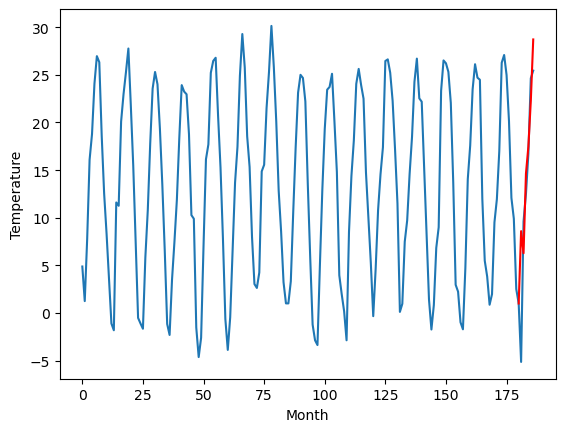

Weather Station 2:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
8.34		6.92		-1.42
11.77		4.60		-7.17
13.37		12.96		-0.41
14.81		15.80		0.99
18.85		20.59		1.74
20.48		27.03		6.55
[180, 181, 182, 183, 184, 185, 186]
[14.25, 6.919806554317474, 4.60382588148117, 12.963824584484101, 15.800264909267426, 20.58736808538437, 27.03092057943344]


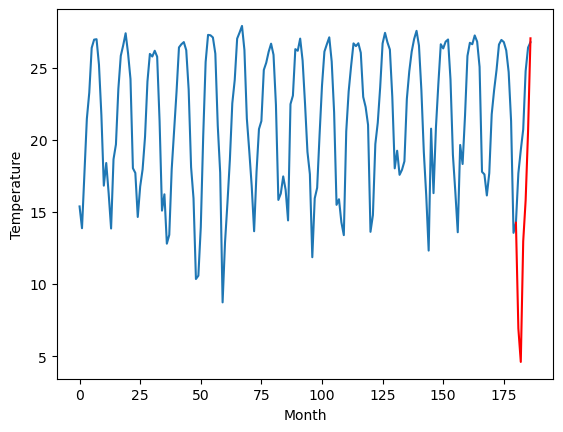

Weather Station 3:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
4.29		3.54		-0.75
2.37		1.22		-1.15
11.70		9.58		-2.12
12.77		12.42		-0.35
17.24		17.21		-0.03
21.50		23.65		2.15
[180, 181, 182, 183, 184, 185, 186]
[9.06, 3.539806554317474, 1.2238258814811704, 9.5838245844841, 12.420264909267425, 17.207368085384367, 23.65092057943344]


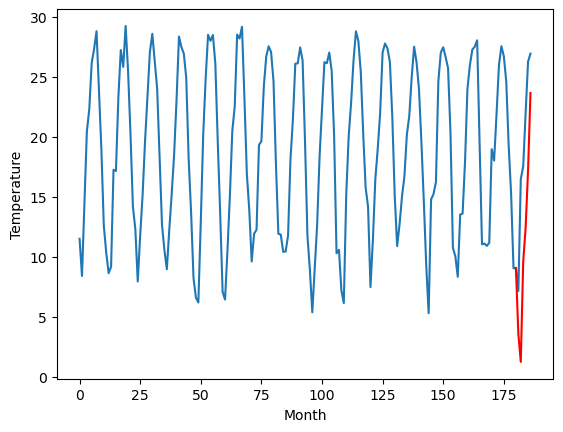

Weather Station 4:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
2.70		2.90		0.20
-0.76		0.58		1.34
10.20		8.94		-1.26
11.89		11.78		-0.11
16.05		16.57		0.52
21.73		23.01		1.28
[180, 181, 182, 183, 184, 185, 186]
[7.48, 2.8998065543174745, 0.5838258814811708, 8.943824584484101, 11.780264909267427, 16.56736808538437, 23.010920579433442]


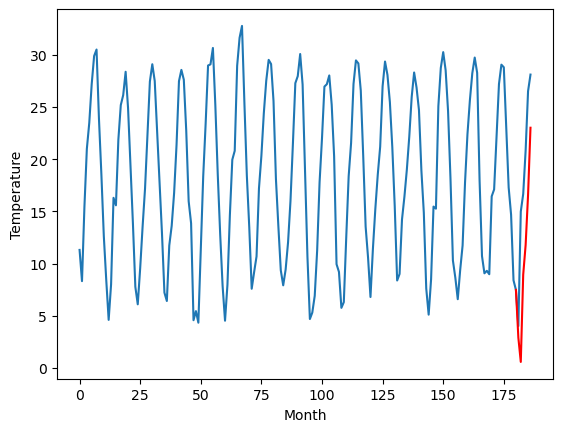

Weather Station 5:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
4.29		4.17		-0.12
0.40		1.85		1.45
11.32		10.21		-1.11
13.50		13.05		-0.45
17.03		17.84		0.81
23.88		24.28		0.40
[180, 181, 182, 183, 184, 185, 186]
[7.33, 4.169806554317474, 1.8538258814811703, 10.213824584484101, 13.050264909267426, 17.83736808538437, 24.28092057943344]


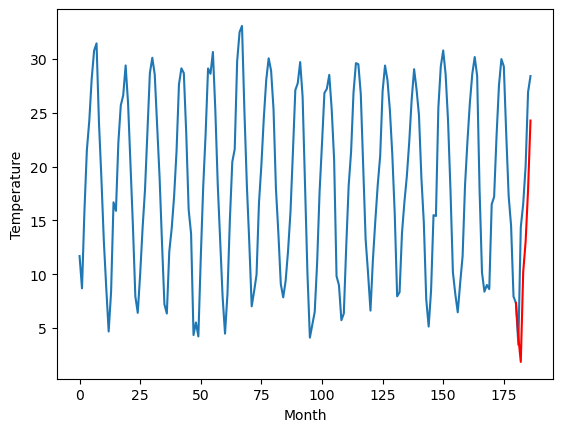

Weather Station 6:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
14.28		14.66		0.38
12.71		12.34		-0.37
21.96		20.70		-1.26
24.19		23.54		-0.65
29.68		28.33		-1.35
34.64		34.77		0.13
[180, 181, 182, 183, 184, 185, 186]
[6.59, 14.659806554317475, 12.343825881481171, 20.703824584484103, 23.540264909267428, 28.32736808538437, 34.770920579433444]


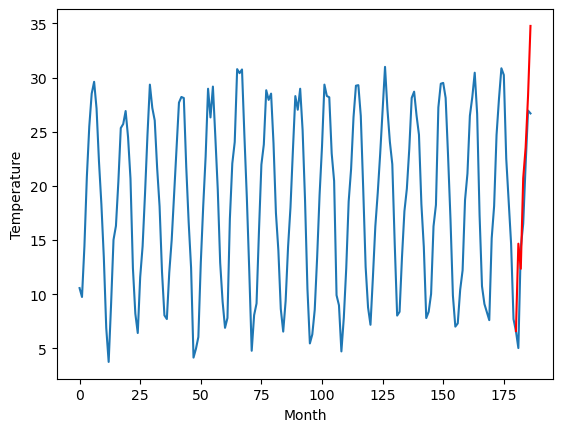

Weather Station 7:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
11.72		10.77		-0.95
12.39		8.45		-3.94
18.79		16.81		-1.98
21.52		19.65		-1.87
24.97		24.44		-0.53
28.99		30.88		1.89
[180, 181, 182, 183, 184, 185, 186]
[6.04, 10.769806554317475, 8.45382588148117, 16.813824584484102, 19.650264909267428, 24.43736808538437, 30.880920579433443]


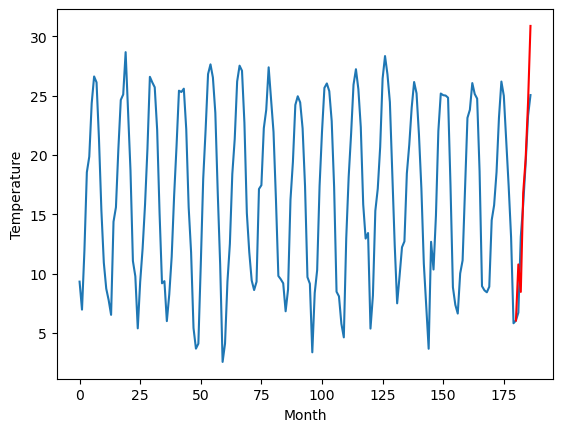

Weather Station 8:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
9.64		10.59		0.95
6.03		8.27		2.24
18.30		16.63		-1.67
20.20		19.47		-0.73
24.24		24.26		0.02
30.54		30.70		0.16
[180, 181, 182, 183, 184, 185, 186]
[3.13, 10.589806554317475, 8.273825881481171, 16.633824584484103, 19.470264909267428, 24.25736808538437, 30.700920579433443]


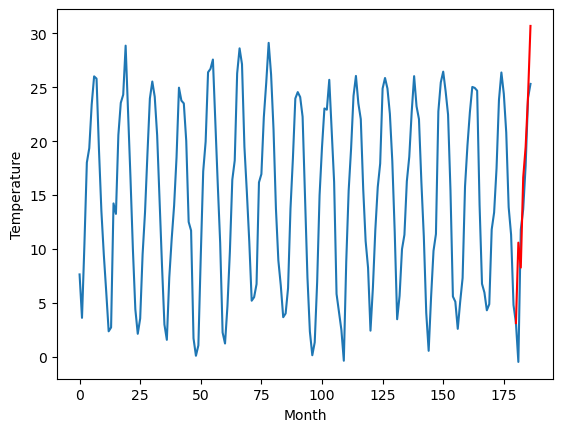

Weather Station 9:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
10.11		10.97		0.86
6.75		8.65		1.90
18.72		17.01		-1.71
22.37		19.85		-2.52
26.78		24.64		-2.14
34.02		31.08		-2.94
[180, 181, 182, 183, 184, 185, 186]
[-0.29, 10.969806554317474, 8.65382588148117, 17.013824584484098, 19.850264909267423, 24.637368085384367, 31.08092057943344]


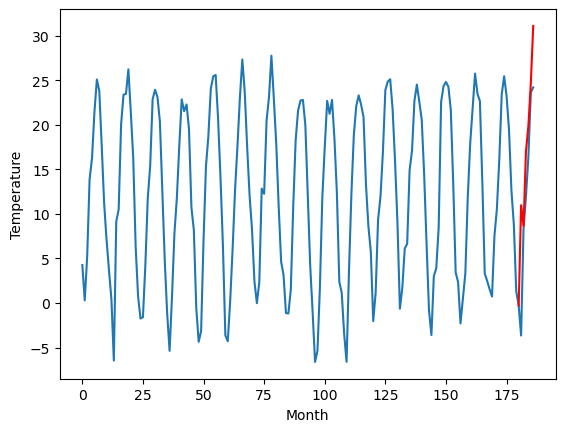

Weather Station 10:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
8.53		9.84		1.31
4.09		7.52		3.43
17.95		15.88		-2.07
21.66		18.72		-2.94
26.44		23.51		-2.93
33.83		29.95		-3.88
[180, 181, 182, 183, 184, 185, 186]
[-1.03, 9.839806554317475, 7.523825881481171, 15.8838245844841, 18.720264909267428, 23.50736808538437, 29.950920579433443]


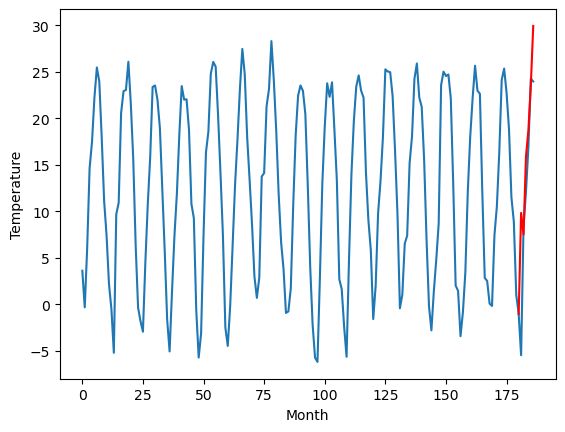

Weather Station 11:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
7.40		8.60		1.20
5.16		6.28		1.12
15.05		14.64		-0.41
18.85		17.48		-1.37
23.38		22.27		-1.11
30.27		28.71		-1.56
[180, 181, 182, 183, 184, 185, 186]
[-2.29, 8.599806554317475, 6.283825881481171, 14.6438245844841, 17.480264909267426, 22.26736808538437, 28.71092057943344]


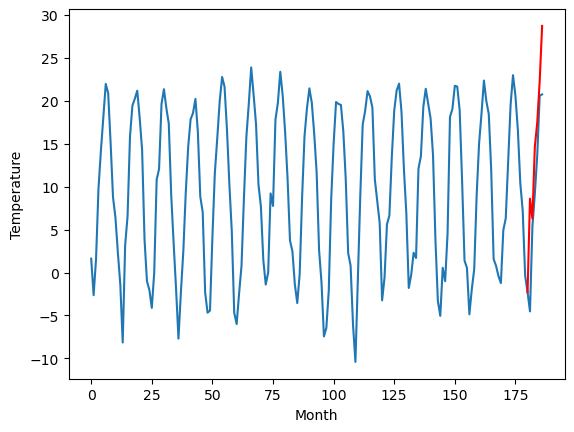

RangeIndex(start=1, stop=12, step=1)
[7.810000000000001, 8.339999999999998, 4.290000000000002, 2.7000000000000006, 4.289999999999999, 14.280000000000001, 11.719999999999999, 9.64, 10.11, 8.53, 7.4]
[8.599806554317475, 6.919806554317474, 3.539806554317474, 2.8998065543174745, 4.169806554317474, 14.659806554317475, 10.769806554317475, 10.589806554317475, 10.969806554317474, 9.839806554317475, 8.599806554317475]
Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    7.81   8.599807
1                 1    8.34   6.919807
2                 2    4.29   3.539807
3                 3    2.70   2.899807
4                 4    4.29   4.169807
5                 5   14.28  14.659807
6                 6   11.72  10.769807
7                 7    9.64  10.589807
8                 8   10.11  10.969807
9                 9    8.53   9.839807
10               10    7.40   8.599807


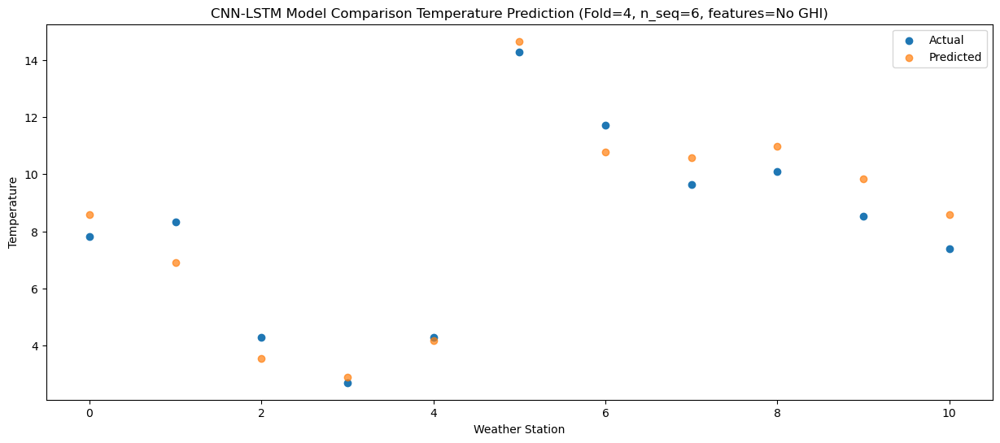

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    1.68   6.283826
1                 1   11.77   4.603826
2                 2    2.37   1.223826
3                 3   -0.76   0.583826
4                 4    0.40   1.853826
5                 5   12.71  12.343826
6                 6   12.39   8.453826
7                 7    6.03   8.273826
8                 8    6.75   8.653826
9                 9    4.09   7.523826
10               10    5.16   6.283826


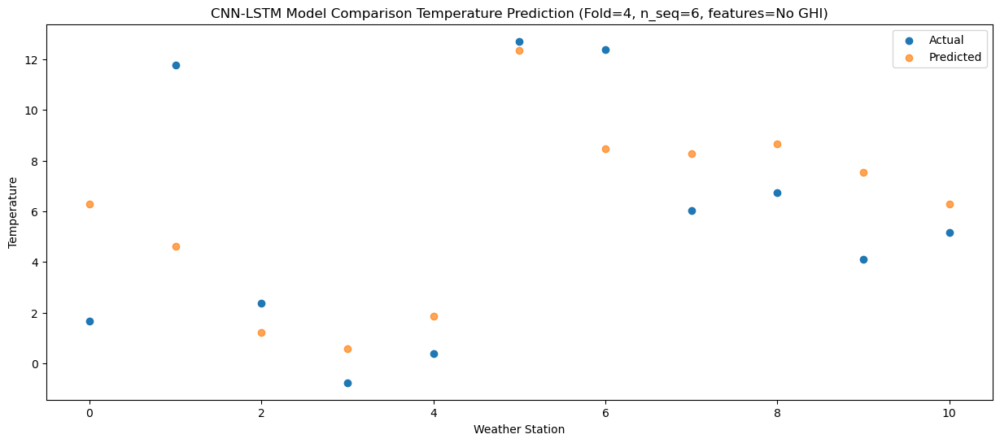

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0   16.41  14.643825
1                 1   13.37  12.963825
2                 2   11.70   9.583825
3                 3   10.20   8.943825
4                 4   11.32  10.213825
5                 5   21.96  20.703825
6                 6   18.79  16.813825
7                 7   18.30  16.633825
8                 8   18.72  17.013825
9                 9   17.95  15.883825
10               10   15.05  14.643825


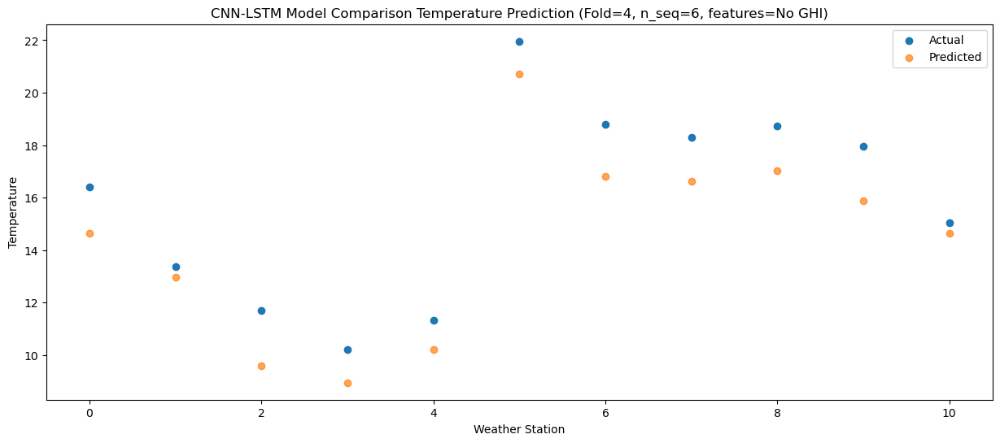

Predictions for (t+3):
    Weather_Station  Actual  Predicted
0                 0   19.32  17.480265
1                 1   14.81  15.800265
2                 2   12.77  12.420265
3                 3   11.89  11.780265
4                 4   13.50  13.050265
5                 5   24.19  23.540265
6                 6   21.52  19.650265
7                 7   20.20  19.470265
8                 8   22.37  19.850265
9                 9   21.66  18.720265
10               10   18.85  17.480265


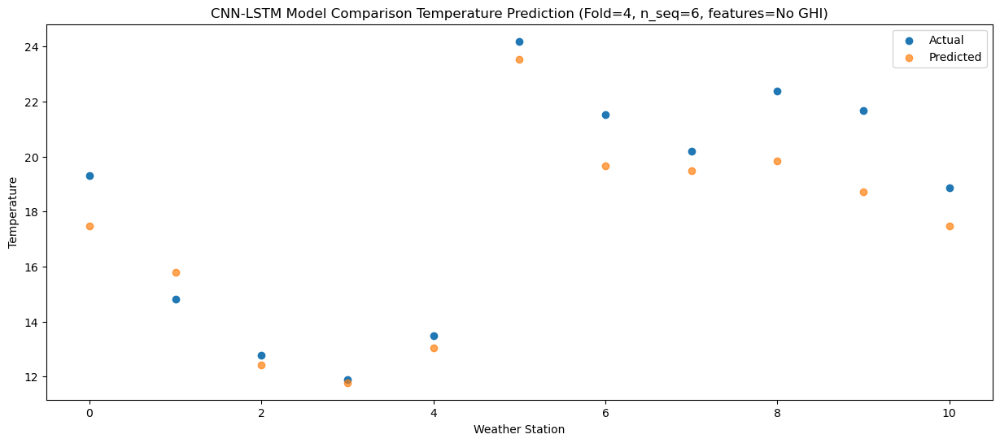

Predictions for (t+4):
    Weather_Station  Actual  Predicted
0                 0   23.53  22.267368
1                 1   18.85  20.587368
2                 2   17.24  17.207368
3                 3   16.05  16.567368
4                 4   17.03  17.837368
5                 5   29.68  28.327368
6                 6   24.97  24.437368
7                 7   24.24  24.257368
8                 8   26.78  24.637368
9                 9   26.44  23.507368
10               10   23.38  22.267368


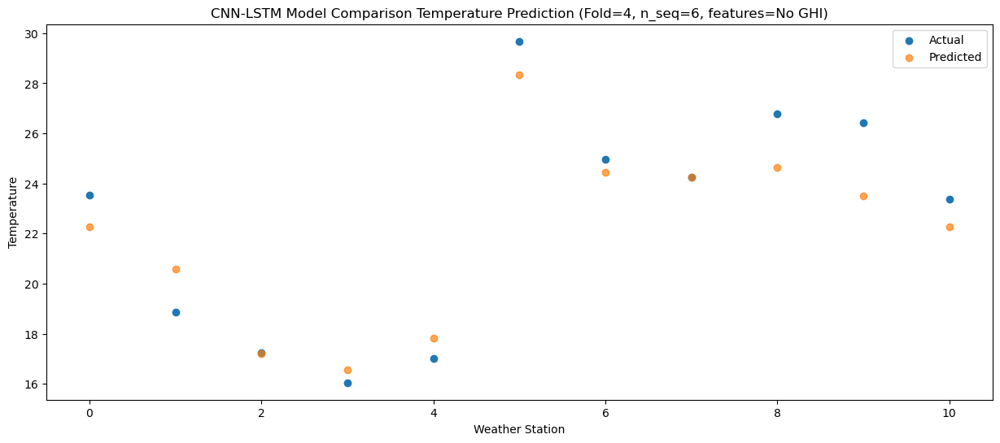

Predictions for (t+5):
    Weather_Station  Actual  Predicted
0                 0   31.44  28.710921
1                 1   20.48  27.030921
2                 2   21.50  23.650921
3                 3   21.73  23.010921
4                 4   23.88  24.280921
5                 5   34.64  34.770921
6                 6   28.99  30.880921
7                 7   30.54  30.700921
8                 8   34.02  31.080921
9                 9   33.83  29.950921
10               10   30.27  28.710921


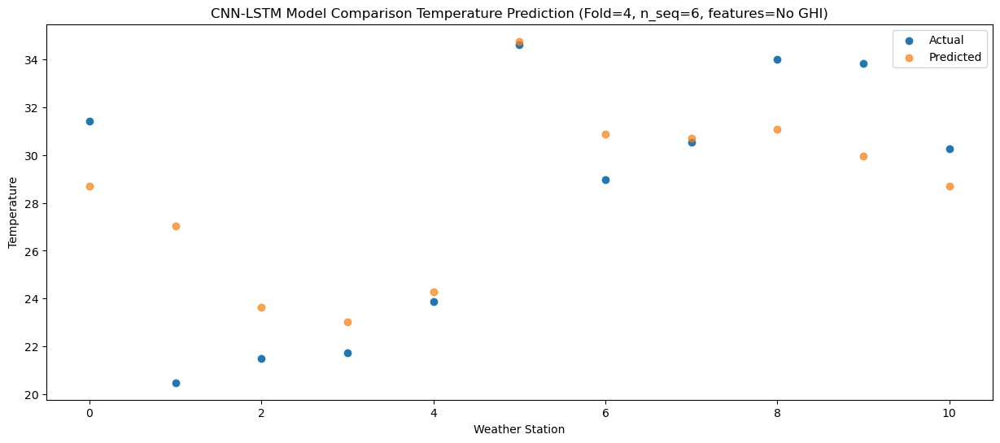

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_4 (Conv1D)           (None, 1, 1024)           2017280   
                                                                 
 max_pooling1d_4 (MaxPooling  (None, 1, 1024)          0         
 1D)                                                             
                                                                 
 dropout_12 (Dropout)        (None, 1, 1024)           0         
                                                                 
 lstm_8 (LSTM)               (None, 1, 1024)           8392704   
                                                                 
 dropout_13 (Dropout)        (None, 1, 1024)           0         
                                                                 
 lstm_9 (LSTM)               (None, 1024)              8392704   
                                                      

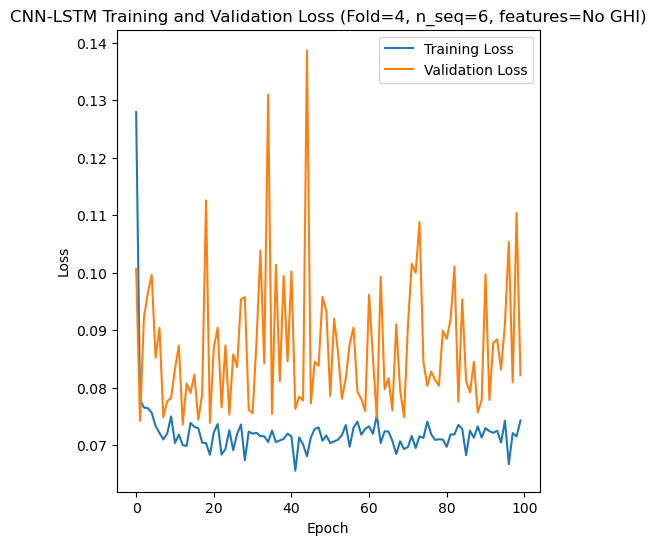

[[1.1893458524622713, 2.8660782035937102, 1.1138134658287238, 1.3769380547663113, 1.866450479080572, 3.980428405638959], [0.9216358564670785, 3.4984309787825754, 1.8692980253459528, 3.6001455964462243, 5.0445066151297375, 4.781798476367416], [1.0445838045447366, 2.8302686818920946, 2.778415578553297, 3.0509057763566885, 3.528402544555647, 4.559350838341085], [1.3204570833665723, 4.550192245408626, 2.7264950000564228, 2.4580726708240475, 2.5522745565397895, 3.919816724244966], [0.9096229252622495, 3.2350840876141946, 1.542389925563651, 1.5379953812583882, 1.4166550798434148, 2.8046257083366015]]
[[0.9196804328398273, 2.3608846382661306, 0.8855890737880369, 1.1173473301800818, 1.6176736454530198, 3.416182204593312], [0.8825504784150553, 2.987069081826644, 1.6468690148266882, 3.5407031637972044, 4.962144535888324, 4.326998651461168], [0.8103303755413407, 2.472649685036053, 1.9893608745661653, 2.1665403116833084, 2.5514329569989984, 3.508223598436876], [1.1083505157990887, 3.53895267183130

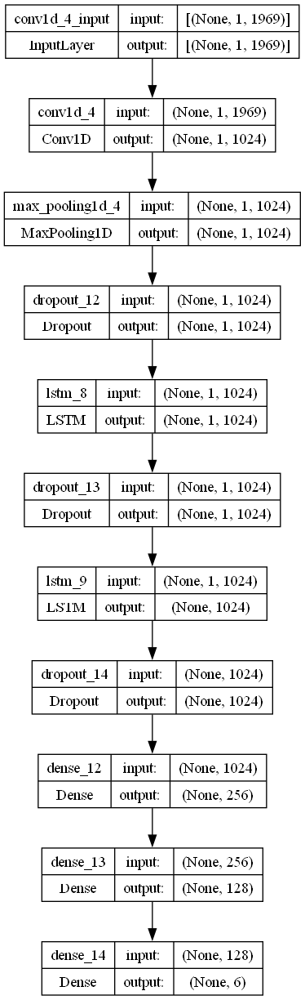

In [2]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, mean_absolute_percentage_error, r2_score
from tensorflow.keras.utils import plot_model

def rmse (y_true, y_pred):
    return K.sqrt(K.mean(K.square(y_pred - y_true)))

# fit the best LSTM model using parameters found by Optuna
def create_best_model(X, y, n_lag, n_seq, n_batch, nb_epoch):
    
    #Parameters:
    #trial (array-like): Optuna parameters.
    #train (array-like): Target values.
    #n_lag (int): Number of lag observations.
    #n_seq (int): Number of sequence observations
    #nb_epoch (int): Maximum number of epochs
    
    # Hyperparameters from the best model
    filters = 1024
    lr = 0.2190346516297967
    optimizer = SGD(learning_rate = lr)
    activation_function = 'relu'
    lstm_units = 1024
    dropout_rate = 0.4908884608454802

    # design network
    model = Sequential()
    model.add(Conv1D(filters=filters, kernel_size=1, activation='relu', input_shape=(X.shape[1], X.shape[2]))) # CNN-LSTM only
    model.add(MaxPooling1D(pool_size=1)) # CNN-LSTM only
    model.add(Dropout(dropout_rate))
    model.add(LSTM(lstm_units, return_sequences=True))
    model.add(Dropout(dropout_rate))
    model.add(LSTM(lstm_units))
    model.add(Dropout(dropout_rate))
    model.add(Dense(256, input_dim=y.shape[1], activation=activation_function))
    model.add(Dense(128, activation=activation_function))
    model.add(Dense(n_seq))
    model.compile(loss=rmse, optimizer=optimizer, metrics=['accuracy', 'mae', rmse, mape, pearson])
        
    return model

# make one forecast with a CNN-LSTM model,
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def forecast_cnnlstm(model, X, n_seq, n_test):
    # reshape input pattern to [samples, timesteps, features]
    X = X.reshape(1, 1, X.shape[1])
    # make forecast
    forecast = model.predict(X)
    # convert to array
    return forecast
     
# evaluate the persistence model
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def make_forecasts(model, X_test, y_test, n_lag, n_seq, n_test):
    forecasts = list()
    for i in range(len(X_test)):
        X, y = X_test[i, :], y_test[i, :]
        # make forecast
        forecast = forecast_cnnlstm(model, X, n_seq, n_test)
        # store the forecast
        forecasts.append(forecast)
    return forecasts
     
# invert differenced forecast
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def inverse_difference(last_ob, forecast):
    # invert first forecast
    inverted = list()
    inverted.append(forecast[0] + last_ob)
    # propagate difference forecast using inverted first value
    for i in range(1, len(forecast)):
        inverted.append(forecast[i] + inverted[i-1])
    return inverted
     
# inverse data transform on forecasts
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def inverse_transform(series, forecasts, scaler, n_test, n_seq):
    inverted = list()
    for i in range(len(forecasts)):
        # create array from forecast
        forecast = forecasts[i]
        forecast = forecast.reshape(1, n_seq)
        # invert scaling
        inv_scale = scaler.inverse_transform(forecast)
        inv_scale = inv_scale[0, :]
        # invert differencing
        index = len(series) - n_test + i - 1
        last_ob = series.values[index]
        inv_diff = inverse_difference(last_ob, inv_scale)
        # store
        inverted.append(inv_diff)
    return inverted
     
# evaluate the RMSE for each forecast time step
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def evaluate_forecasts(test, forecasts, n_lag, n_seq):
    rmse_list = []
    mae_list = []
    mape_list = []
    r2_list = []
    for i in range(n_seq):
        actual = [row[i] for row in test]
        predicted = [forecast[i] for forecast in forecasts]
        rmse = sqrt(mean_squared_error(actual, predicted))
        mae = mean_absolute_error(actual, predicted)
        mse = mean_squared_error(actual, predicted)
        mape = mean_absolute_percentage_error(actual, predicted)
        r2 = r2_score(actual, predicted) 
        rmse_list.append(rmse)
        mae_list.append(mae)
        mape_list.append(mape)
        r2_list.append(r2)
        print("Month at t+"+str(i+1)+":")
        print('t+%d RMSE: %f' % ((i+1), rmse))
        print('t+%d MAE: %f' % ((i+1), mae))
        print('t+%d MAPE: %f' % ((i+1), mape))
        print('t+%d R2_SCORE: %f' % ((i+1), r2))

    return rmse_list, mae_list, mape_list, r2_list
     
# plot the forecasts in the context of the original dataset
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def plot_forecasts(series, forecasts, n_test, n_seq, n_lag):
    # plot the entire dataset in blue
    plt.plot(series[:n_lag+2+len(forecasts)].values)
    # plot the forecasts in red
    off_s = n_lag + 1
    off_e = off_s + len(forecasts) + 1
    xaxis = [x for x in range(off_s, off_e)]
    yaxis = [series.values[off_s]] + forecasts
    print(xaxis)
    print(yaxis)
    plt.plot(xaxis, yaxis, color='red')
    plt.xlabel("Month")
    plt.ylabel("Temperature")
    # show the plot
    plt.show()

n_batch = 1
n_test = 11
nb_epoch = 100
    
rmse_avg_list = []
mae_avg_list = []
mape_avg_list = []
r2_score_avg_list = []
forecast_results = []
actual_results = []
    
for i in range(5):
    train1 = train[i]
    test1 = test[i]
    validation1 = validation[i]

    X = train1[:, 0:-n_seq]
    y = train1[:, -n_seq:]
    X_test = test1[:, 0:-n_seq]
    y_test = test1[:, -n_seq:]
    X_val = validation1[:, 0:-n_seq]
    y_val = validation1[:, -n_seq:]

    dataset_df = pd.DataFrame(val_y[i])
    dataset_df = dataset_df.iloc[0:10, :]
    dataset = dataset_df.values

    series = pd.Series(dataset[:, 0]) # Using first column (temperatures)

    X = X.reshape(X.shape[0], 1, X.shape[1])
    X1 = X_test
    X_test = X_test.reshape(X_test.shape[0], 1, X_test.shape[1])
    X_val = X_val.reshape(X_val.shape[0], 1, X_val.shape[1])

    best_model = create_best_model(X, y, n_lag, n_seq, n_batch, nb_epoch)
    history = best_model.fit(X, y, epochs=100, batch_size=n_batch, validation_data=(X_val, y_val))

    # Evaluate the model
    loss = best_model.evaluate(X_test, y_test, verbose=2)
    print(f'Test Loss: {loss}')

    # make forecasts
    forecasts = make_forecasts(best_model, X_test, y_test, n_lag, n_seq, n_test)
    
    # inverse transform forecasts and test
    forecasts = inverse_transform(series, forecasts, scaler[i], n_test+2, n_seq)
    actual = [row[-n_seq:] for row in test1]
    actual = inverse_transform(series, actual, scaler[i], n_test+2, n_seq)

    rmse_list = [] # list stores root mean squared errors for each future time prediction
    mae_list = [] # list stores root mean squared errors for each future time prediction
    mape_list = [] # list stores root mean squared errors for each future time prediction
    r2_list = [] # list stores root mean squared errors for each future time prediction

    # evaluate forecasts
    rmse_list, mae_list, mape_list, r2_list = evaluate_forecasts(actual, forecasts, n_lag, n_seq)

    rmse_avg_list.append(rmse_list)
    mae_avg_list.append(mae_list)
    mape_avg_list.append(mape_list)
    r2_score_avg_list.append(r2_list)
    forecast_results.append(forecasts)
    actual_results.append(actual)

    for j in range(11):
        print("Weather Station "+str(j+1)+":")
        print("Actual Temp\tPredicted Temp\tDifference")
        print("-----------\t--------------\t----------")
        for k in range(n_seq):
            diff = forecasts[j][k] - actual[j][k]
            print(f"{actual[j][k]:.2f}\t\t{forecasts[j][k]:.2f}\t\t{diff:.2f}")
    
        # plot forecasts
        dataset_df = pd.DataFrame(val_y[i])
        dataset_df = dataset_df.iloc[0:11, :]
        dataset_df = dataset_df.transpose()
        dataset = dataset_df.values

        series_ws = pd.Series(dataset[:, j]) # Using first column (temperatures)
        forecasts_ws = forecasts[j]
        
        plot_forecasts(series_ws, forecasts_ws, n_test, n_seq, n_lag)

    # Print out plots of actual and predicted values for weather stations
    ws = df.index[1:12]
    print(ws)
    a = []
    f = []
    for q in range(len(actual)):
        x = actual[q]
        a.append(x[0])
    for q in range(len(forecasts)):
        x = forecasts[q]
        f.append(x[0])
    print(a)
    print(f)
    # Create a DataFrame for plotting
    results_df = pd.DataFrame({
        'ws': ws,
        'Actual': a,
        'Predicted': f
    })

    for k in range(n_seq):
        print("Predictions for (t+"+str(k)+"):")
        # Print out plots of actual and predicted values for each weather station
        results = []

        # Create a DataFrame for plotting
        for j in range(11):
            results.append([j, actual[j][k], forecasts[j][k]])
               
        results_df = pd.DataFrame(results)
        results_df.columns = ['Weather_Station', 'Actual', 'Predicted']

        print(results_df)
            
        # Plotting the results
        plt.figure(figsize=(15, 6))
        plt.scatter(results_df['Weather_Station'], results_df['Actual'], label='Actual')
        plt.scatter(results_df['Weather_Station'], results_df['Predicted'], label='Predicted', alpha=0.7)
        title1='CNN-LSTM Model Comparison Temperature Prediction (Fold='+str(i)+', n_seq='+str(n_seq)+', features=No GHI)'
        plt.title(title1)
        plt.xlabel('Weather Station')
        plt.ylabel('Temperature')
        plt.legend()
        plt.show()

    best_model.summary()

    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.plot(history.history['loss'], label='Training Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    title2 = 'CNN-LSTM Training and Validation Loss (Fold='+str(i)+', n_seq='+str(n_seq)+', features=No GHI)'
    plt.title(title2)
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    plt.legend(loc='upper right')
    plt.show()

print(rmse_avg_list)
print(mae_avg_list)
print(mape_avg_list)
print(r2_score_avg_list)
print(forecast_results)
print(actual_results)
print("Accuracy Results:")
print("RMSE for each fold:")
print(rmse_avg_list)
print("Average RMSE:"+str(np.mean(rmse_avg_list)))
print("Average MAE:"+str(np.mean(mae_avg_list)))
print("Average MAPE:"+str(np.mean(mape_avg_list)))
print("Average R2 Score:"+str(np.mean(r2_score_avg_list)))

# Plot model architecture
filename = "cnnlstm_model_optimized_CV_S6_No_GHI.png"
plot_model(best_model, to_file=filename, show_shapes=True, show_layer_names=True)